<a href="https://colab.research.google.com/github/alessandropequeno/startPhayton/blob/main/TCC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
import pprint
import gensim
from gensim import corpora
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from wordcloud import WordCloud
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import multiprocessing

pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

In [2]:
def plot2d_variant(dataframe, x_min, x_max, y_min, y_max):
  fig = plt.figure(figsize = (16, 16))

  targets = ('VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK',
            'VOC Beta GH/501Y.V2 (B.1.351) first detected in South Africa',
            'VOC Gamma GR/501Y.V3 (P.1) first detected in Brazil/Japan',
            'VOC Delta G/478K.V1 (B.1.617.2+AY.1+AY.2) first detected in India',
            'VOI Epsilon GH/452R.V1 (B.1.429+B.1.427) first detected in USA/California',
            'VOI Iota GH/253G.V1 (B.1.526) first detected in USA/New York')

  colors = {'VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK':'maroon',
            'VOC Beta GH/501Y.V2 (B.1.351) first detected in South Africa':'darkgreen',
            'VOC Gamma GR/501Y.V3 (P.1) first detected in Brazil/Japan':'navy',
            'VOC Delta G/478K.V1 (B.1.617.2+AY.1+AY.2) first detected in India':'yellow',
            'VOI Epsilon GH/452R.V1 (B.1.429+B.1.427) first detected in USA/California':'teal',
            'VOI Iota GH/253G.V1 (B.1.526) first detected in USA/New York':'darkorange'}

  plt.scatter(dataframe[0], dataframe[1], c=dataframe['Variant'].map(colors), alpha = 0.5, s = 50)

  plt.xlim(x_min, x_max)
  plt.ylim(y_min, y_max)

  plt.legend(targets)
  plt.grid(True)

In [3]:
def plot2d_variant(dataframe, x_min, x_max, y_min, y_max):
  fig = plt.figure(figsize = (16, 16))

  targets = ('VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK',
            'VOC Beta GH/501Y.V2 (B.1.351) first detected in South Africa',
            'VOC Gamma GR/501Y.V3 (P.1) first detected in Brazil/Japan',
            'VOC Delta G/478K.V1 (B.1.617.2+AY.1+AY.2) first detected in India',
            'VOI Epsilon GH/452R.V1 (B.1.429+B.1.427) first detected in USA/California',
            'VOI Iota GH/253G.V1 (B.1.526) first detected in USA/New York')
  colors = ['maroon', 'darkgreen', 'navy', 'yellow', 'teal', 'darkorange']

  for target, color in zip(targets, colors):
      plt.scatter(dataframe.loc[dataframe['Variant'] == target, 0],
                  dataframe.loc[dataframe['Variant'] == target, 1],
                  c = color, alpha = 0.5, s = 50)

  plt.xlim(x_min, x_max)
  plt.ylim(y_min, y_max)

  plt.legend(targets)
  plt.grid(True)

In [4]:
def plot3d_variant(dataframe, x_min, x_max, y_min, y_max, z_min, z_max):
  fig = plt.figure(1, figsize=(16, 16))
  ax = fig.add_subplot(projection='3d')

  targets = ('VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK',
            'VOC Beta GH/501Y.V2 (B.1.351) first detected in South Africa',
            'VOC Gamma GR/501Y.V3 (P.1) first detected in Brazil/Japan',
            'VOC Delta G/478K.V1 (B.1.617.2+AY.1+AY.2) first detected in India',
            'VOI Epsilon GH/452R.V1 (B.1.429+B.1.427) first detected in USA/California',
            'VOI Iota GH/253G.V1 (B.1.526) first detected in USA/New York')

  colors = {'VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK':'maroon',
            'VOC Beta GH/501Y.V2 (B.1.351) first detected in South Africa':'darkgreen',
            'VOC Gamma GR/501Y.V3 (P.1) first detected in Brazil/Japan':'navy',
            'VOC Delta G/478K.V1 (B.1.617.2+AY.1+AY.2) first detected in India':'yellow',
            'VOI Epsilon GH/452R.V1 (B.1.429+B.1.427) first detected in USA/California':'teal',
            'VOI Iota GH/253G.V1 (B.1.526) first detected in USA/New York':'darkorange'}

  ax.scatter(dataframe['0'], dataframe['1'], dataframe['2'], c=dataframe['Variant'].map(colors), alpha = 0.5, s = 60)

  ax.set_xlim(x_min, x_max)
  ax.set_ylim(y_min, y_max)
  ax.set_zlim(z_min, z_max)

  plt.legend(targets)
  plt.grid(True)

In [5]:
def plot3d_variant(dataframe, x_min, x_max, y_min, y_max, z_min, z_max):
  fig = plt.figure(1, figsize=(16, 16))
  ax = fig.add_subplot(projection='3d')

  targets = ('VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK',
            'VOC Beta GH/501Y.V2 (B.1.351) first detected in South Africa',
            'VOC Gamma GR/501Y.V3 (P.1) first detected in Brazil/Japan',
            'VOC Delta G/478K.V1 (B.1.617.2+AY.1+AY.2) first detected in India',
            'VOI Epsilon GH/452R.V1 (B.1.429+B.1.427) first detected in USA/California',
            'VOI Iota GH/253G.V1 (B.1.526) first detected in USA/New York')
  colors = ['maroon', 'darkgreen', 'navy', 'yellow', 'teal', 'darkorange']

  for target, color in zip(targets, colors):
      ax.scatter(dataframe.loc[dataframe['Variant'] == target, 0],
                 dataframe.loc[dataframe['Variant'] == target, 1],
                 dataframe.loc[dataframe['Variant'] == target, 2],
                c = color, alpha = 0.5, s = 60)

  ax.set_xlim(x_min, x_max)
  ax.set_ylim(y_min, y_max)
  ax.set_zlim(z_min, z_max)

  plt.legend(targets)
  plt.grid(True)

In [6]:
def plot2d_month(dataframe, x_min, x_max, y_min, y_max):
  fig = plt.figure(figsize = (16, 16))

  targets = ['January', 'February', 'March', 'April', 'May', 'June']
  colors = ['maroon', 'darkgreen', 'navy', 'yellow', 'teal', 'darkorange']

  for target, color in zip(targets, colors):
      plt.scatter(dataframe.loc[dataframe['Month'] == target, 0],
                  dataframe.loc[dataframe['Month'] == target, 1],
                  c = color, alpha = 0.5, s = 50)

  plt.xlim(x_min, x_max)
  plt.ylim(y_min, y_max)

  plt.legend(targets)
  plt.grid(True)

In [7]:
def plot3d_month(dataframe, x_min, x_max, y_min, y_max, z_min, z_max):
  fig = plt.figure(1, figsize=(16, 16))
  ax = fig.add_subplot(projection='3d')

  targets = ['January', 'February', 'March', 'April', 'May', 'June']
  colors = ['maroon', 'darkgreen', 'navy', 'yellow', 'teal', 'darkorange']

  for target, color in zip(targets, colors):
      ax.scatter(dataframe.loc[dataframe['Month'] == target, 0],
                 dataframe.loc[dataframe['Month'] == target, 1],
                 dataframe.loc[dataframe['Month'] == target, 2],
                c = color, alpha = 0.5, s = 60)

  ax.set_xlim(x_min, x_max)
  ax.set_ylim(y_min, y_max)
  ax.set_zlim(z_min, z_max)

  plt.legend(targets)
  plt.grid(True)

In [8]:
def entropy(column_1, column_2, x_bin, y_bin, x_floor, x_ceil, y_floor, y_ceil):

  counts, _, _ = np.histogram2d(column_1, column_2, bins=[x_bin, y_bin], range=[[x_floor, x_ceil], [y_floor, y_ceil]])

  shannon = 0
  for i in range(x_bin):
    for k in range(y_bin):
      if counts[i][k] != 0:
        p = counts[i][k]/len(column_1)
        shannon += -p*math.log2(p)

  return shannon

In [9]:
def entropy_3d(column_1, column_2, column_3, x_bin, y_bin, z_bin, x_floor, x_ceil, y_floor, y_ceil, z_floor, z_ceil):

  counts, _ = np.histogramdd((column_1, column_2, column_3), bins=[x_bin, y_bin, z_bin], range=[[x_floor, x_ceil], [y_floor, y_ceil], [z_floor, z_ceil]])

  shannon = 0
  for i in range(x_bin):
    for k in range(y_bin):
      for l in range(z_bin):
        if counts[i][k][l] != 0:
          p = counts[i][k][l]/len(column_1)
          shannon += -p*math.log2(p)

  return shannon

In [11]:
from google.colab import files

uploaded = files.upload()

Saving metadataAll.tsv to metadataAll.tsv


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [12]:
data=pd.read_csv('metadataAll.tsv', sep='\t')

In [13]:
data['AASubstitutions'] = data['AASubstitutions'].str.replace('(', '', regex=True).str.replace(')', '', regex=True)
data['AASubstitutions'] = data['AASubstitutions'].str.split(',')

In [14]:
data.head()

,VirusName,Type,AccessionID,CollectionDate,Location,AdditionalLocationInformation,SequenceLength,Host,PatientAge,Gender,Clade,PangoLineage,PangolinVersion,Variant,AASubstitutions,SubmissionDate,IsReference,IsComplete,IsHighCoverage,IsLowCoverage,NContent,GCContent,Region,Country,Division,Location1,Sublocation1,Sublocation2
0,hCoV-19/Australia/NT17/2020,betacoronavirus,EPI_ISL_426904,2020-03-24,Oceania / Australia / Northern Territory / / /,NaN,29818,Human,-1.0,UNKNOWN,G,B.1.8,2021-06-15,UNKNOWN,"[NSP12_P323L, Spike_D614G]",2020-04-17,0,1,1,0,0.000436,0.380138,Oceania,Australia,Northern Territory,<undefined>,<undefined>,<undefined>
1,hCoV-19/Australia/NSW14/2020,betacoronavirus,EPI_ISL_413600,2020-03-03,Oceania / Australia / New South Wales / Sydney / /,NaN,29409,Human,41.0,FEMALE,O,B.4,2021-06-15,UNKNOWN,"[NSP2_V198I, NSP15_I143V, NSP6_L37F]",2020-03-08,0,1,1,0,0.000000,0.379238,Oceania,Australia,New South Wales,Sydney,<undefined>,<undefined>
2,hCoV-19/USA/WA-UW-1739/2020,betacoronavirus,EPI_ISL_424237,2020-03-21,North America / USA / Washington / / /,NaN,29861,Human,-1.0,UNKNOWN,GH,B.1,2021-06-15,UNKNOWN,"[NS3_Q57H, NSP2_T85I, NSP12_P323L, Spike_D614G]",2020-04-12,0,1,1,0,0.000167,0.379756,North America,USA,Washington,<undefined>,<undefined>,<undefined>
3,hCoV-19/USA/WA-UW-1733/2020,betacoronavirus,EPI_ISL_424235,2020-03-21,North America / USA / Washington / / /,NaN,29765,Human,-1.0,UNKNOWN,GH,B.1.371,2021-06-15,UNKNOWN,"[NS3_Q57H, NSP3_V1312I, NSP2_T85I, NSP12_P323L, Spike_D614G]",2020-04-12,0,1,1,0,0.000067,0.379498,North America,USA,Washington,<undefined>,<undefined>,<undefined>
4,hCoV-19/USA/WA-UW-1722/2020,betacoronavirus,EPI_ISL_424234,2020-03-21,North America / USA / Washington / / /,NaN,29836,Human,-1.0,UNKNOWN,GH,B.1,2021-06-15,UNKNOWN,"[NSP15_V127F, NSP3_R1614K, NS3_Q57H, NSP2_T85I, NSP12_P323L, Spike_D614G, NSP16_G265V]",2020-04-12,0,1,1,0,0.000000,0.379877,North America,USA,Washington,<undefined>,<undefined>,<undefined>


In [15]:
data['Variant'].value_counts()
valor = data['Variant'].value_counts()
print (valor)

VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK                   638303
UNKNOWN                                                                      530666
VOC Delta G/478K.V1 (B.1.617.2+AY.1+AY.2) first detected in India             49875
VOC Gamma GR/501Y.V3 (P.1) first detected in Brazil/Japan                     22618
VOI Iota GH/253G.V1 (B.1.526) first detected in USA/New York                  22437
VOI Epsilon GH/452R.V1 (B.1.429+B.1.427) first detected in USA/California     18131
VOC Beta GH/501Y.V2 (B.1.351) first detected in South Africa                   6471
VOI Zeta GR/484K.V2 (P.2) first detected in Brazil                             3333
VOI Kappa G/452R.V3 (B.1.617.1) first detected in India                        2169
VOI Eta G/484K.V3 (B.1.525) first detected in UK/Nigeria                       1112
VOI Lambda GR/452Q.V1 (C.37) first detected in Peru                             135
VOI Theta GR/1092K.V1 (P.3) first detected in the Philippines               

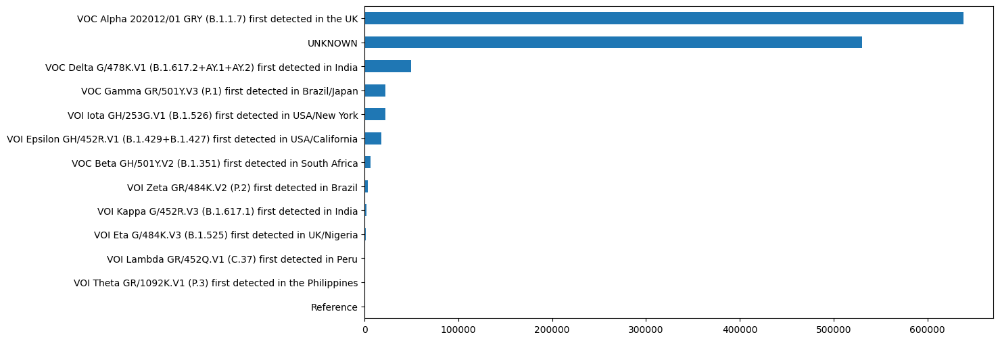

In [16]:
plt.figure(figsize=(12,6))
data['Variant'].value_counts().plot.barh().invert_yaxis()
plt.show()

In [17]:
Alpha = data[(data['Variant'] == "VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK") & (data['CollectionDate'] >= '2021-01-01') & (data['CollectionDate'] != 'NaT')].sample(n=6000, random_state=1).copy()
Beta = data[(data['Variant'] == "VOC Beta GH/501Y.V2 (B.1.351) first detected in South Africa") & (data['CollectionDate'] >= '2021-01-01') & (data['CollectionDate'] != 'NaT')].sample(n=6000, random_state=1).copy()
Gamma = data[(data['Variant'] == "VOC Gamma GR/501Y.V3 (P.1) first detected in Brazil/Japan") & (data['CollectionDate'] >= '2021-01-01') & (data['CollectionDate'] != 'NaT')].sample(n=6000, random_state=1).copy()
Delta = data[(data['Variant'] == "VOC Delta G/478K.V1 (B.1.617.2+AY.1+AY.2) first detected in India") & (data['CollectionDate'] >= '2021-01-01') & (data['CollectionDate'] != 'NaT')].sample(n=6000, random_state=1).copy()
Epsilon = data[(data['Variant'] == "VOI Epsilon GH/452R.V1 (B.1.429+B.1.427) first detected in USA/California") & (data['CollectionDate'] >= '2021-01-01') & (data['CollectionDate'] != 'NaT')].sample(n=6000, random_state=1).copy()
Iota = data[(data['Variant'] == "VOI Iota GH/253G.V1 (B.1.526) first detected in USA/New York") & (data['CollectionDate'] >= '2021-01-01') & (data['CollectionDate'] != 'NaT')].sample(n=6000, random_state=1).copy()

df = pd.concat([Alpha, Beta, Gamma, Delta, Epsilon, Iota])
df['Month'] = pd.DatetimeIndex(df['CollectionDate']).month_name()

In [18]:
df.head()

,VirusName,Type,AccessionID,CollectionDate,Location,AdditionalLocationInformation,SequenceLength,Host,PatientAge,Gender,Clade,PangoLineage,PangolinVersion,Variant,AASubstitutions,SubmissionDate,IsReference,IsComplete,IsHighCoverage,IsLowCoverage,NContent,GCContent,Region,Country,Division,Location1,Sublocation1,Sublocation2,Month
550317,hCoV-19/France/PAC-HCL021019095501/2021,betacoronavirus,EPI_ISL_1359802,2021-01-29,Europe / France / Provence-Alpes-Cote d'Azur / Mouans-Sartoux / /,NaN,29808,Human,62.0,FEMALE,GRY,B.1.1.7,2021-06-15,VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK,"[Spike_H69del, NS8_Q27stop, NSP3_T183I, Spike_D979Y, Spike_T716I, NSP6_S106del, N_R203K, Spike_A570D, NSP13_K460R, Spike_N501Y, NSP3_I1412T, NS8_R52I, Spike_P681H, Spike_Y144del, NSP6_G107del, NSP3_A890D, Spike_D1118H, NSP6_F108del, NS8_Y73C, N_G204R, Spike_V70del, NSP12_P323L, Spike_D614G, N_D3L, Spike_S982A, N_S235F]",2021-03-25,0,1,1,0,0.000000,0.379831,Europe,France,Provence-Alpes-Cote d'Azur,Mouans-Sartoux,<undefined>,<undefined>,January
963157,hCoV-19/Germany/SN-RKI-I-133329/2021,betacoronavirus,EPI_ISL_2115649,2021-04-22,Europe / Germany / Saxony / / /,NaN,29854,Human,-1.0,UNKNOWN,GRY,B.1.1.7,2021-06-15,VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK,"[NSP3_E195K, Spike_H69del, NS8_Q27stop, NSP3_T183I, Spike_T716I, NSP6_S106del, N_R203K, Spike_A570D, Spike_N501Y, NSP3_I1412T, NS8_R52I, NS3_T217I, Spike_P681H, Spike_Y144del, NSP6_G107del, NSP3_A890D, Spike_D1118H, NSP6_F108del, NS8_Y73C, N_G204P, Spike_V70del, NSP12_P323L, Spike_D614G, N_D3L, Spike_S982A, NS3_V112A, N_S235F]",2021-05-17,0,1,1,0,0.000067,0.379439,Europe,Germany,Saxony,<undefined>,<undefined>,<undefined>,April
717790,hCoV-19/England/ALDP-14E1C82/2021,betacoronavirus,EPI_ISL_1632103,2021-04-07,Europe / United Kingdom / England / / /,NaN,29763,Human,-1.0,UNKNOWN,GRY,B.1.1.7,2021-06-15,VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK,"[Spike_H69del, NS8_Q27stop, NSP3_T183I, Spike_T716I, NS8_K68stop, NSP6_S106del, N_R203K, Spike_A570D, NS8_R101H, Spike_N501Y, NSP3_I1412T, NS8_R52I, Spike_P681H, Spike_Y144del, NSP6_G107del, NSP3_A890D, Spike_D1118H, NSP6_F108del, NS8_Y73C, N_G204R, Spike_V70del, NSP12_P323L, Spike_D614G, N_D3L, Spike_S982A, N_S235F]",2021-04-18,0,1,1,0,0.000000,0.379767,Europe,United Kingdom,England,<undefined>,<undefined>,<undefined>,April
919232,hCoV-19/USA/MN-MDH-6629/2021,betacoronavirus,EPI_ISL_2018509,2021-04-14,North America / USA / Minnesota / / /,NaN,29763,Human,-1.0,UNKNOWN,GRY,B.1.1.7,2021-06-15,VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK,"[Spike_H69del, NS8_Q27stop, NSP3_T183I, Spike_T716I, NS8_K68stop, NSP6_S106del, N_R203K, Spike_A570D, Spike_N501Y, NSP3_I1412T, NS8_R52I, Spike_P681H, Spike_Y144del, NSP3_T1063I, NS8_C61F, NSP12_P227L, NSP6_G107del, NSP3_A890D, Spike_D1118H, NSP6_F108del, NS8_Y73C, NSP3_M1441I, Spike_L822F, N_G204R, Spike_V70del, NSP12_P323L, Spike_D614G, N_D3L, Spike_S982A, N_S235F]",2021-05-11,0,1,1,0,0.000000,0.379632,North America,USA,Minnesota,<undefined>,<undefined>,<undefined>,April
420221,hCoV-19/USA/MN-MDH-2932/2021,betacoronavirus,EPI_ISL_1132798,2021-02-06,North America / USA / Minnesota / / /,NaN,29798,Human,-1.0,UNKNOWN,GRY,B.1.1.7,2021-06-15,VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK,"[Spike_H69del, NS8_Q27stop, NSP2_V157F, NSP3_T183I, NSP15_D219Y, Spike_T716I, NSP6_S106del, N_R203K, Spike_A570D, NSP8_Q24R, NSP2_A419V, NSP13_K460R, Spike_N501Y, NSP3_I1412T, NS8_R52I, Spike_P681H, Spike_Y144del, NSP6_G107del, NSP3_A890D, Spike_D1118H, NSP6_F108del, NS8_Y73C, N_G204R, Spike_V70del, NSP12_P323L, Spike_D614G, N_D3L, Spike_S982A, N_S235F]",2021-03-03,0,1,1,0,0.000000,0.379723,North America,USA,Minnesota,<undefined>,<undefined>,<undefined>,February


In [19]:
df['AASubstitutions'] = df['AASubstitutions'].apply(tuple)
corpus = df['AASubstitutions'].drop_duplicates()
pprint.pprint(corpus)

550317                                                      (Spike_H69del, NS8_Q27stop, NSP3_T183I, Spike_D979Y, Spike_T716I, NSP6_S106del, N_R203K, Spike_A570D, NSP13_K460R, Spike_N501Y, NSP3_I1412T, NS8_R52I, Spike_P681H, Spike_Y144del, NSP6_G107del, NSP3_A890D, Spike_D1118H, NSP6_F108del, NS8_Y73C, N_G204R, Spike_V70del, NSP12_P323L, Spike_D614G, N_D3L, Spike_S982A, N_S235F)
963157                                              (NSP3_E195K, Spike_H69del, NS8_Q27stop, NSP3_T183I, Spike_T716I, NSP6_S106del, N_R203K, Spike_A570D, Spike_N501Y, NSP3_I1412T, NS8_R52I, NS3_T217I, Spike_P681H, Spike_Y144del, NSP6_G107del, NSP3_A890D, Spike_D1118H, NSP6_F108del, NS8_Y73C, N_G204P, Spike_V70del, NSP12_P323L, Spike_D614G, N_D3L, Spike_S982A, NS3_V112A, N_S235F)
717790                                                        (Spike_H69del, NS8_Q27stop, NSP3_T183I, Spike_T716I, NS8_K68stop, NSP6_S106del, N_R203K, Spike_A570D, NS8_R101H, Spike_N501Y, NSP3_I1412T, NS8_R52I, Spike_P681H, Spike_Y144del,

In [20]:
dictionary = corpora.Dictionary(corpus)
print(dictionary)

Dictionary<11917 unique tokens: ['NS8_Q27stop', 'NS8_R52I', 'NS8_Y73C', 'NSP12_P323L', 'NSP13_K460R']...>


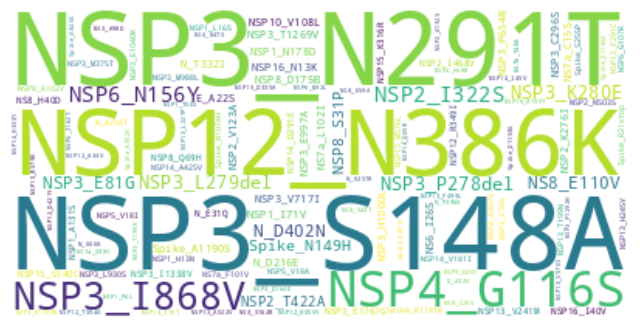

In [21]:
wordcloud = WordCloud(background_color="white").generate_from_frequencies(dictionary.token2id)
fig = plt.figure(figsize=(8, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [22]:
taggedCorpus = [TaggedDocument(d, [i]) for i, d in enumerate(corpus)]

In [23]:
model = Doc2Vec(taggedCorpus, vector_size=300, min_count=1, dm=0, dbow_words=1, workers=multiprocessing.cpu_count(), epochs=1)

In [24]:
df_corpus = pd.DataFrame(taggedCorpus, columns=['AASubstitutions', 'Tag'])
df_corpus['VecSubstitutions'] = [model.docvecs[i[0]] for i in df_corpus['Tag']]
df = pd.merge(df_corpus, df, on=['AASubstitutions'])
df = pd.concat([df['VecSubstitutions'].apply(pd.Series).add_prefix('Dim'), df], axis=1)

<ipython-input-24-1c33d2a0e12a>:2: DeprecationWarning: Call to deprecated `docvecs` (The `docvecs` property has been renamed `dv`.).
  df_corpus['VecSubstitutions'] = [model.docvecs[i[0]] for i in df_corpus['Tag']]


In [30]:
#df=pd.read_csv('/content/drive/MyDrive/vectors.csv')

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/vectors.csv'

In [25]:
print(df.columns)

Index(['Dim0', 'Dim1', 'Dim2', 'Dim3', 'Dim4', 'Dim5', 'Dim6', 'Dim7', 'Dim8',
       'Dim9',
       ...
       'IsLowCoverage', 'NContent', 'GCContent', 'Region', 'Country',
       'Division', 'Location1', 'Sublocation1', 'Sublocation2', 'Month'],
      dtype='object', length=331)


In [26]:
print(df.iloc[:,300:].columns)

Index(['AASubstitutions', 'Tag', 'VecSubstitutions', 'VirusName', 'Type',
       'AccessionID', 'CollectionDate', 'Location',
       'AdditionalLocationInformation', 'SequenceLength', 'Host', 'PatientAge',
       'Gender', 'Clade', 'PangoLineage', 'PangolinVersion', 'Variant',
       'SubmissionDate', 'IsReference', 'IsComplete', 'IsHighCoverage',
       'IsLowCoverage', 'NContent', 'GCContent', 'Region', 'Country',
       'Division', 'Location1', 'Sublocation1', 'Sublocation2', 'Month'],
      dtype='object')


In [27]:
print(df.iloc[:,0:300].columns)

Index(['Dim0', 'Dim1', 'Dim2', 'Dim3', 'Dim4', 'Dim5', 'Dim6', 'Dim7', 'Dim8',
       'Dim9',
       ...
       'Dim290', 'Dim291', 'Dim292', 'Dim293', 'Dim294', 'Dim295', 'Dim296',
       'Dim297', 'Dim298', 'Dim299'],
      dtype='object', length=300)


In [28]:
january = df[df['Month'] == "January"].copy()
february = df[df['Month'] == "February"].copy()
march = df[df['Month'] == "March"].copy()
april = df[df['Month'] == "April"].copy()
may = df[df['Month'] == "May"].copy()
june = df[df['Month'] == "June"].copy()

In [29]:
print(len(january))
print(len(february))
print(len(march))
print(len(april))
print(len(may))
print(len(june))

2182
4333
8936
9550
7274
3725


In [30]:
alpha_january = january[january['Variant'] == "VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK"].copy()
beta_january = january[january['Variant'] == "VOC Beta GH/501Y.V2 (B.1.351) first detected in South Africa"].copy()
gamma_january = january[january['Variant'] == "VOC Gamma GR/501Y.V3 (P.1) first detected in Brazil/Japan"].copy()
delta_january = january[january['Variant'] == "VOC Delta G/478K.V1 (B.1.617.2+AY.1+AY.2) first detected in India"].copy()
epsilon_january = january[january['Variant'] == "VOI Epsilon GH/452R.V1 (B.1.429+B.1.427) first detected in USA/California"].copy()
iota_january = january[january['Variant'] == "VOI Iota GH/253G.V1 (B.1.526) first detected in USA/New York"].copy()

print(len(alpha_january))
print(len(beta_january))
print(len(gamma_january))
print(len(delta_january))
print(len(epsilon_january))
print(len(iota_january))

453
346
94
0
1165
124


In [31]:
alpha_february = february[february['Variant'] == "VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK"].copy()
beta_february = february[february['Variant'] == "VOC Beta GH/501Y.V2 (B.1.351) first detected in South Africa"].copy()
gamma_february = february[february['Variant'] == "VOC Gamma GR/501Y.V3 (P.1) first detected in Brazil/Japan"].copy()
delta_february = february[february['Variant'] == "VOC Delta G/478K.V1 (B.1.617.2+AY.1+AY.2) first detected in India"].copy()
epsilon_february = february[february['Variant'] == "VOI Epsilon GH/452R.V1 (B.1.429+B.1.427) first detected in USA/California"].copy()
iota_february = february[february['Variant'] == "VOI Iota GH/253G.V1 (B.1.526) first detected in USA/New York"].copy()

print(len(alpha_february))
print(len(beta_february))
print(len(gamma_february))
print(len(delta_february))
print(len(epsilon_february))
print(len(iota_february))

781
1331
289
1
1470
461


In [32]:
alpha_march = march[march['Variant'] == "VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK"].copy()
beta_march = march[march['Variant'] == "VOC Beta GH/501Y.V2 (B.1.351) first detected in South Africa"].copy()
gamma_march = march[march['Variant'] == "VOC Gamma GR/501Y.V3 (P.1) first detected in Brazil/Japan"].copy()
delta_march = march[march['Variant'] == "VOC Delta G/478K.V1 (B.1.617.2+AY.1+AY.2) first detected in India"].copy()
epsilon_march = march[march['Variant'] == "VOI Epsilon GH/452R.V1 (B.1.429+B.1.427) first detected in USA/California"].copy()
iota_march = march[march['Variant'] == "VOI Iota GH/253G.V1 (B.1.526) first detected in USA/New York"].copy()

print(len(alpha_march))
print(len(beta_march))
print(len(gamma_march))
print(len(delta_march))
print(len(epsilon_march))
print(len(iota_march))

1781
2260
1164
29
1914
1788


In [33]:
alpha_april = april[april['Variant'] == "VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK"].copy()
beta_april = april[april['Variant'] == "VOC Beta GH/501Y.V2 (B.1.351) first detected in South Africa"].copy()
gamma_april = april[april['Variant'] == "VOC Gamma GR/501Y.V3 (P.1) first detected in Brazil/Japan"].copy()
delta_april = april[april['Variant'] == "VOC Delta G/478K.V1 (B.1.617.2+AY.1+AY.2) first detected in India"].copy()
epsilon_april = april[april['Variant'] == "VOI Epsilon GH/452R.V1 (B.1.429+B.1.427) first detected in USA/California"].copy()
iota_april = april[april['Variant'] == "VOI Iota GH/253G.V1 (B.1.526) first detected in USA/New York"].copy()

print(len(alpha_april))
print(len(beta_april))
print(len(gamma_april))
print(len(delta_april))
print(len(epsilon_april))
print(len(iota_april))

1773
1395
2278
374
1205
2525


In [34]:
alpha_may = may[may['Variant'] == "VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK"].copy()
beta_may = may[may['Variant'] == "VOC Beta GH/501Y.V2 (B.1.351) first detected in South Africa"].copy()
gamma_may = may[may['Variant'] == "VOC Gamma GR/501Y.V3 (P.1) first detected in Brazil/Japan"].copy()
delta_may = may[may['Variant'] == "VOC Delta G/478K.V1 (B.1.617.2+AY.1+AY.2) first detected in India"].copy()
epsilon_may = may[may['Variant'] == "VOI Epsilon GH/452R.V1 (B.1.429+B.1.427) first detected in USA/California"].copy()
iota_may = may[may['Variant'] == "VOI Iota GH/253G.V1 (B.1.526) first detected in USA/New York"].copy()

print(len(alpha_may))
print(len(beta_may))
print(len(gamma_may))
print(len(delta_may))
print(len(epsilon_may))
print(len(iota_may))

1072
575
1920
2461
228
1018


In [35]:
alpha_june = june[june['Variant'] == "VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK"].copy()
beta_june = june[june['Variant'] == "VOC Beta GH/501Y.V2 (B.1.351) first detected in South Africa"].copy()
gamma_june = june[june['Variant'] == "VOC Gamma GR/501Y.V3 (P.1) first detected in Brazil/Japan"].copy()
delta_june = june[june['Variant'] == "VOC Delta G/478K.V1 (B.1.617.2+AY.1+AY.2) first detected in India"].copy()
epsilon_june = june[june['Variant'] == "VOI Epsilon GH/452R.V1 (B.1.429+B.1.427) first detected in USA/California"].copy()
iota_june = june[june['Variant'] == "VOI Iota GH/253G.V1 (B.1.526) first detected in USA/New York"].copy()

print(len(alpha_june))
print(len(beta_june))
print(len(gamma_june))
print(len(delta_june))
print(len(epsilon_june))
print(len(iota_june))

140
93
255
3135
18
84


### PCA

In [44]:
pca2 = PCA(n_components=2)
main_2_PCA = pca2.fit_transform(df.iloc[:,0:300])

pca_2_pieces = pd.DataFrame(main_2_PCA)

pca2.explained_variance_ratio_

array([0.6172133 , 0.20326672], dtype=float32)

In [45]:
pca3 = PCA(n_components=3)
main_3_PCA = pca3.fit_transform(df.iloc[:,0:300])

pca_3_pieces = pd.DataFrame(main_3_PCA)

pca3.explained_variance_ratio_

array([0.61721313, 0.20326674, 0.06889644], dtype=float32)

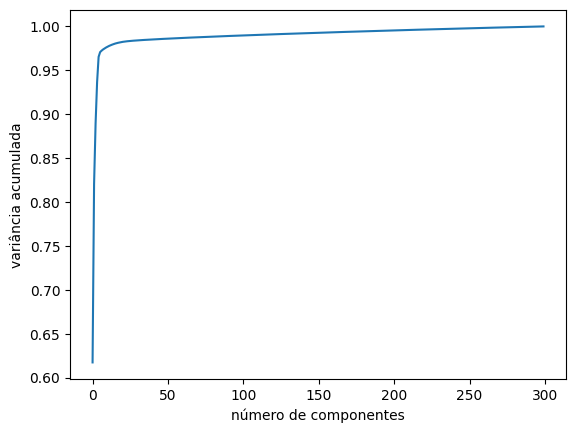

In [46]:
pca = PCA().fit(df.iloc[:,0:300])
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('número de componentes')
plt.ylabel('variância acumulada');

In [52]:
df_pca2 = pd.concat([pca_2_pieces, df.iloc[:,301:]], axis=1)
df_pca3 = pd.concat([pca_3_pieces, df], axis=1)

In [53]:
df_pca2.columns

Index([                              0,                               1,
                                 'Tag',              'VecSubstitutions',
                           'VirusName',                          'Type',
                         'AccessionID',                'CollectionDate',
                            'Location', 'AdditionalLocationInformation',
                      'SequenceLength',                          'Host',
                          'PatientAge',                        'Gender',
                               'Clade',                  'PangoLineage',
                     'PangolinVersion',                       'Variant',
                      'SubmissionDate',                   'IsReference',
                          'IsComplete',                'IsHighCoverage',
                       'IsLowCoverage',                      'NContent',
                           'GCContent',                        'Region',
                             'Country',            

In [54]:
x_min_pca = math.floor(df_pca2[0].min()*2)/2
x_max_pca = math.ceil(df_pca2[0].max()*2)/2
y_min_pca = math.floor(df_pca2[1].min()*10)/10
y_max_pca = math.ceil(df_pca2[1].max()*10)/10
z_min_pca = math.floor(df_pca3[2].min()*10)/10
z_max_pca = math.ceil(df_pca3[2].max()*10)/10

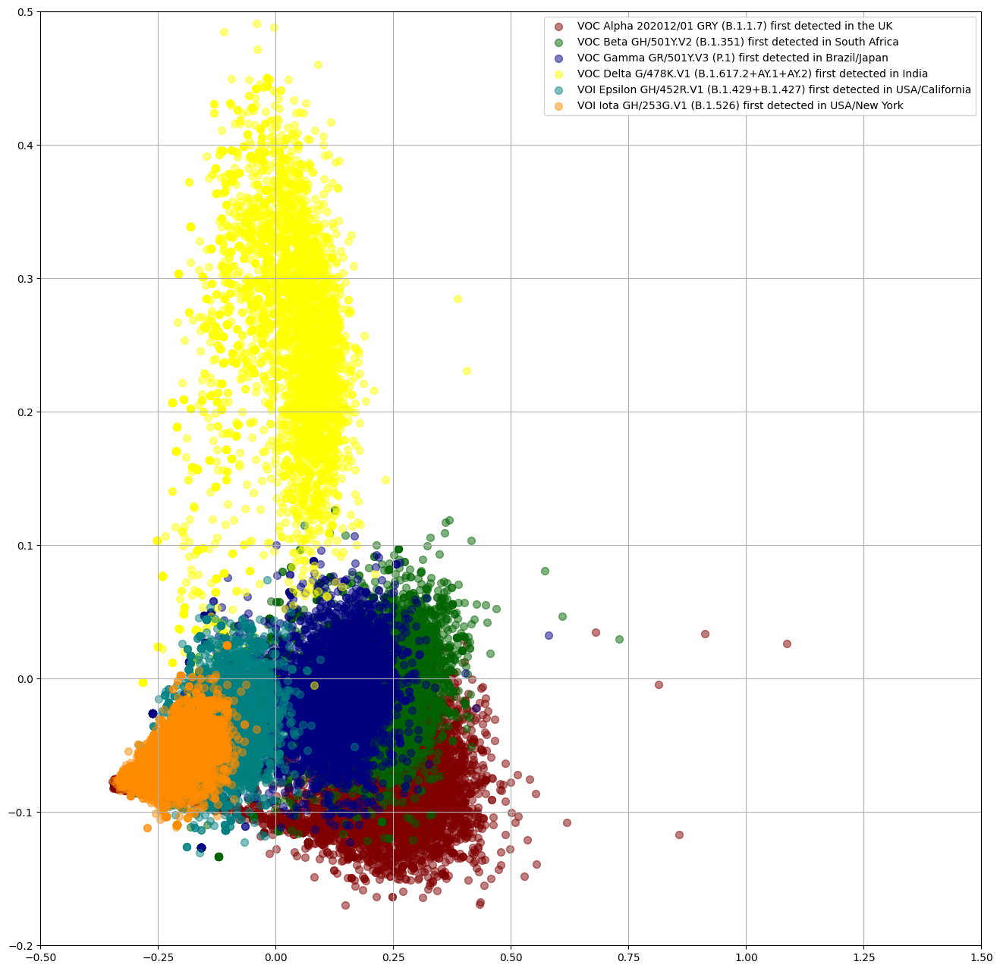

In [42]:
plot2d_variant(df_pca2, x_min_pca, x_max_pca, y_min_pca, y_max_pca)

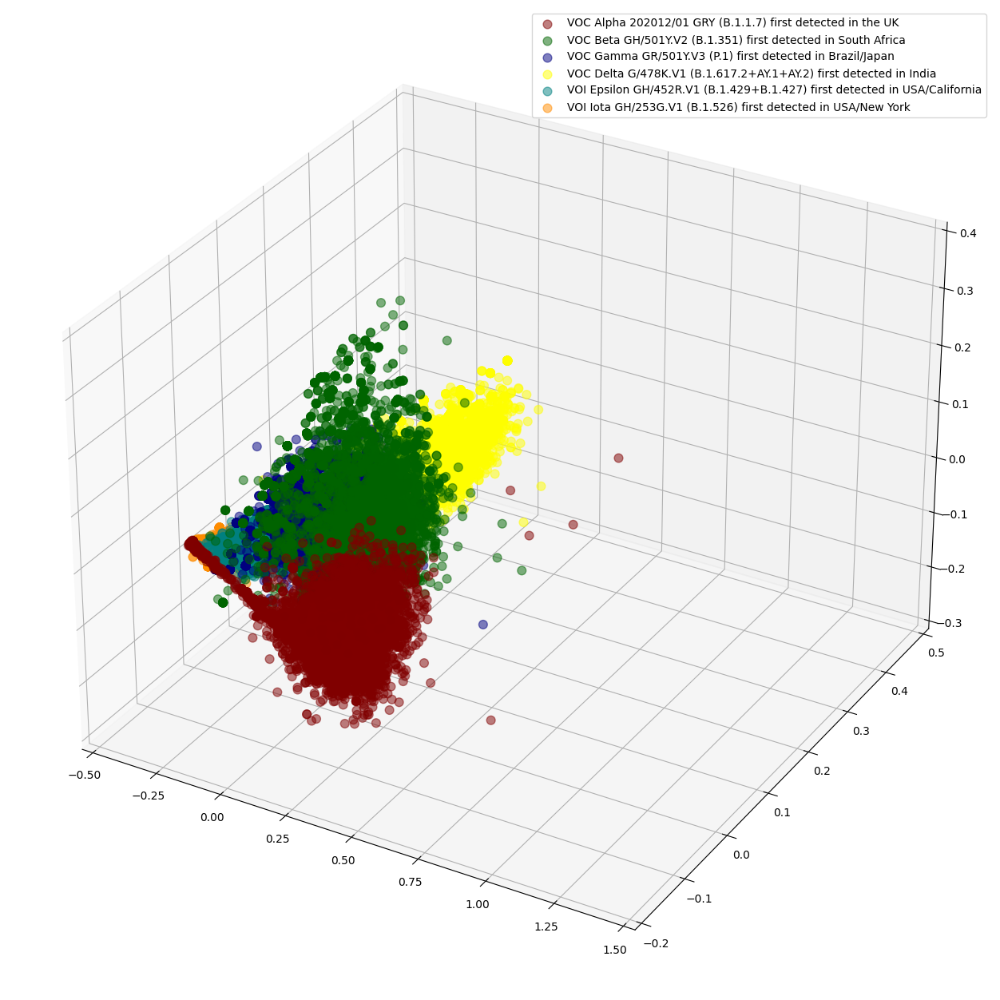

In [55]:
plot3d_variant(df_pca3, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)

In [56]:
alpha_pca2 = df_pca2[df_pca2['Variant'] == "VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK"].copy()
beta_pca2 = df_pca2[df_pca2['Variant'] == "VOC Beta GH/501Y.V2 (B.1.351) first detected in South Africa"].copy()
gamma_pca2 = df_pca2[df_pca2['Variant'] == "VOC Gamma GR/501Y.V3 (P.1) first detected in Brazil/Japan"].copy()
delta_pca2 = df_pca2[df_pca2['Variant'] == "VOC Delta G/478K.V1 (B.1.617.2+AY.1+AY.2) first detected in India"].copy()
epsilon_pca2 = df_pca2[df_pca2['Variant'] == "VOI Epsilon GH/452R.V1 (B.1.429+B.1.427) first detected in USA/California"].copy()
iota_pca2 = df_pca2[df_pca2['Variant'] == "VOI Iota GH/253G.V1 (B.1.526) first detected in USA/New York"].copy()

alpha_pca3 = df_pca3[df_pca3['Variant'] == "VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK"].copy()
beta_pca3 = df_pca3[df_pca3['Variant'] == "VOC Beta GH/501Y.V2 (B.1.351) first detected in South Africa"].copy()
gamma_pca3 = df_pca3[df_pca3['Variant'] == "VOC Gamma GR/501Y.V3 (P.1) first detected in Brazil/Japan"].copy()
delta_pca3 = df_pca3[df_pca3['Variant'] == "VOC Delta G/478K.V1 (B.1.617.2+AY.1+AY.2) first detected in India"].copy()
epsilon_pca3 = df_pca3[df_pca3['Variant'] == "VOI Epsilon GH/452R.V1 (B.1.429+B.1.427) first detected in USA/California"].copy()
iota_pca3 = df_pca3[df_pca3['Variant'] == "VOI Iota GH/253G.V1 (B.1.526) first detected in USA/New York"].copy()

In [57]:
entropy_pca2 = entropy(df_pca2[0], df_pca2[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_pca3 = entropy_3d(df_pca3[0], df_pca3[1], df_pca3[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)

print(entropy_pca2)
print(entropy_pca3)

7.090954002025768
9.19948575881516


In [58]:
entropy_pca2 = entropy(df_pca2[0], df_pca2[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_pca3 = entropy_3d(df_pca3[0], df_pca3[1], df_pca3[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)

print(entropy_pca2)
print(entropy_pca3)

7.090954002025768
9.19948575881516


In [59]:
entropy_alpha_pca2 = entropy(alpha_pca2[0], alpha_pca2[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_beta_pca2 = entropy(beta_pca2[0], beta_pca2[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_gamma_pca2 = entropy(gamma_pca2[0], gamma_pca2[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_delta_pca2 = entropy(delta_pca2[0], delta_pca2[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_epsilon_pca2 = entropy(epsilon_pca2[0], epsilon_pca2[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_iota_pca2 = entropy(iota_pca2[0], iota_pca2[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)

print(entropy_alpha_pca2)
print(entropy_beta_pca2)
print(entropy_gamma_pca2)
print(entropy_delta_pca2)
print(entropy_epsilon_pca2)
print(entropy_iota_pca2)

5.844260513982995
6.037796321618881
5.642428224065592
5.993621795635726
4.767317493234838
3.801065894432977


In [60]:
entropy_alpha_pca2 = entropy(alpha_pca2[0], alpha_pca2[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_beta_pca2 = entropy(beta_pca2[0], beta_pca2[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_gamma_pca2 = entropy(gamma_pca2[0], gamma_pca2[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_delta_pca2 = entropy(delta_pca2[0], delta_pca2[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_epsilon_pca2 = entropy(epsilon_pca2[0], epsilon_pca2[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_iota_pca2 = entropy(iota_pca2[0], iota_pca2[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)

print(entropy_alpha_pca2)
print(entropy_beta_pca2)
print(entropy_gamma_pca2)
print(entropy_delta_pca2)
print(entropy_epsilon_pca2)
print(entropy_iota_pca2)

5.844260513982995
6.037796321618881
5.642428224065592
5.993621795635726
4.767317493234838
3.801065894432977


In [61]:
entropy_alpha_pca3 = entropy_3d(alpha_pca3[0], alpha_pca3[1], alpha_pca3[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_beta_pca3 = entropy_3d(beta_pca3[0], beta_pca3[1], beta_pca3[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_gamma_pca3 = entropy_3d(gamma_pca3[0], gamma_pca3[1], gamma_pca3[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_delta_pca3 = entropy_3d(delta_pca3[0], delta_pca3[1], delta_pca3[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_epsilon_pca3 = entropy_3d(epsilon_pca3[0], epsilon_pca3[1], epsilon_pca3[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_iota_pca3 = entropy_3d(iota_pca3[0], iota_pca3[1], iota_pca3[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)

print(entropy_alpha_pca3)
print(entropy_beta_pca3)
print(entropy_gamma_pca3)
print(entropy_delta_pca3)
print(entropy_epsilon_pca3)
print(entropy_iota_pca3)

7.582919191129163
8.671821873945834
7.924783573153084
7.344800819918255
6.3586083110304354
4.614390297174159


#### ALPHA

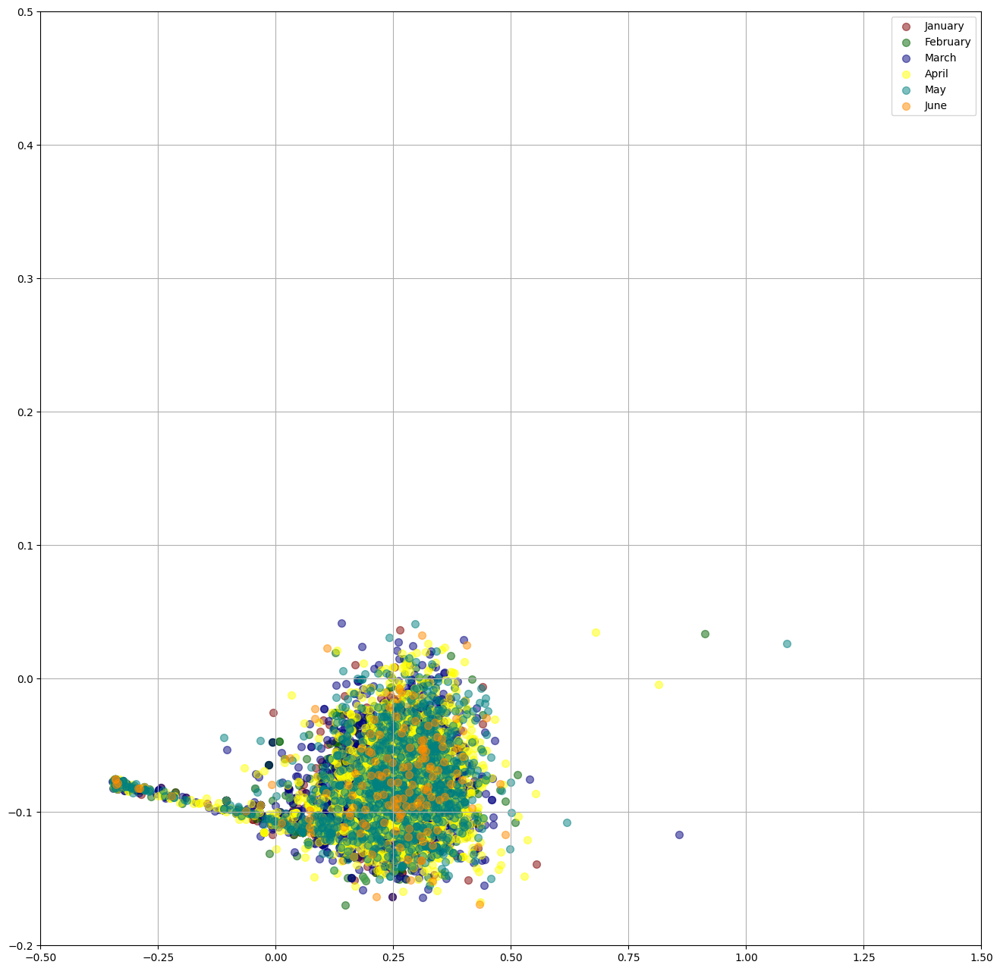

In [62]:
plot2d_month(alpha_pca2, x_min_pca, x_max_pca, y_min_pca, y_max_pca)

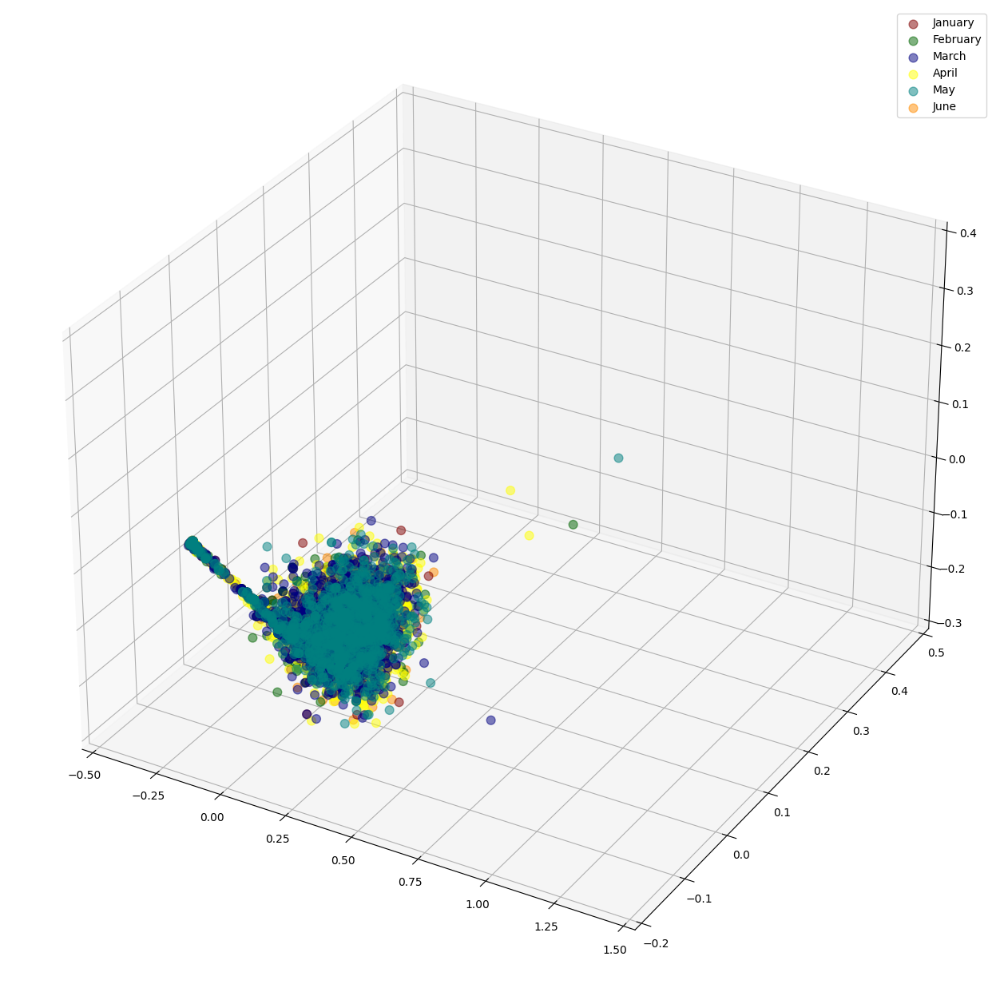

In [63]:
plot3d_month(alpha_pca3, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)

In [64]:
alpha_pca_january = alpha_pca3[alpha_pca3['Month'] == "January"].copy()
alpha_pca_february = alpha_pca3[alpha_pca3['Month'] == "February"].copy()
alpha_pca_march = alpha_pca3[alpha_pca3['Month'] == "March"].copy()
alpha_pca_april = alpha_pca3[alpha_pca3['Month'] == "April"].copy()
alpha_pca_may = alpha_pca3[alpha_pca3['Month'] == "May"].copy()
alpha_pca_june = alpha_pca3[alpha_pca3['Month'] == "June"].copy()

In [65]:
entropy_alpha_pca2_january = entropy(alpha_pca_january[0], alpha_pca_january[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_alpha_pca2_february = entropy(alpha_pca_february[0], alpha_pca_february[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_alpha_pca2_march = entropy(alpha_pca_march[0], alpha_pca_march[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_alpha_pca2_april = entropy(alpha_pca_april[0], alpha_pca_april[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_alpha_pca2_may = entropy(alpha_pca_may[0], alpha_pca_may[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_alpha_pca2_june = entropy(alpha_pca_june[0], alpha_pca_june[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)

print(entropy_alpha_pca2_january)
print(entropy_alpha_pca2_february)
print(entropy_alpha_pca2_march)
print(entropy_alpha_pca2_april)
print(entropy_alpha_pca2_may)
print(entropy_alpha_pca2_june)

5.595879208854402
5.643183205381905
5.760134478129156
5.820451103032635
5.790349764776114
5.323587039303135


In [66]:
entropy_alpha_pca3_january = entropy_3d(alpha_pca_january[0], alpha_pca_january[1], alpha_pca_january[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_alpha_pca3_february = entropy_3d(alpha_pca_february[0], alpha_pca_february[1], alpha_pca_february[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_alpha_pca3_march = entropy_3d(alpha_pca_march[0], alpha_pca_march[1], alpha_pca_march[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_alpha_pca3_april = entropy_3d(alpha_pca_april[0], alpha_pca_april[1], alpha_pca_april[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_alpha_pca3_may = entropy_3d(alpha_pca_may[0], alpha_pca_may[1], alpha_pca_may[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_alpha_pca3_june = entropy_3d(alpha_pca_june[0], alpha_pca_june[1], alpha_pca_june[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)

print(entropy_alpha_pca3_january)
print(entropy_alpha_pca3_february)
print(entropy_alpha_pca3_march)
print(entropy_alpha_pca3_april)
print(entropy_alpha_pca3_may)
print(entropy_alpha_pca3_june)

6.719566860239145
6.937906430756492
7.373832356304124
7.48952591729358
7.386161665478079
6.399718977749132


#### BETA

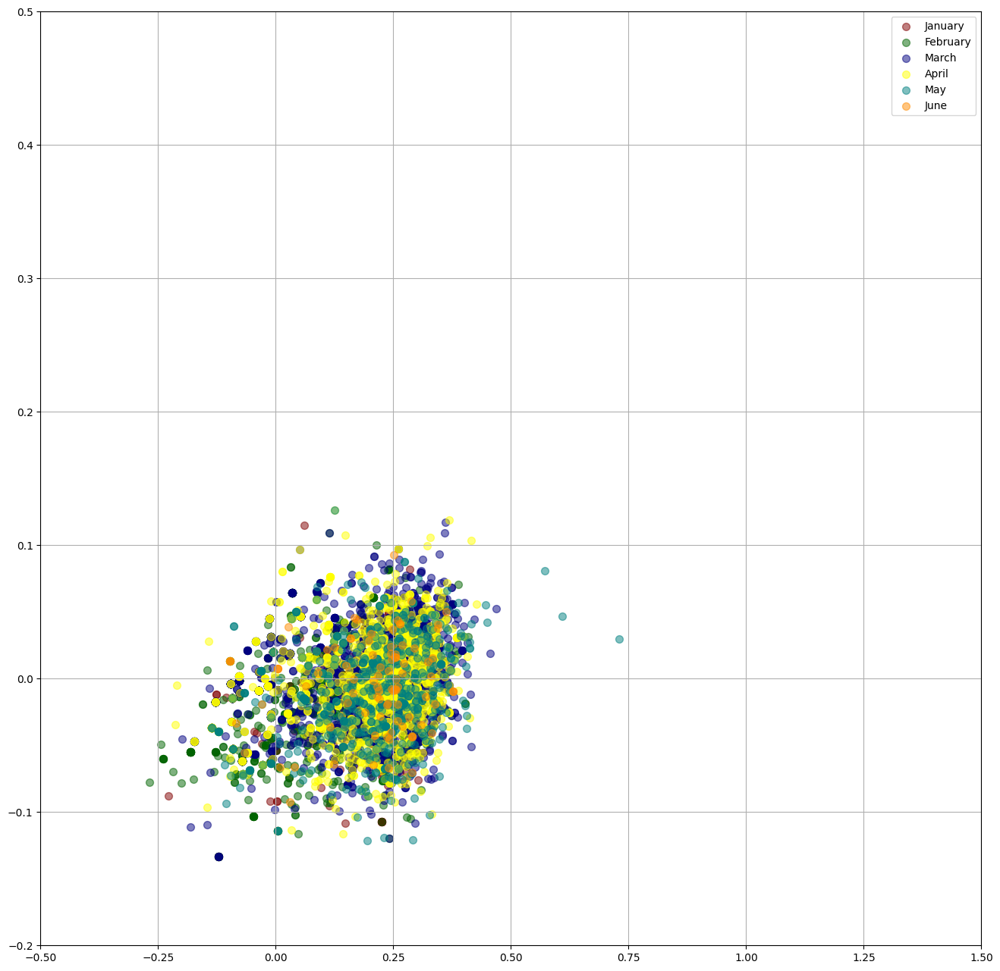

In [67]:
plot2d_month(beta_pca2, x_min_pca, x_max_pca, y_min_pca, y_max_pca)

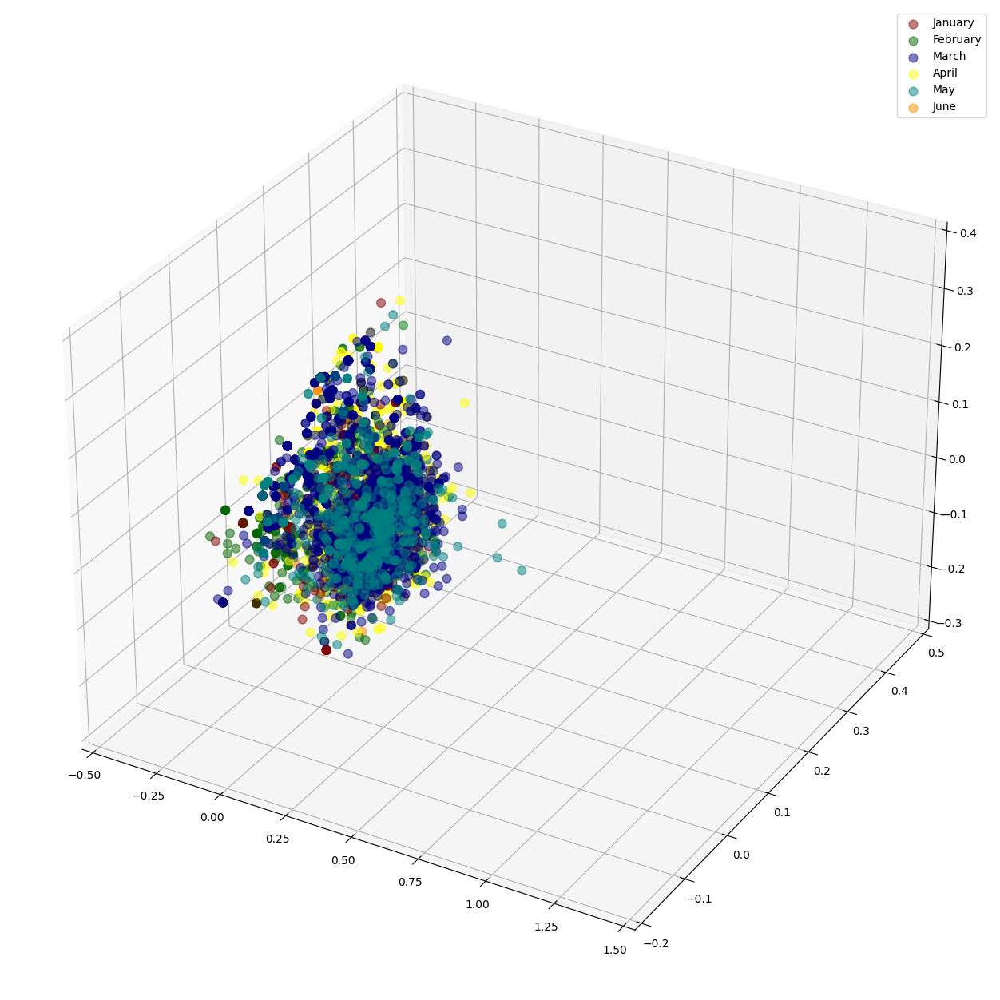

In [68]:
plot3d_month(beta_pca3, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)

In [69]:
beta_pca_january = beta_pca3[beta_pca3['Month'] == "January"].copy()
beta_pca_february = beta_pca3[beta_pca3['Month'] == "February"].copy()
beta_pca_march = beta_pca3[beta_pca3['Month'] == "March"].copy()
beta_pca_april = beta_pca3[beta_pca3['Month'] == "April"].copy()
beta_pca_may = beta_pca3[beta_pca3['Month'] == "May"].copy()
beta_pca_june = beta_pca3[beta_pca3['Month'] == "June"].copy()

In [70]:
entropy_beta_pca2_january = entropy(beta_pca_january[0], beta_pca_january[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_beta_pca2_february = entropy(beta_pca_february[0], beta_pca_february[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_beta_pca2_march = entropy(beta_pca_march[0], beta_pca_march[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_beta_pca2_april = entropy(beta_pca_april[0], beta_pca_april[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_beta_pca2_may = entropy(beta_pca_may[0], beta_pca_may[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_beta_pca2_june = entropy(beta_pca_june[0], beta_pca_june[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)

print(entropy_beta_pca2_january)
print(entropy_beta_pca2_february)
print(entropy_beta_pca2_march)
print(entropy_beta_pca2_april)
print(entropy_beta_pca2_may)
print(entropy_beta_pca2_june)

5.366843477439361
5.714204259455641
5.971471040847716
5.8147301341258055
5.780964461560795
4.97085088051198


In [71]:
entropy_beta_pca3_january = entropy_3d(beta_pca_january[0], beta_pca_january[1], beta_pca_january[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_beta_pca3_february = entropy_3d(beta_pca_february[0], beta_pca_february[1], beta_pca_february[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_beta_pca3_march = entropy_3d(beta_pca_march[0], beta_pca_march[1], beta_pca_march[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_beta_pca3_april = entropy_3d(beta_pca_april[0], beta_pca_april[1], beta_pca_april[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_beta_pca3_may = entropy_3d(beta_pca_may[0], beta_pca_may[1], beta_pca_may[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_beta_pca3_june = entropy_3d(beta_pca_june[0], beta_pca_june[1], beta_pca_june[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)

print(entropy_beta_pca3_january)
print(entropy_beta_pca3_february)
print(entropy_beta_pca3_march)
print(entropy_beta_pca3_april)
print(entropy_beta_pca3_may)
print(entropy_beta_pca3_june)

6.836373542987451
7.511816375346326
8.12517397372224
8.348833534905351
7.851479254428715
6.068465934647632


#### GAMMA

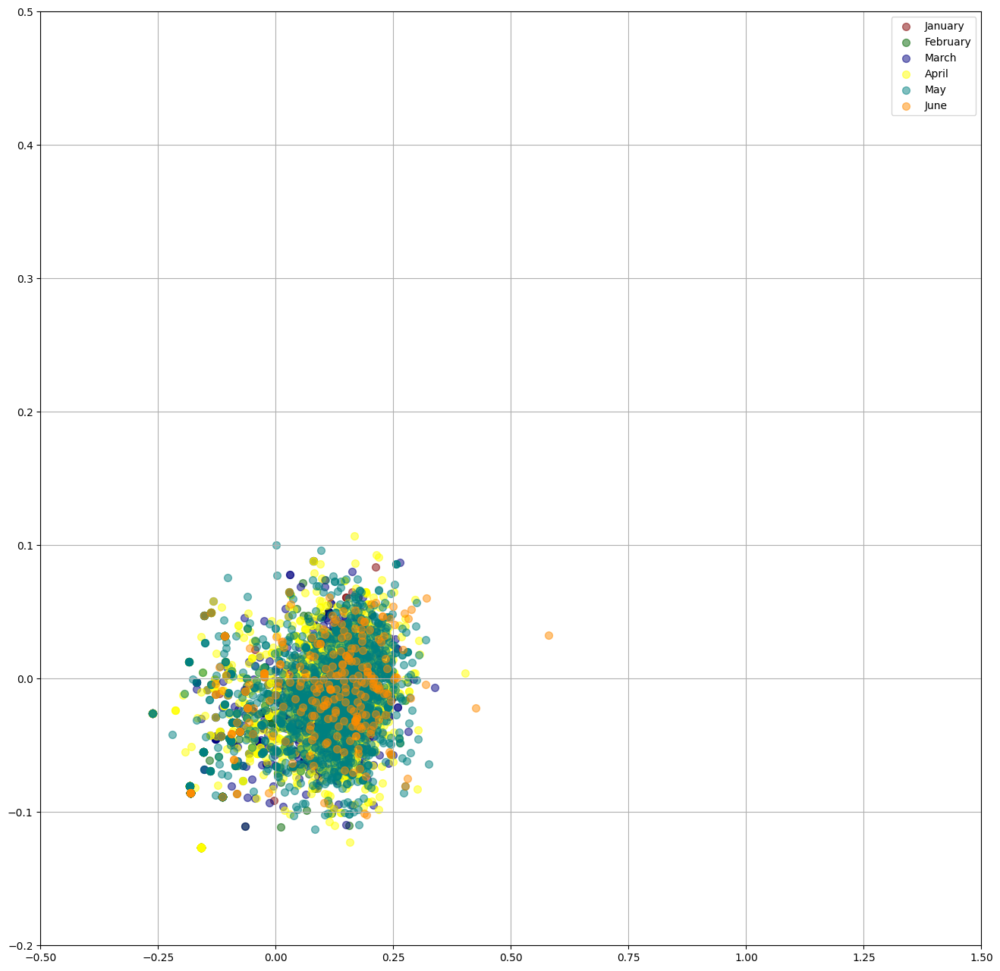

In [72]:
plot2d_month(gamma_pca2, x_min_pca, x_max_pca, y_min_pca, y_max_pca)

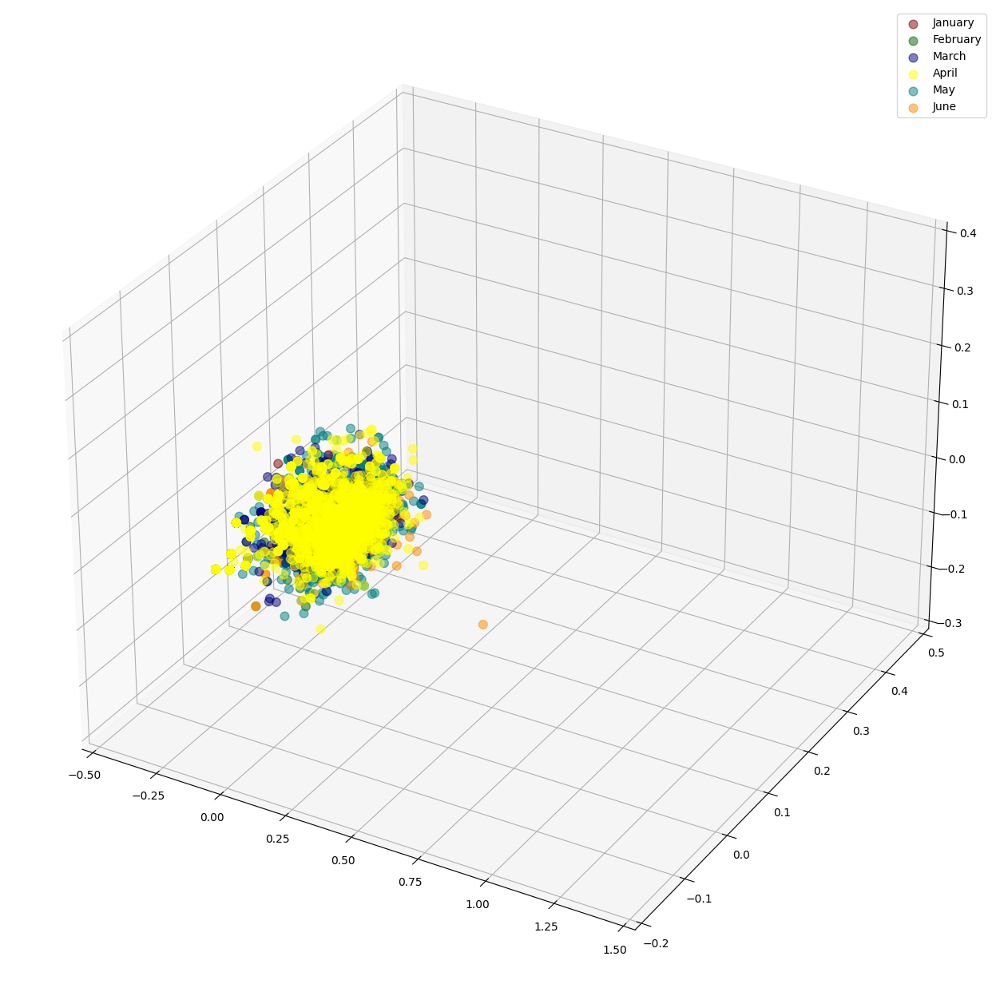

In [73]:
plot3d_month(gamma_pca3, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)

In [74]:
gamma_pca_january = gamma_pca3[gamma_pca3['Month'] == "January"].copy()
gamma_pca_february = gamma_pca3[gamma_pca3['Month'] == "February"].copy()
gamma_pca_march = gamma_pca3[gamma_pca3['Month'] == "March"].copy()
gamma_pca_april = gamma_pca3[gamma_pca3['Month'] == "April"].copy()
gamma_pca_may = gamma_pca3[gamma_pca3['Month'] == "May"].copy()
gamma_pca_june = gamma_pca3[gamma_pca3['Month'] == "June"].copy()

In [75]:
entropy_gamma_pca2_january = entropy(gamma_pca_january[0], gamma_pca_january[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_gamma_pca2_february = entropy(gamma_pca_february[0], gamma_pca_february[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_gamma_pca2_march = entropy(gamma_pca_march[0], gamma_pca_march[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_gamma_pca2_april = entropy(gamma_pca_april[0], gamma_pca_april[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_gamma_pca2_may = entropy(gamma_pca_may[0], gamma_pca_may[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_gamma_pca2_june = entropy(gamma_pca_june[0], gamma_pca_june[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)

print(entropy_gamma_pca2_january)
print(entropy_gamma_pca2_february)
print(entropy_gamma_pca2_march)
print(entropy_gamma_pca2_april)
print(entropy_gamma_pca2_may)
print(entropy_gamma_pca2_june)

3.8927419165639843
4.977564263673723
5.373030874838484
5.616057736828616
5.623348214393717
5.54257102817592


In [76]:
entropy_gamma_pca3_january = entropy_3d(gamma_pca_january[0], gamma_pca_january[1], gamma_pca_january[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_gamma_pca3_february = entropy_3d(gamma_pca_february[0], gamma_pca_february[1], gamma_pca_february[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_gamma_pca3_march = entropy_3d(gamma_pca_march[0], gamma_pca_march[1], gamma_pca_march[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_gamma_pca3_april = entropy_3d(gamma_pca_april[0], gamma_pca_april[1], gamma_pca_april[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_gamma_pca3_may = entropy_3d(gamma_pca_may[0], gamma_pca_may[1], gamma_pca_may[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_gamma_pca3_june = entropy_3d(gamma_pca_june[0], gamma_pca_june[1], gamma_pca_june[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)

print(entropy_gamma_pca3_january)
print(entropy_gamma_pca3_february)
print(entropy_gamma_pca3_march)
print(entropy_gamma_pca3_april)
print(entropy_gamma_pca3_may)
print(entropy_gamma_pca3_june)

4.55177329309795
6.346166222710717
7.253577283125616
7.643870449685816
7.882524209225115
7.0559319428059695


#### DELTA

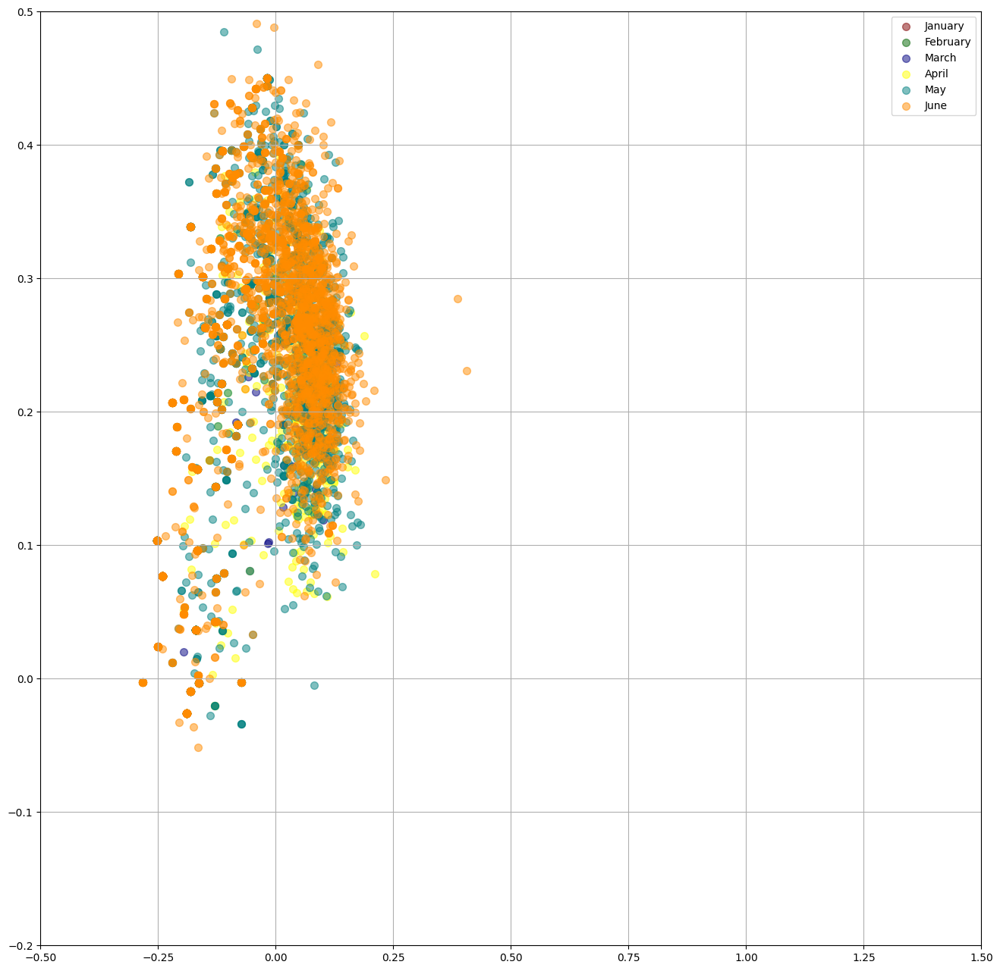

In [77]:
plot2d_month(delta_pca2, x_min_pca, x_max_pca, y_min_pca, y_max_pca)

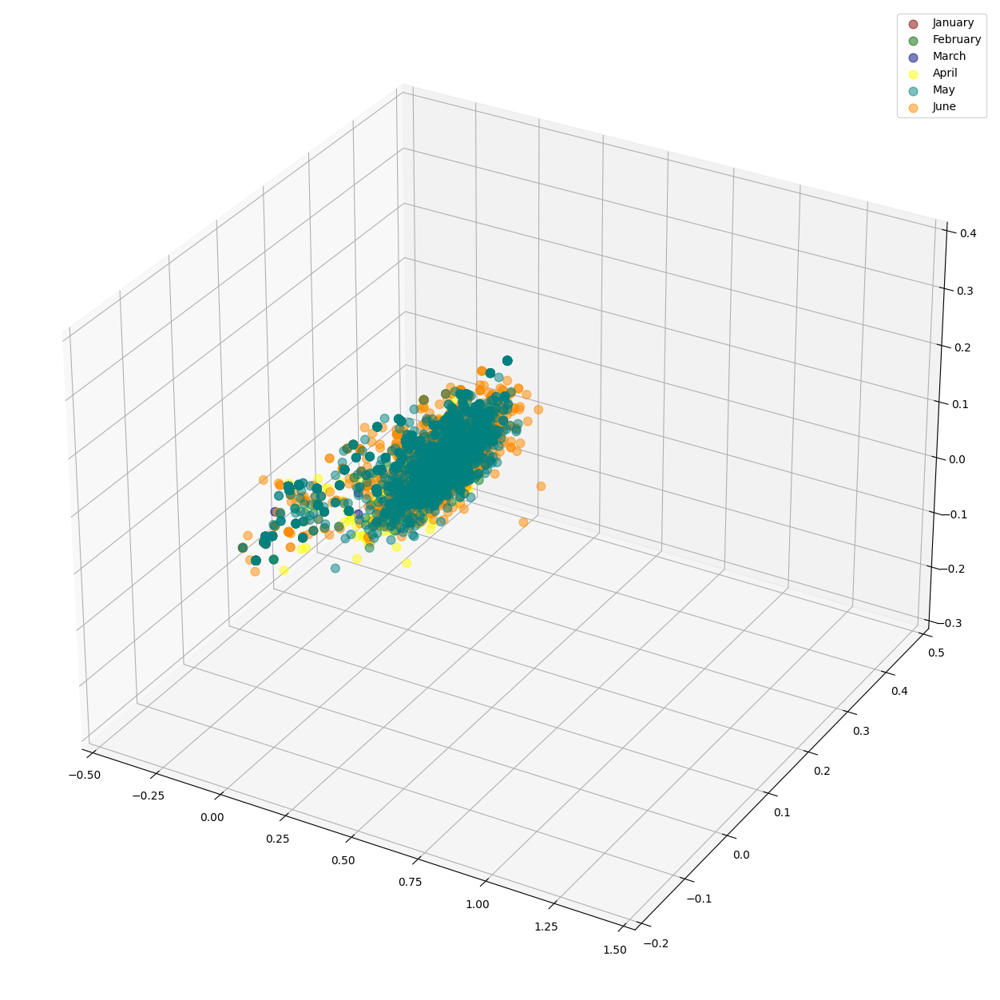

In [78]:
plot3d_month(delta_pca3, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)

In [79]:
delta_pca_january = delta_pca3[delta_pca3['Month'] == "January"].copy()
delta_pca_february = delta_pca3[delta_pca3['Month'] == "February"].copy()
delta_pca_march = delta_pca3[delta_pca3['Month'] == "March"].copy()
delta_pca_april = delta_pca3[delta_pca3['Month'] == "April"].copy()
delta_pca_may = delta_pca3[delta_pca3['Month'] == "May"].copy()
delta_pca_june = delta_pca3[delta_pca3['Month'] == "June"].copy()

In [80]:
entropy_delta_pca2_january = entropy(delta_pca_january[0], delta_pca_january[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_delta_pca2_february = entropy(delta_pca_february[0], delta_pca_february[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_delta_pca2_march = entropy(delta_pca_march[0], delta_pca_march[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_delta_pca2_april = entropy(delta_pca_april[0], delta_pca_april[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_delta_pca2_may = entropy(delta_pca_may[0], delta_pca_may[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_delta_pca2_june = entropy(delta_pca_june[0], delta_pca_june[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)

print(entropy_delta_pca2_january)
print(entropy_delta_pca2_february)
print(entropy_delta_pca2_march)
print(entropy_delta_pca2_april)
print(entropy_delta_pca2_may)
print(entropy_delta_pca2_june)

0
0.0
4.1162646156680225
6.117978226242182
5.7355924870729575
5.922735116862914


In [81]:
entropy_delta_pca3_january = entropy_3d(delta_pca_january[0], delta_pca_january[1], delta_pca_january[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_delta_pca3_february = entropy_3d(delta_pca_february[0], delta_pca_february[1], delta_pca_february[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_delta_pca3_march = entropy_3d(delta_pca_march[0], delta_pca_march[1], delta_pca_march[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_delta_pca3_april = entropy_3d(delta_pca_april[0], delta_pca_april[1], delta_pca_april[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_delta_pca3_may = entropy_3d(delta_pca_may[0], delta_pca_may[1], delta_pca_may[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_delta_pca3_june = entropy_3d(delta_pca_june[0], delta_pca_june[1], delta_pca_june[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)

print(entropy_delta_pca3_january)
print(entropy_delta_pca3_february)
print(entropy_delta_pca3_march)
print(entropy_delta_pca3_april)
print(entropy_delta_pca3_may)
print(entropy_delta_pca3_june)

0
0.0
4.720049960644813
7.238448506024407
6.863619347788633
7.183508530500872


#### EPSILON

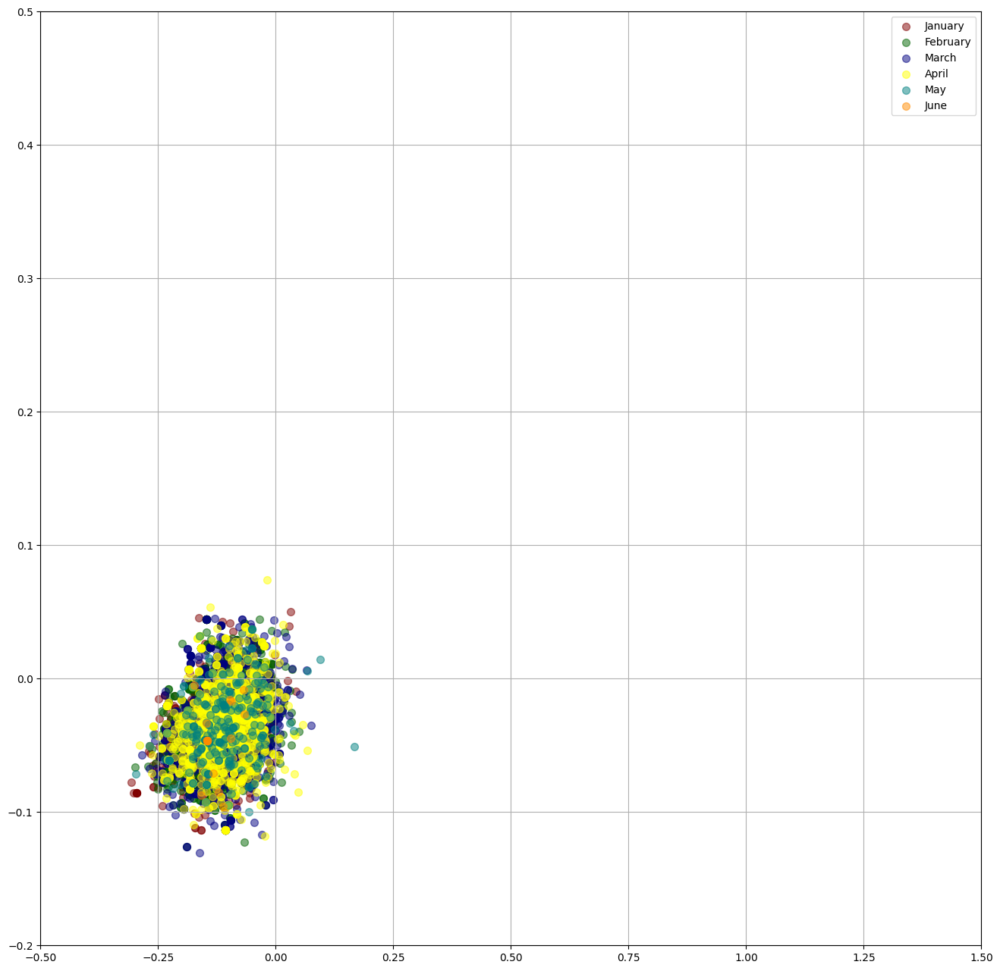

In [82]:
plot2d_month(epsilon_pca2, x_min_pca, x_max_pca, y_min_pca, y_max_pca)

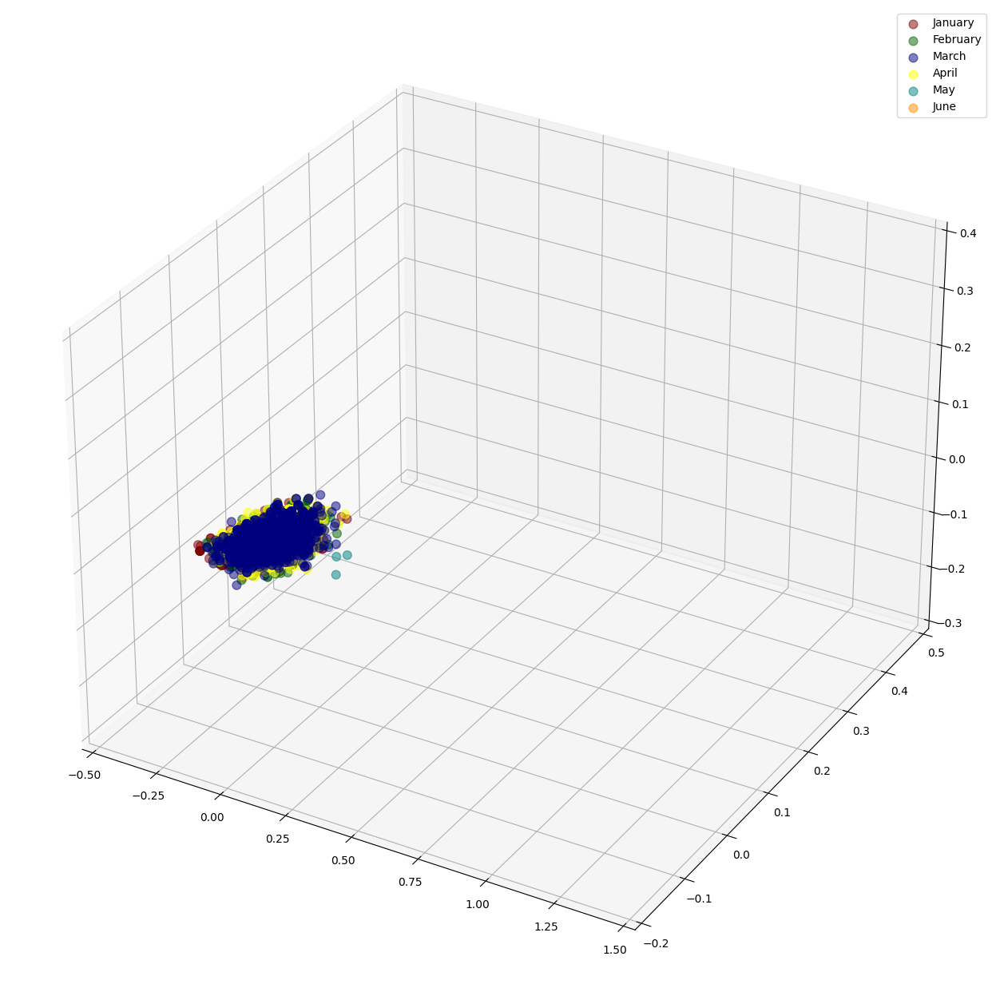

In [83]:
plot3d_month(epsilon_pca3, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)

In [84]:
epsilon_pca_january = epsilon_pca3[epsilon_pca3['Month'] == "January"].copy()
epsilon_pca_february = epsilon_pca3[epsilon_pca3['Month'] == "February"].copy()
epsilon_pca_march = epsilon_pca3[epsilon_pca3['Month'] == "March"].copy()
epsilon_pca_april = epsilon_pca3[epsilon_pca3['Month'] == "April"].copy()
epsilon_pca_may = epsilon_pca3[epsilon_pca3['Month'] == "May"].copy()
epsilon_pca_june = epsilon_pca3[epsilon_pca3['Month'] == "June"].copy()

In [85]:
entropy_epsilon_pca2_january = entropy(epsilon_pca_january[0], epsilon_pca_january[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_epsilon_pca2_february = entropy(epsilon_pca_february[0], epsilon_pca_february[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_epsilon_pca2_march = entropy(epsilon_pca_march[0], epsilon_pca_march[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_epsilon_pca2_april = entropy(epsilon_pca_april[0], epsilon_pca_april[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_epsilon_pca2_may = entropy(epsilon_pca_may[0], epsilon_pca_may[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_epsilon_pca2_june = entropy(epsilon_pca_june[0], epsilon_pca_june[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)

print(entropy_epsilon_pca2_january)
print(entropy_epsilon_pca2_february)
print(entropy_epsilon_pca2_march)
print(entropy_epsilon_pca2_april)
print(entropy_epsilon_pca2_may)
print(entropy_epsilon_pca2_june)

4.527800168594945
4.70650717512121
4.759006688915419
4.789245496597133
4.562170965841832
2.702904337188607


In [86]:
entropy_epsilon_pca3_january = entropy_3d(epsilon_pca_january[0], epsilon_pca_january[1], epsilon_pca_january[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_epsilon_pca3_february = entropy_3d(epsilon_pca_february[0], epsilon_pca_february[1], epsilon_pca_february[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_epsilon_pca3_march = entropy_3d(epsilon_pca_march[0], epsilon_pca_march[1], epsilon_pca_march[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_epsilon_pca3_april = entropy_3d(epsilon_pca_april[0], epsilon_pca_april[1], epsilon_pca_april[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_epsilon_pca3_may = entropy_3d(epsilon_pca_may[0], epsilon_pca_may[1], epsilon_pca_may[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_epsilon_pca3_june = entropy_3d(epsilon_pca_june[0], epsilon_pca_june[1], epsilon_pca_june[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)

print(entropy_epsilon_pca3_january)
print(entropy_epsilon_pca3_february)
print(entropy_epsilon_pca3_march)
print(entropy_epsilon_pca3_april)
print(entropy_epsilon_pca3_may)
print(entropy_epsilon_pca3_june)

5.974975895678841
6.186012737132448
6.293471357976814
6.251287763570307
5.922424952821401
2.967064753975466


#### IOTA

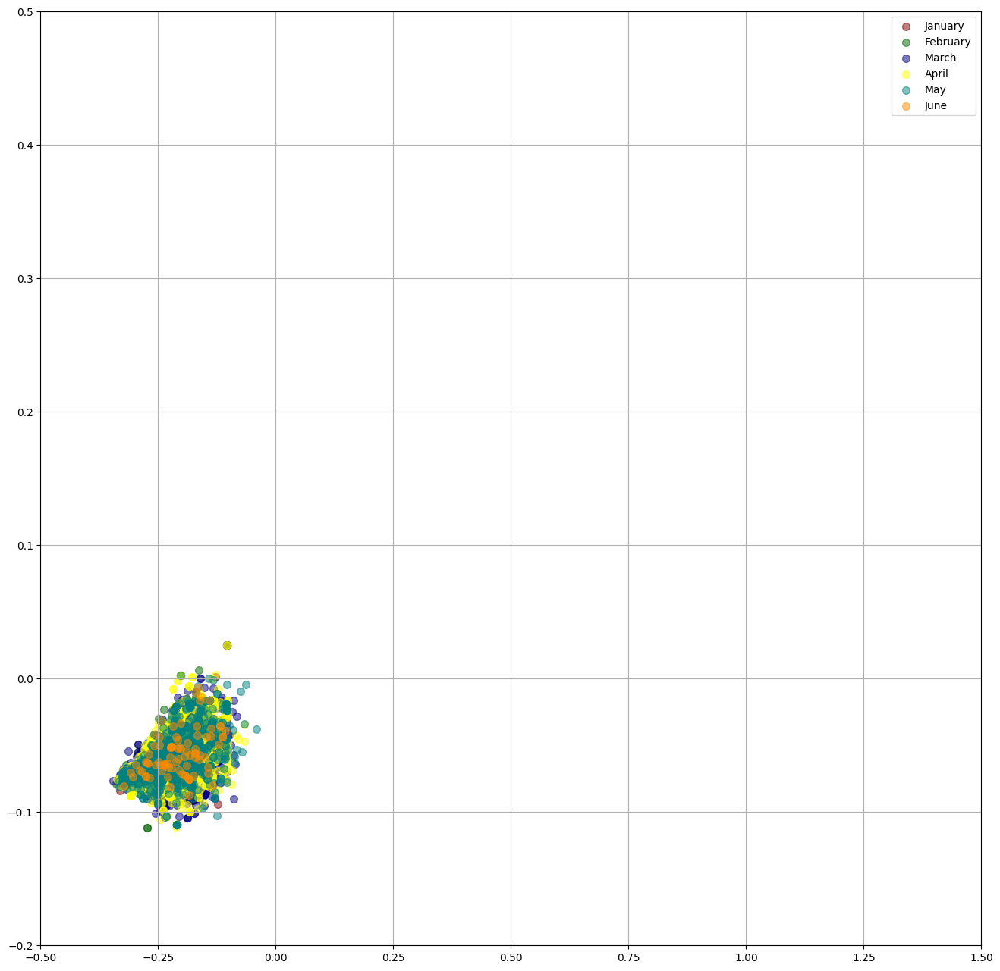

In [87]:
plot2d_month(iota_pca2, x_min_pca, x_max_pca, y_min_pca, y_max_pca)

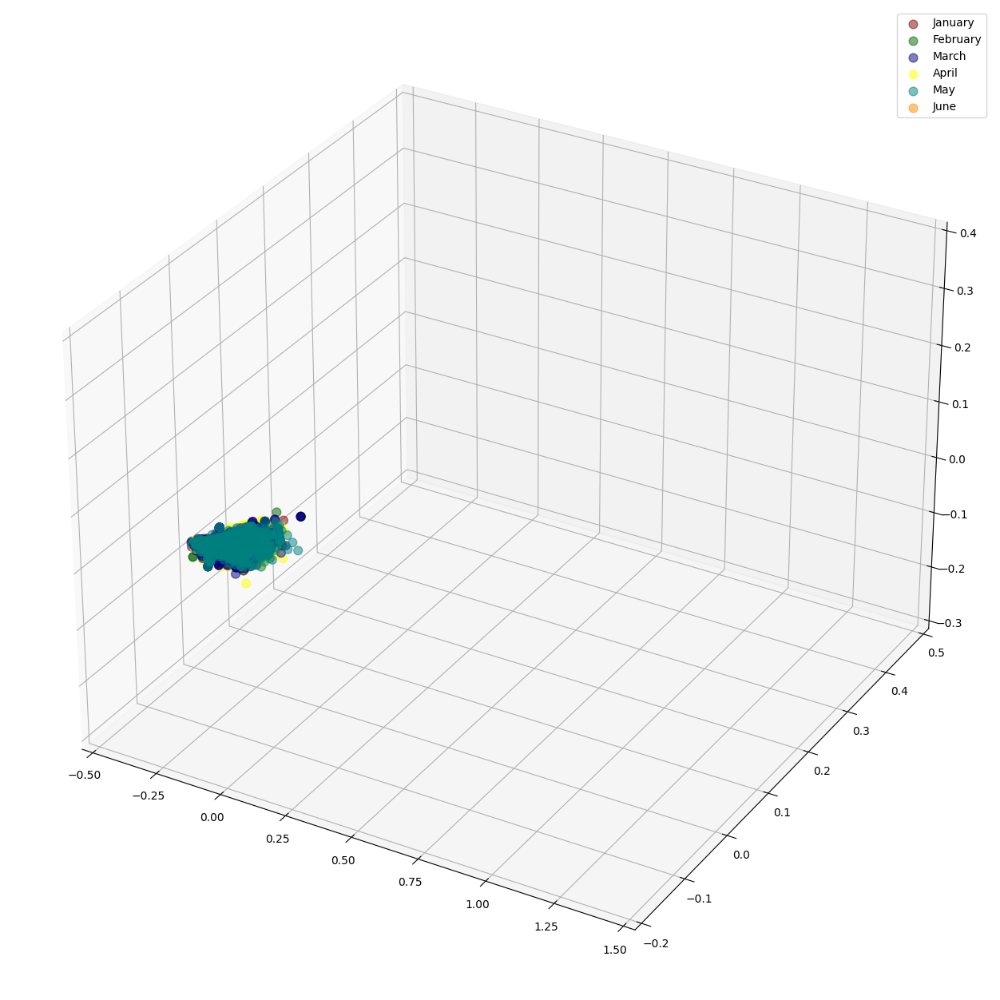

In [88]:
plot3d_month(iota_pca3, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)

In [89]:
iota_pca_january = iota_pca3[iota_pca3['Month'] == "January"].copy()
iota_pca_february = iota_pca3[iota_pca3['Month'] == "February"].copy()
iota_pca_march = iota_pca3[iota_pca3['Month'] == "March"].copy()
iota_pca_april = iota_pca3[iota_pca3['Month'] == "April"].copy()
iota_pca_may = iota_pca3[iota_pca3['Month'] == "May"].copy()
iota_pca_june = iota_pca3[iota_pca3['Month'] == "June"].copy()

In [90]:
entropy_iota_pca2_january = entropy(iota_pca_january[0], iota_pca_january[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_iota_pca2_february = entropy(iota_pca_february[0], iota_pca_february[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_iota_pca2_march = entropy(iota_pca_march[0], iota_pca_march[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_iota_pca2_april = entropy(iota_pca_april[0], iota_pca_april[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_iota_pca2_may = entropy(iota_pca_may[0], iota_pca_may[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_iota_pca2_june = entropy(iota_pca_june[0], iota_pca_june[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)

print(entropy_iota_pca2_january)
print(entropy_iota_pca2_february)
print(entropy_iota_pca2_march)
print(entropy_iota_pca2_april)
print(entropy_iota_pca2_may)
print(entropy_iota_pca2_june)

3.537923128792631
3.6681840933552063
3.8134914039009766
3.7481709215114303
3.821647666117018
3.597056433584951


In [91]:
entropy_iota_pca3_january = entropy_3d(iota_pca_january[0], iota_pca_january[1], iota_pca_january[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_iota_pca3_february = entropy_3d(iota_pca_february[0], iota_pca_february[1], iota_pca_february[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_iota_pca3_march = entropy_3d(iota_pca_march[0], iota_pca_march[1], iota_pca_march[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_iota_pca3_april = entropy_3d(iota_pca_april[0], iota_pca_april[1], iota_pca_april[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_iota_pca3_may = entropy_3d(iota_pca_may[0], iota_pca_may[1], iota_pca_may[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_iota_pca3_june = entropy_3d(iota_pca_june[0], iota_pca_june[1], iota_pca_june[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)

print(entropy_iota_pca3_january)
print(entropy_iota_pca3_february)
print(entropy_iota_pca3_march)
print(entropy_iota_pca3_april)
print(entropy_iota_pca3_may)
print(entropy_iota_pca3_june)

4.195847043183496
4.434811274892121
4.6258547878295335
4.521363491325504
4.598759164578435
4.046120835603887


In [92]:
january_pca2 = df_pca2[df_pca2['Month'] == "January"].copy()
february_pca2 = df_pca2[df_pca2['Month'] == "February"].copy()
march_pca2 = df_pca2[df_pca2['Month'] == "March"].copy()
april_pca2 = df_pca2[df_pca2['Month'] == "April"].copy()
may_pca2 = df_pca2[df_pca2['Month'] == "May"].copy()
june_pca2 = df_pca2[df_pca2['Month'] == "June"].copy()

january_pca3 = df_pca3[df_pca3['Month'] == "January"].copy()
february_pca3 = df_pca3[df_pca3['Month'] == "February"].copy()
march_pca3 = df_pca3[df_pca3['Month'] == "March"].copy()
april_pca3 = df_pca3[df_pca3['Month'] == "April"].copy()
may_pca3 = df_pca3[df_pca3['Month'] == "May"].copy()
june_pca3 = df_pca3[df_pca3['Month'] == "June"].copy()

In [93]:
entropy_january_pca2 = entropy(january_pca2[0], january_pca2[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_february_pca2 = entropy(february_pca2[0], february_pca2[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_march_pca2 = entropy(march_pca2[0], march_pca2[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_april_pca2 = entropy(april_pca2[0], april_pca2[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_may_pca2 = entropy(may_pca2[0], may_pca2[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)
entropy_june_pca2 = entropy(june_pca2[0], june_pca2[1], 40, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca)

print(entropy_january_pca2)
print(entropy_february_pca2)
print(entropy_march_pca2)
print(entropy_april_pca2)
print(entropy_may_pca2)
print(entropy_june_pca2)

6.078130524727876
6.379863752923719
6.585749620602311
6.714418398671648
7.170104021821936
6.61945287890716


In [94]:
entropy_january_pca3 = entropy_3d(january_pca3[0], january_pca3[1], january_pca3[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_february_pca3 = entropy_3d(february_pca3[0], february_pca3[1], february_pca3[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_march_pca3 = entropy_3d(march_pca3[0], march_pca3[1], march_pca3[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_april_pca3 = entropy_3d(april_pca3[0], april_pca3[1], april_pca3[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_may_pca3 = entropy_3d(may_pca3[0], may_pca3[1], may_pca3[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)
entropy_june_pca3 = entropy_3d(june_pca3[0], june_pca3[1], june_pca3[2], 40, 35, 35, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)

print(entropy_january_pca3)
print(entropy_february_pca3)
print(entropy_march_pca3)
print(entropy_april_pca3)
print(entropy_may_pca3)
print(entropy_june_pca3)

7.683984758481139
8.30175886131829
8.631876001337574
8.713551386422495
9.004505673113618
7.942916989847332


#### JANEIRO

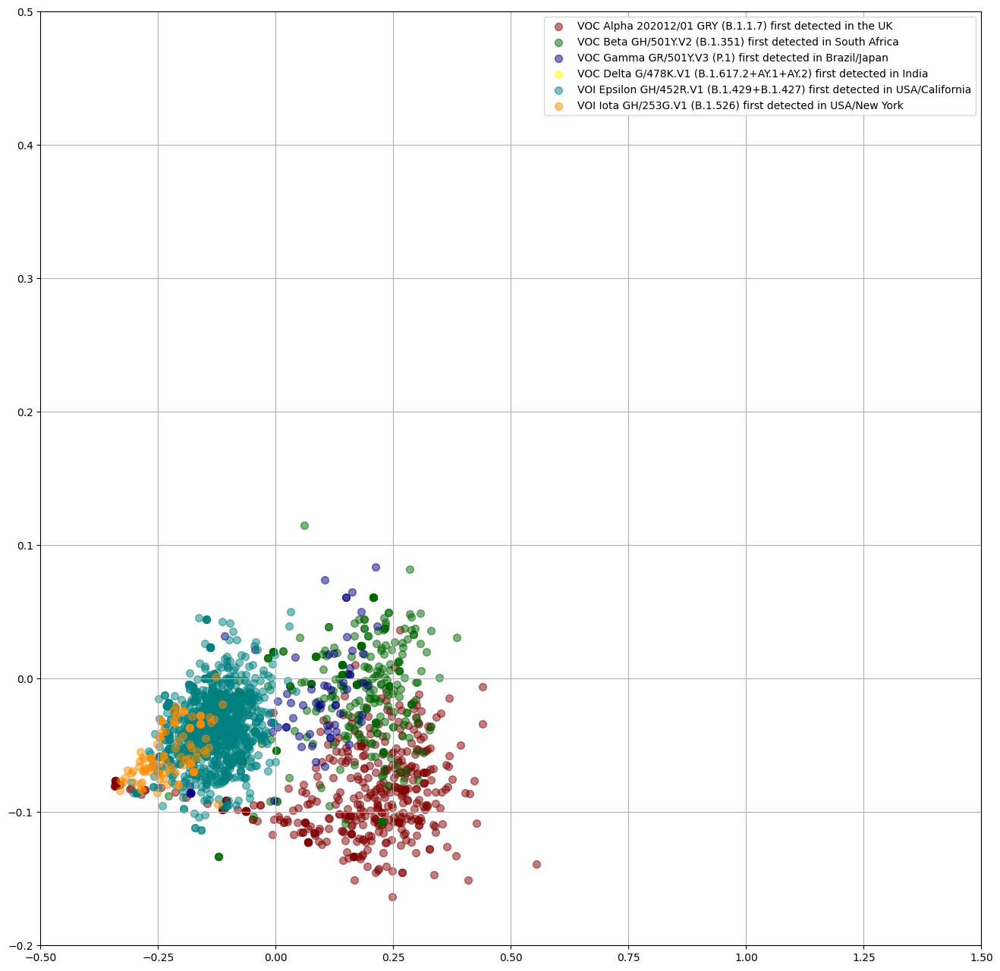

In [95]:
plot2d_variant(january_pca2, x_min_pca, x_max_pca, y_min_pca, y_max_pca)

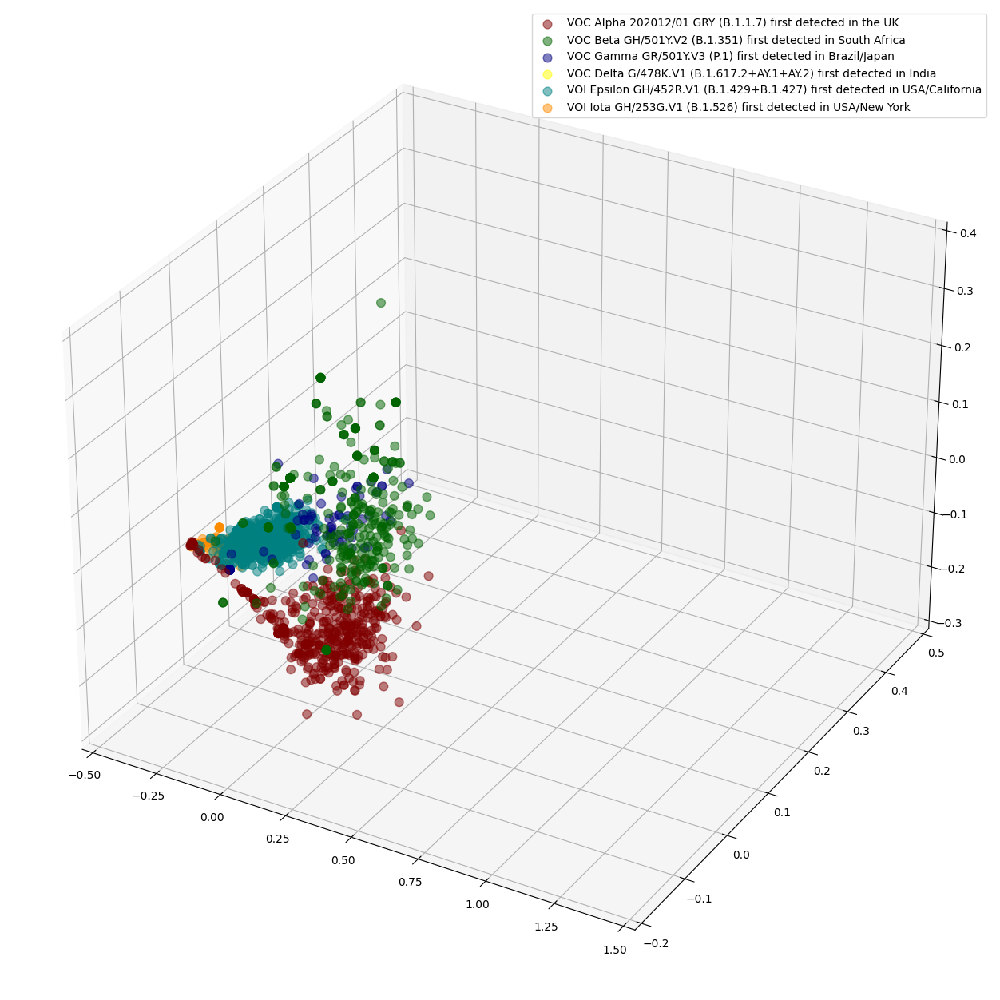

In [96]:
plot3d_variant(january_pca3, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)

#### FEVEREIRO

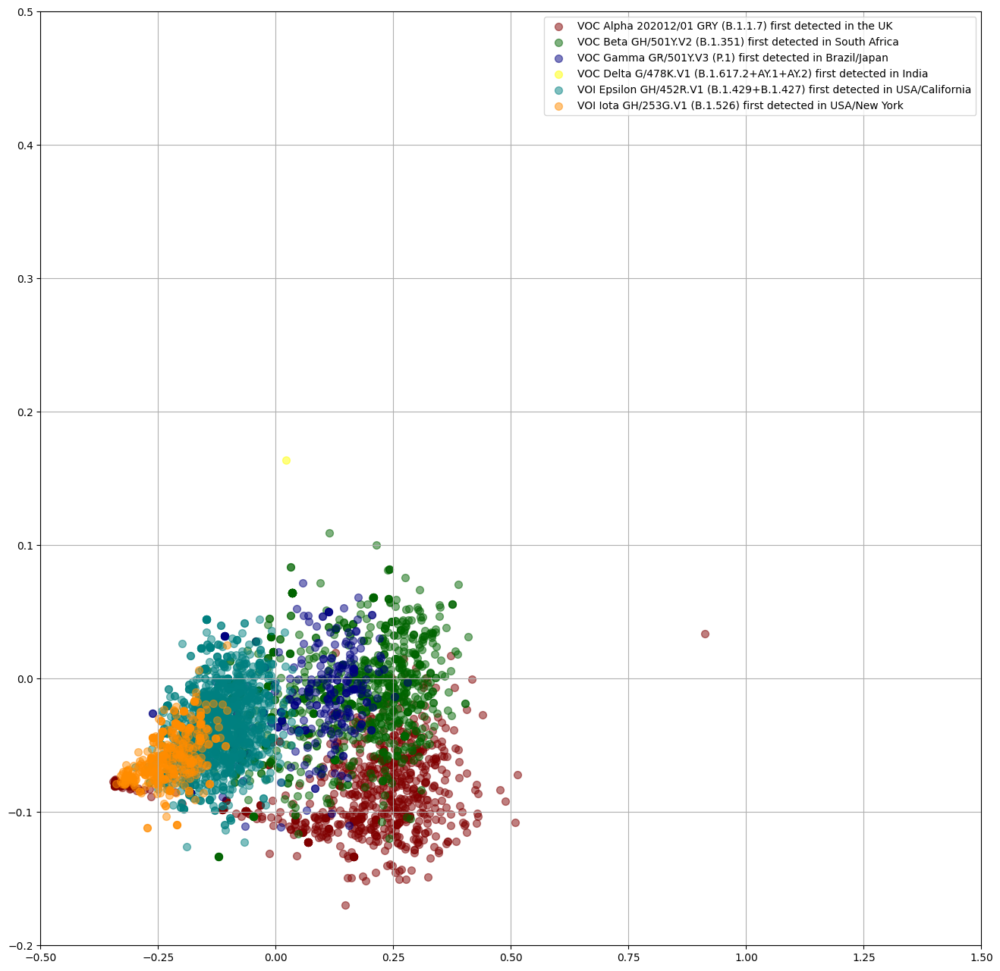

In [97]:
plot2d_variant(february_pca2, x_min_pca, x_max_pca, y_min_pca, y_max_pca)

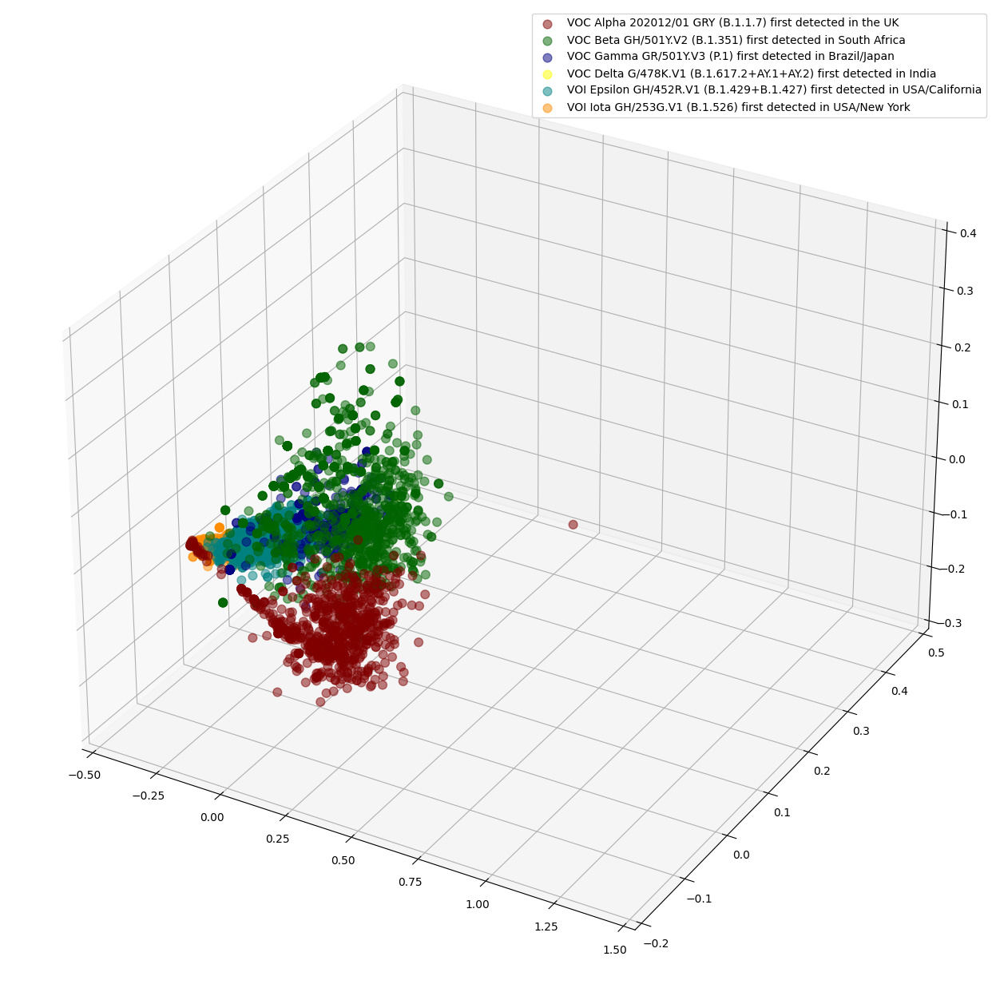

In [98]:
plot3d_variant(february_pca3, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)

#### MARÇO

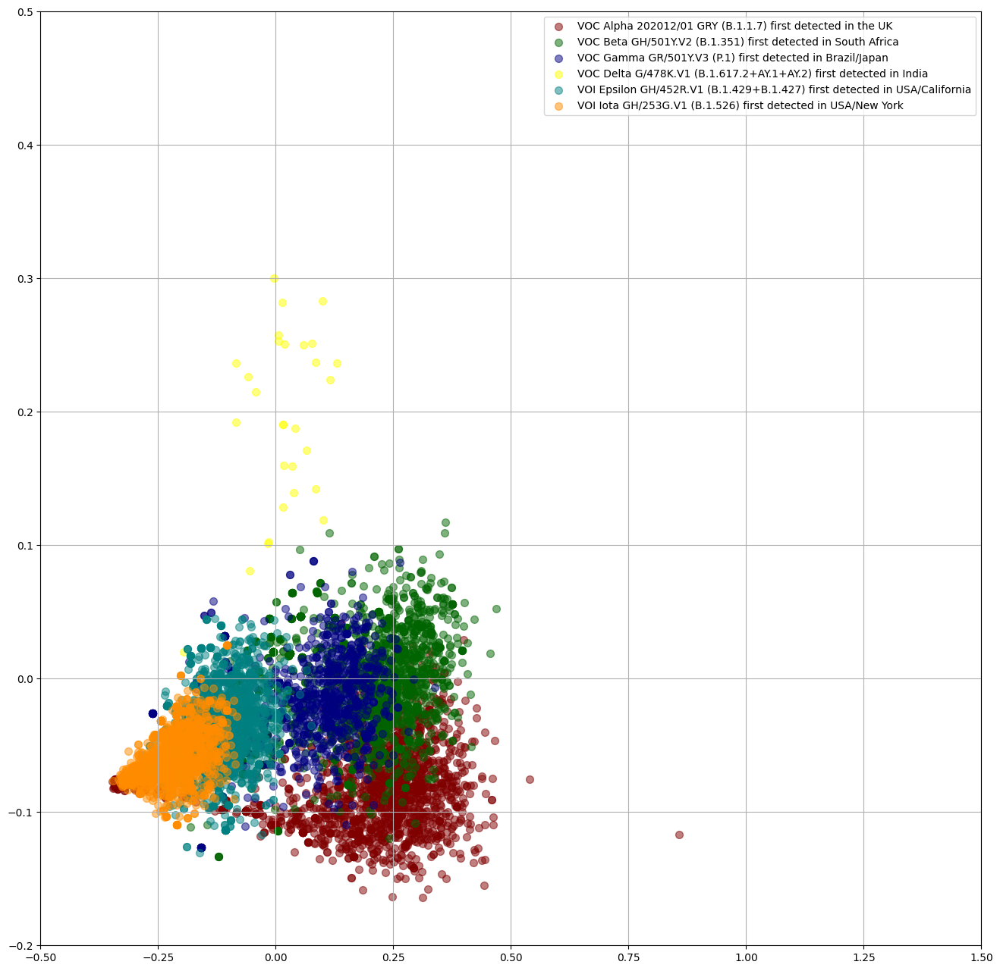

In [99]:
plot2d_variant(march_pca2, x_min_pca, x_max_pca, y_min_pca, y_max_pca)

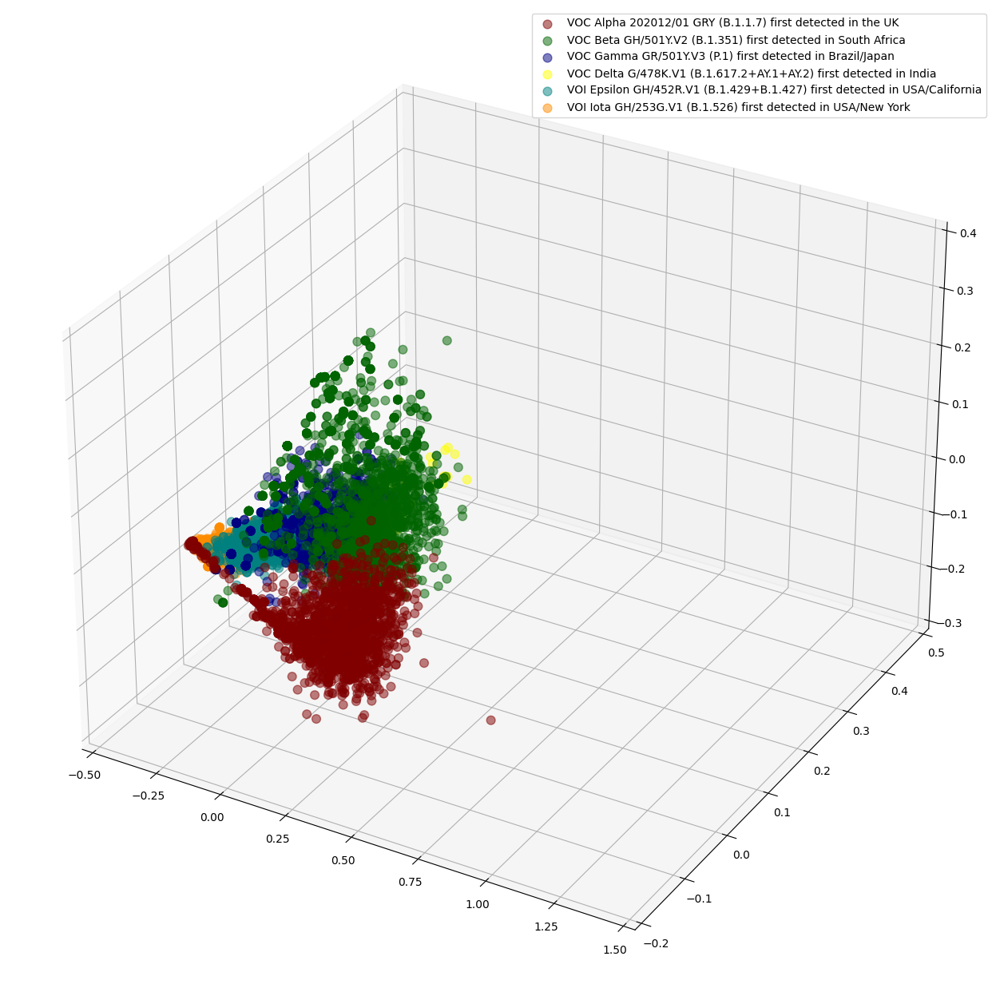

In [100]:
plot3d_variant(march_pca3, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)

#### ABRIL

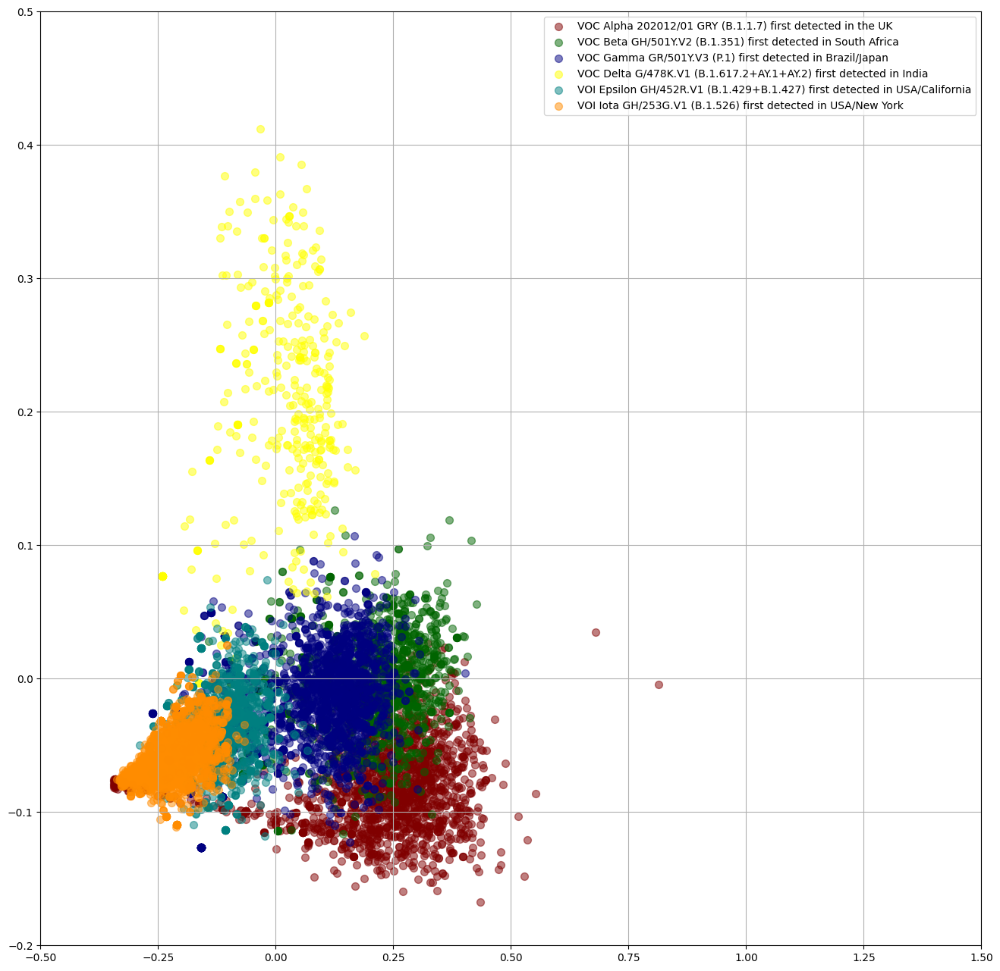

In [101]:
plot2d_variant(april_pca2, x_min_pca, x_max_pca, y_min_pca, y_max_pca)

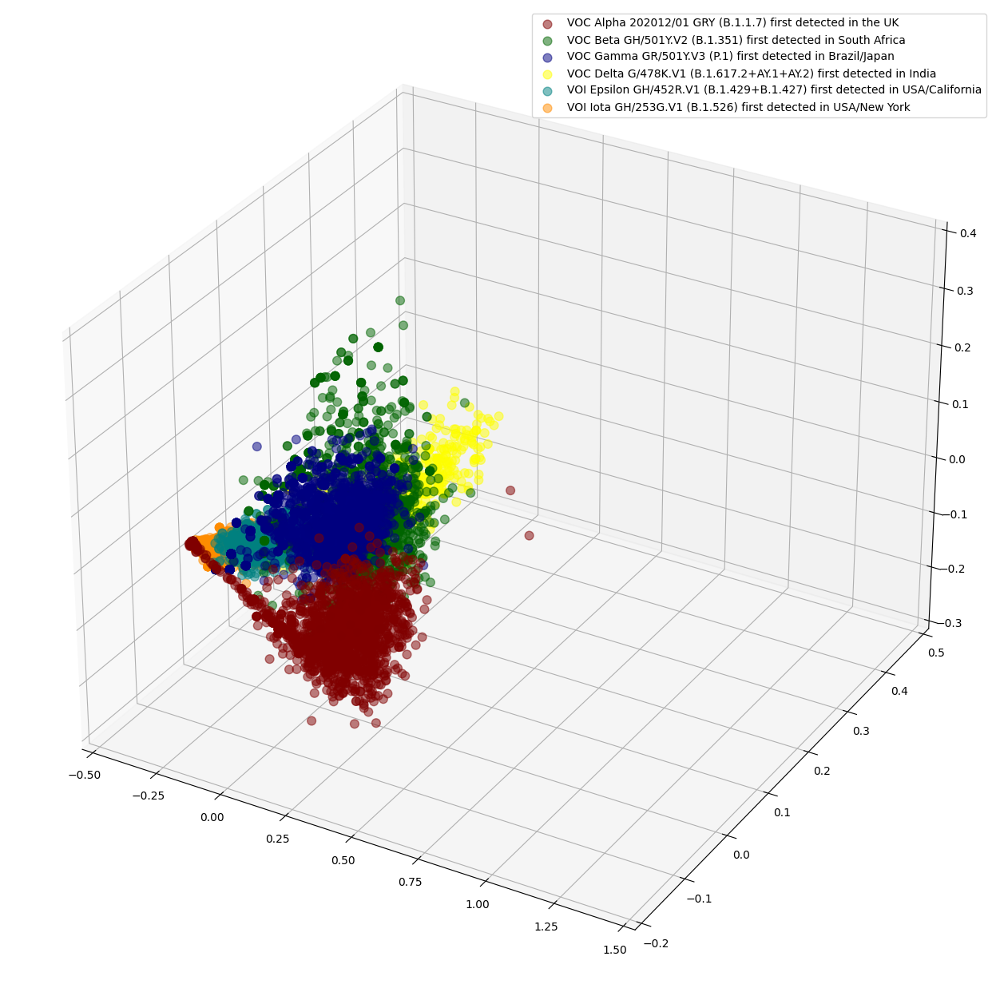

In [102]:
plot3d_variant(april_pca3, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)

#### MAIO

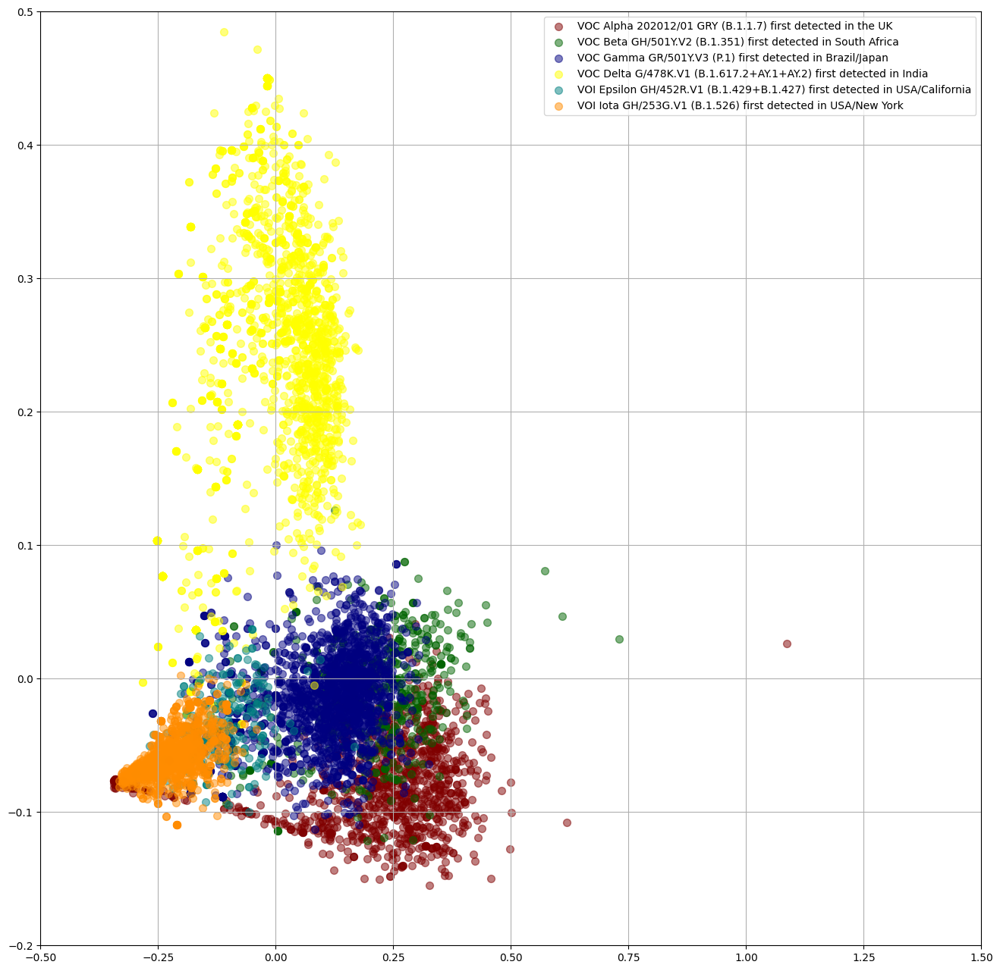

In [103]:
plot2d_variant(may_pca2, x_min_pca, x_max_pca, y_min_pca, y_max_pca)

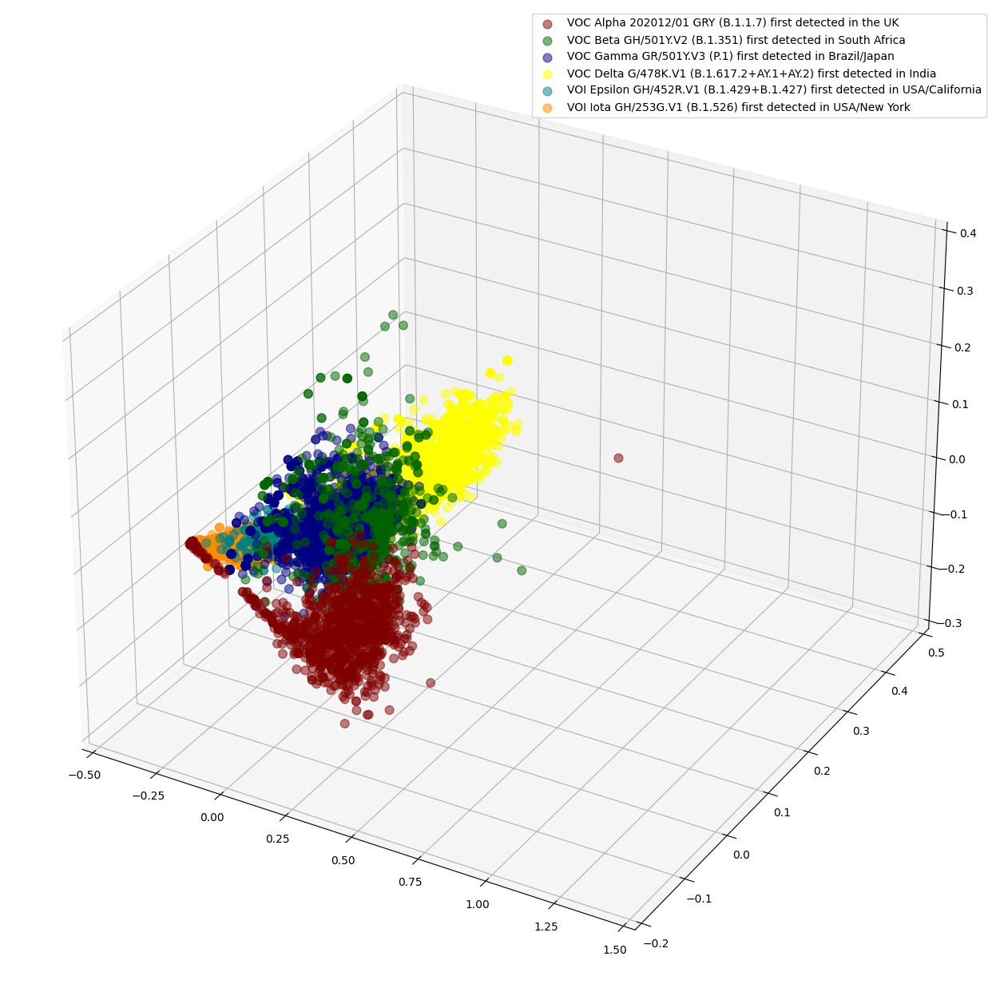

In [104]:
plot3d_variant(may_pca3, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)

#### JUNHO

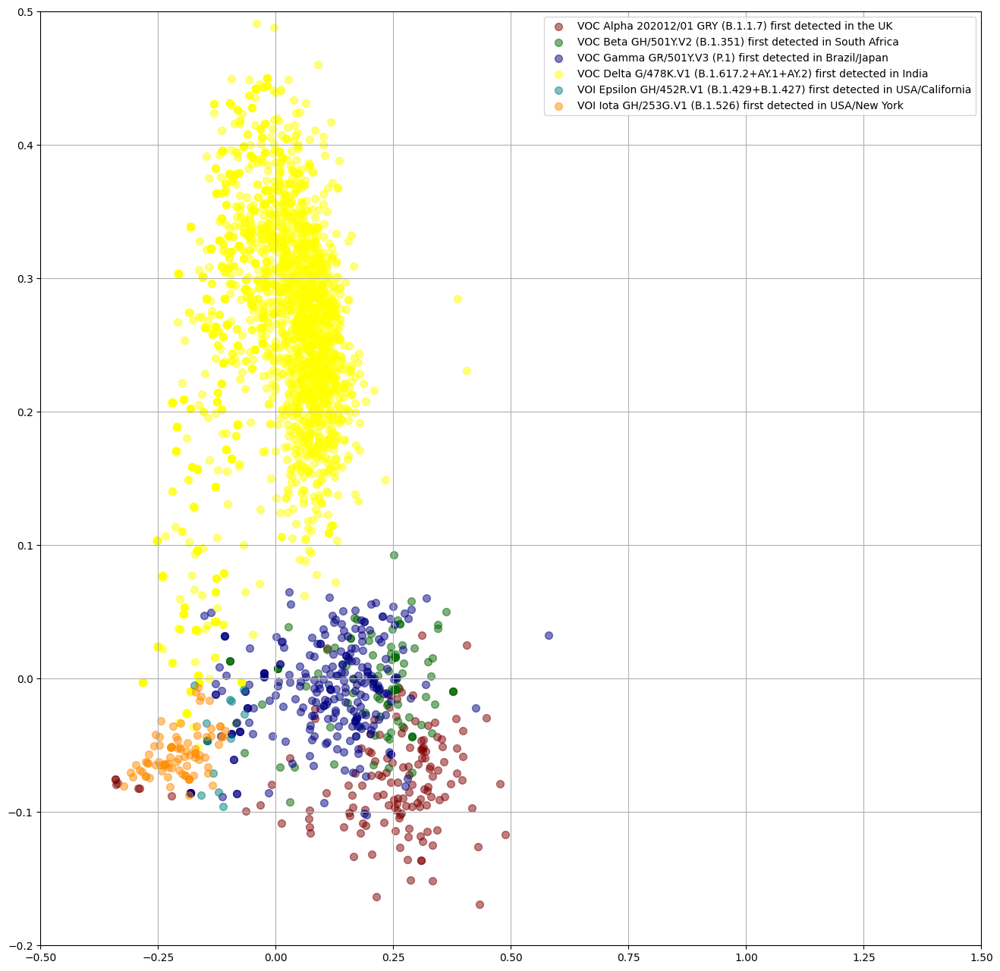

In [105]:
plot2d_variant(june_pca2, x_min_pca, x_max_pca, y_min_pca, y_max_pca)

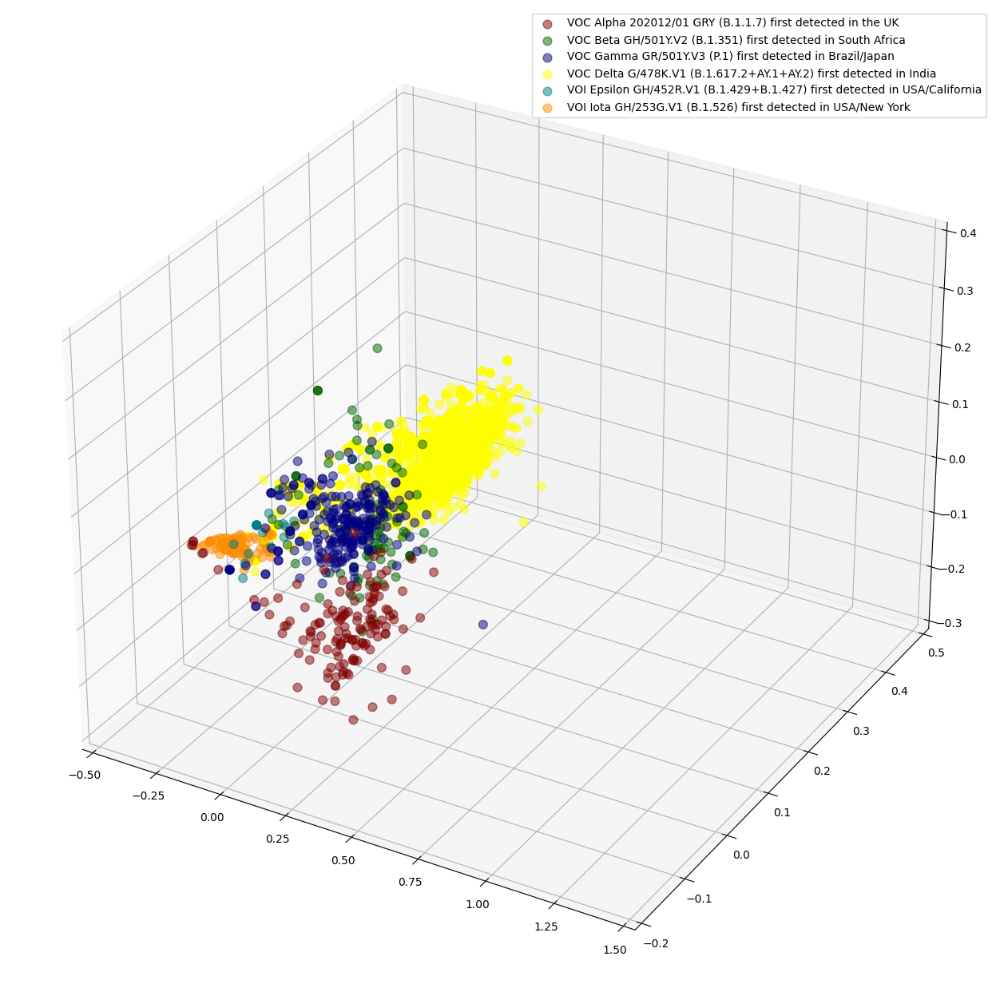

In [106]:
plot3d_variant(june_pca3, x_min_pca, x_max_pca, y_min_pca, y_max_pca, z_min_pca, z_max_pca)

### TSNE Euclidean

In [107]:
euclidean2 = TSNE(n_components=2, init='pca', metric='euclidean')
main_2_euclidean = euclidean2.fit_transform(df.iloc[:,0:300])

euclidean_2_pieces = pd.DataFrame(main_2_euclidean)

In [108]:
euclidean3 = TSNE(n_components=3, init='pca', metric='euclidean')
main_3_euclidean = euclidean3.fit_transform(df.iloc[:,0:300])

euclidean_3_pieces = pd.DataFrame(main_3_euclidean)

In [109]:
df_euclidean2 = pd.concat([euclidean_2_pieces, df], axis=1)
df_euclidean3 = pd.concat([euclidean_3_pieces, df], axis=1)

In [ ]:
#df_euclidean2 = pd.read_csv('/content/drive/MyDrive/euclidean2.csv')
#df_euclidean3 = pd.read_csv('/content/drive/MyDrive/euclidean3.csv')

In [110]:
x_min_euclidean2 = math.floor(df_euclidean2['0'].min())
x_max_euclidean2 = math.ceil(df_euclidean2['0'].max())
y_min_euclidean2 = math.floor(df_euclidean2['1'].min())
y_max_euclidean2 = math.ceil(df_euclidean2['1'].max())

x_min_euclidean3 = math.floor(df_euclidean3['0'].min())
x_max_euclidean3 = math.ceil(df_euclidean3['0'].max())
y_min_euclidean3 = math.floor(df_euclidean3['1'].min())
y_max_euclidean3 = math.ceil(df_euclidean3['1'].max())
z_min_euclidean3 = math.floor(df_euclidean3['2'].min())
z_max_euclidean3 = math.ceil(df_euclidean3['2'].max())

KeyError: '0'

In [111]:
plot2d_variant(df_euclidean2, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)

NameError: name 'x_min_euclidean2' is not defined

In [ ]:
plot3d_variant(df_euclidean3, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)

In [ ]:
alpha_euclidean2 = df_euclidean2[df_euclidean2['Variant'] == "VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK"].copy()
beta_euclidean2 = df_euclidean2[df_euclidean2['Variant'] == "VOC Beta GH/501Y.V2 (B.1.351) first detected in South Africa"].copy()
gamma_euclidean2 = df_euclidean2[df_euclidean2['Variant'] == "VOC Gamma GR/501Y.V3 (P.1) first detected in Brazil/Japan"].copy()
delta_euclidean2 = df_euclidean2[df_euclidean2['Variant'] == "VOC Delta G/478K.V1 (B.1.617.2+AY.1+AY.2) first detected in India"].copy()
epsilon_euclidean2 = df_euclidean2[df_euclidean2['Variant'] == "VOI Epsilon GH/452R.V1 (B.1.429+B.1.427) first detected in USA/California"].copy()
iota_euclidean2 = df_euclidean2[df_euclidean2['Variant'] == "VOI Iota GH/253G.V1 (B.1.526) first detected in USA/New York"].copy()

alpha_euclidean3 = df_euclidean3[df_euclidean3['Variant'] == "VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK"].copy()
beta_euclidean3 = df_euclidean3[df_euclidean3['Variant'] == "VOC Beta GH/501Y.V2 (B.1.351) first detected in South Africa"].copy()
gamma_euclidean3 = df_euclidean3[df_euclidean3['Variant'] == "VOC Gamma GR/501Y.V3 (P.1) first detected in Brazil/Japan"].copy()
delta_euclidean3 = df_euclidean3[df_euclidean3['Variant'] == "VOC Delta G/478K.V1 (B.1.617.2+AY.1+AY.2) first detected in India"].copy()
epsilon_euclidean3 = df_euclidean3[df_euclidean3['Variant'] == "VOI Epsilon GH/452R.V1 (B.1.429+B.1.427) first detected in USA/California"].copy()
iota_euclidean3 = df_euclidean3[df_euclidean3['Variant'] == "VOI Iota GH/253G.V1 (B.1.526) first detected in USA/New York"].copy()

In [112]:
entropy_euclidean2 = entropy(df_euclidean2['0'], df_euclidean2['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_euclidean3 = entropy_3d(df_euclidean3['0'], df_euclidean3['1'], df_euclidean3['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)

print(entropy_euclidean2)
print(entropy_euclidean3)

KeyError: '0'

In [ ]:
entropy_alpha_euclidean2 = entropy(alpha_euclidean2['0'], alpha_euclidean2['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_beta_euclidean2 = entropy(beta_euclidean2['0'], beta_euclidean2['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_gamma_euclidean2 = entropy(gamma_euclidean2['0'], gamma_euclidean2['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_delta_euclidean2 = entropy(delta_euclidean2['0'], delta_euclidean2['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_epsilon_euclidean2 = entropy(epsilon_euclidean2['0'], epsilon_euclidean2['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_iota_euclidean2 = entropy(iota_euclidean2['0'], iota_euclidean2['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)

print(entropy_alpha_euclidean2)
print(entropy_beta_euclidean2)
print(entropy_gamma_euclidean2)
print(entropy_delta_euclidean2)
print(entropy_epsilon_euclidean2)
print(entropy_iota_euclidean2)

In [ ]:
entropy_alpha_euclidean3 = entropy_3d(alpha_euclidean3['0'], alpha_euclidean3['1'], alpha_euclidean3['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_beta_euclidean3 = entropy_3d(beta_euclidean3['0'], beta_euclidean3['1'], alpha_euclidean3['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_gamma_euclidean3 = entropy_3d(gamma_euclidean3['0'], gamma_euclidean3['1'], alpha_euclidean3['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_delta_euclidean3 = entropy_3d(delta_euclidean3['0'], delta_euclidean3['1'], alpha_euclidean3['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_epsilon_euclidean3 = entropy_3d(epsilon_euclidean3['0'], epsilon_euclidean3['1'], alpha_euclidean3['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_iota_euclidean3 = entropy_3d(iota_euclidean3['0'], iota_euclidean3['1'], alpha_euclidean3['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)

print(entropy_alpha_euclidean3)
print(entropy_beta_euclidean3)
print(entropy_gamma_euclidean3)
print(entropy_delta_euclidean3)
print(entropy_epsilon_euclidean3)
print(entropy_iota_euclidean3)

#### ALPHA

In [ ]:
plot2d_month(alpha_euclidean2, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)

In [ ]:
plot3d_month(alpha_euclidean3, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)

In [ ]:
alpha_euclidean2_january = alpha_euclidean2[alpha_euclidean2['Month'] == "January"].copy()
alpha_euclidean2_february = alpha_euclidean2[alpha_euclidean2['Month'] == "February"].copy()
alpha_euclidean2_march = alpha_euclidean2[alpha_euclidean2['Month'] == "March"].copy()
alpha_euclidean2_april = alpha_euclidean2[alpha_euclidean2['Month'] == "April"].copy()
alpha_euclidean2_may = alpha_euclidean2[alpha_euclidean2['Month'] == "May"].copy()
alpha_euclidean2_june = alpha_euclidean2[alpha_euclidean2['Month'] == "June"].copy()

alpha_euclidean3_january = alpha_euclidean3[alpha_euclidean3['Month'] == "January"].copy()
alpha_euclidean3_february = alpha_euclidean3[alpha_euclidean3['Month'] == "February"].copy()
alpha_euclidean3_march = alpha_euclidean3[alpha_euclidean3['Month'] == "March"].copy()
alpha_euclidean3_april = alpha_euclidean3[alpha_euclidean3['Month'] == "April"].copy()
alpha_euclidean3_may = alpha_euclidean3[alpha_euclidean3['Month'] == "May"].copy()
alpha_euclidean3_june = alpha_euclidean3[alpha_euclidean3['Month'] == "June"].copy()

In [ ]:
entropy_alpha_euclidean2_january = entropy(alpha_euclidean2_january['0'], alpha_euclidean2_january['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_alpha_euclidean2_february = entropy(alpha_euclidean2_february['0'], alpha_euclidean2_february['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_alpha_euclidean2_march = entropy(alpha_euclidean2_march['0'], alpha_euclidean2_march['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_alpha_euclidean2_april = entropy(alpha_euclidean2_april['0'], alpha_euclidean2_april['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_alpha_euclidean2_may = entropy(alpha_euclidean2_may['0'], alpha_euclidean2_may['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_alpha_euclidean2_june = entropy(alpha_euclidean2_june['0'], alpha_euclidean2_june['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)

print(entropy_alpha_euclidean2_january)
print(entropy_alpha_euclidean2_february)
print(entropy_alpha_euclidean2_march)
print(entropy_alpha_euclidean2_april)
print(entropy_alpha_euclidean2_may)
print(entropy_alpha_euclidean2_june)

In [ ]:
entropy_alpha_euclidean3_january = entropy_3d(alpha_euclidean3_january['0'], alpha_euclidean3_january['1'], alpha_euclidean3_january['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_alpha_euclidean3_february = entropy_3d(alpha_euclidean3_february['0'], alpha_euclidean3_february['1'], alpha_euclidean3_february['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_alpha_euclidean3_march = entropy_3d(alpha_euclidean3_march['0'], alpha_euclidean3_march['1'], alpha_euclidean3_march['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_alpha_euclidean3_april = entropy_3d(alpha_euclidean3_april['0'], alpha_euclidean3_april['1'], alpha_euclidean3_april['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_alpha_euclidean3_may = entropy_3d(alpha_euclidean3_may['0'], alpha_euclidean3_may['1'], alpha_euclidean3_may['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_alpha_euclidean3_june = entropy_3d(alpha_euclidean3_june['0'], alpha_euclidean3_june['1'], alpha_euclidean3_june['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)

print(entropy_alpha_euclidean3_january)
print(entropy_alpha_euclidean3_february)
print(entropy_alpha_euclidean3_march)
print(entropy_alpha_euclidean3_april)
print(entropy_alpha_euclidean3_may)
print(entropy_alpha_euclidean3_june)

#### BETA

In [ ]:
plot2d_month(beta_euclidean2, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)

In [ ]:
plot3d_month(beta_euclidean3, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)

In [ ]:
beta_euclidean2_january = beta_euclidean2[beta_euclidean2['Month'] == "January"].copy()
beta_euclidean2_february = beta_euclidean2[beta_euclidean2['Month'] == "February"].copy()
beta_euclidean2_march = beta_euclidean2[beta_euclidean2['Month'] == "March"].copy()
beta_euclidean2_april = beta_euclidean2[beta_euclidean2['Month'] == "April"].copy()
beta_euclidean2_may = beta_euclidean2[beta_euclidean2['Month'] == "May"].copy()
beta_euclidean2_june = beta_euclidean2[beta_euclidean2['Month'] == "June"].copy()

beta_euclidean3_january = beta_euclidean3[beta_euclidean3['Month'] == "January"].copy()
beta_euclidean3_february = beta_euclidean3[beta_euclidean3['Month'] == "February"].copy()
beta_euclidean3_march = beta_euclidean3[beta_euclidean3['Month'] == "March"].copy()
beta_euclidean3_april = beta_euclidean3[beta_euclidean3['Month'] == "April"].copy()
beta_euclidean3_may = beta_euclidean3[beta_euclidean3['Month'] == "May"].copy()
beta_euclidean3_june = beta_euclidean3[beta_euclidean3['Month'] == "June"].copy()

In [ ]:
entropy_beta_euclidean2_january = entropy(beta_euclidean2_january['0'], beta_euclidean2_january['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_beta_euclidean2_february = entropy(beta_euclidean2_february['0'], beta_euclidean2_february['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_beta_euclidean2_march = entropy(beta_euclidean2_march['0'], beta_euclidean2_march['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_beta_euclidean2_april = entropy(beta_euclidean2_april['0'], beta_euclidean2_april['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_beta_euclidean2_may = entropy(beta_euclidean2_may['0'], beta_euclidean2_may['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_beta_euclidean2_june = entropy(beta_euclidean2_june['0'], beta_euclidean2_june['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)

print(entropy_beta_euclidean2_january)
print(entropy_beta_euclidean2_february)
print(entropy_beta_euclidean2_march)
print(entropy_beta_euclidean2_april)
print(entropy_beta_euclidean2_may)
print(entropy_beta_euclidean2_june)

In [ ]:
entropy_beta_euclidean3_january = entropy_3d(beta_euclidean3_january['0'], beta_euclidean3_january['1'], beta_euclidean3_january['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_beta_euclidean3_february = entropy_3d(beta_euclidean3_february['0'], beta_euclidean3_february['1'], beta_euclidean3_february['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_beta_euclidean3_march = entropy_3d(beta_euclidean3_march['0'], beta_euclidean3_march['1'], beta_euclidean3_march['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_beta_euclidean3_april = entropy_3d(beta_euclidean3_april['0'], beta_euclidean3_april['1'], beta_euclidean3_april['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_beta_euclidean3_may = entropy_3d(beta_euclidean3_may['0'], beta_euclidean3_may['1'], beta_euclidean3_may['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_beta_euclidean3_june = entropy_3d(beta_euclidean3_june['0'], beta_euclidean3_june['1'], beta_euclidean3_june['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)

print(entropy_beta_euclidean3_january)
print(entropy_beta_euclidean3_february)
print(entropy_beta_euclidean3_march)
print(entropy_beta_euclidean3_april)
print(entropy_beta_euclidean3_may)
print(entropy_beta_euclidean3_june)

#### GAMMA

In [ ]:
plot2d_month(gamma_euclidean2, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)

In [ ]:
plot3d_month(gamma_euclidean3, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)

In [ ]:
gamma_euclidean2_january = gamma_euclidean2[gamma_euclidean2['Month'] == "January"].copy()
gamma_euclidean2_february = gamma_euclidean2[gamma_euclidean2['Month'] == "February"].copy()
gamma_euclidean2_march = gamma_euclidean2[gamma_euclidean2['Month'] == "March"].copy()
gamma_euclidean2_april = gamma_euclidean2[gamma_euclidean2['Month'] == "April"].copy()
gamma_euclidean2_may = gamma_euclidean2[gamma_euclidean2['Month'] == "May"].copy()
gamma_euclidean2_june = gamma_euclidean2[gamma_euclidean2['Month'] == "June"].copy()

gamma_euclidean3_january = gamma_euclidean3[gamma_euclidean3['Month'] == "January"].copy()
gamma_euclidean3_february = gamma_euclidean3[gamma_euclidean3['Month'] == "February"].copy()
gamma_euclidean3_march = gamma_euclidean3[gamma_euclidean3['Month'] == "March"].copy()
gamma_euclidean3_april = gamma_euclidean3[gamma_euclidean3['Month'] == "April"].copy()
gamma_euclidean3_may = gamma_euclidean3[gamma_euclidean3['Month'] == "May"].copy()
gamma_euclidean3_june = gamma_euclidean3[gamma_euclidean3['Month'] == "June"].copy()

In [ ]:
entropy_gamma_euclidean2_january = entropy(gamma_euclidean2_january['0'], gamma_euclidean2_january['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_gamma_euclidean2_february = entropy(gamma_euclidean2_february['0'], gamma_euclidean2_february['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_gamma_euclidean2_march = entropy(gamma_euclidean2_march['0'], gamma_euclidean2_march['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_gamma_euclidean2_april = entropy(gamma_euclidean2_april['0'], gamma_euclidean2_april['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_gamma_euclidean2_may = entropy(gamma_euclidean2_may['0'], gamma_euclidean2_may['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_gamma_euclidean2_june = entropy(gamma_euclidean2_june['0'], gamma_euclidean2_june['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)

print(entropy_gamma_euclidean2_january)
print(entropy_gamma_euclidean2_february)
print(entropy_gamma_euclidean2_march)
print(entropy_gamma_euclidean2_april)
print(entropy_gamma_euclidean2_may)
print(entropy_gamma_euclidean2_june)

In [ ]:
entropy_gamma_euclidean3_january = entropy_3d(gamma_euclidean3_january['0'], gamma_euclidean3_january['1'], gamma_euclidean3_january['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_gamma_euclidean3_february = entropy_3d(gamma_euclidean3_february['0'], gamma_euclidean3_february['1'], gamma_euclidean3_february['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_gamma_euclidean3_march = entropy_3d(gamma_euclidean3_march['0'], gamma_euclidean3_march['1'], gamma_euclidean3_march['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_gamma_euclidean3_april = entropy_3d(gamma_euclidean3_april['0'], gamma_euclidean3_april['1'], gamma_euclidean3_april['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_gamma_euclidean3_may = entropy_3d(gamma_euclidean3_may['0'], gamma_euclidean3_may['1'], gamma_euclidean3_may['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_gamma_euclidean3_june = entropy_3d(gamma_euclidean3_june['0'], gamma_euclidean3_june['1'], gamma_euclidean3_june['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)

print(entropy_gamma_euclidean3_january)
print(entropy_gamma_euclidean3_february)
print(entropy_gamma_euclidean3_march)
print(entropy_gamma_euclidean3_april)
print(entropy_gamma_euclidean3_may)
print(entropy_gamma_euclidean3_june)

#### DELTA

In [ ]:
plot2d_month(delta_euclidean2, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)

In [ ]:
plot3d_month(delta_euclidean3, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)

In [ ]:
delta_euclidean2_january = delta_euclidean2[delta_euclidean2['Month'] == "January"].copy()
delta_euclidean2_february = delta_euclidean2[delta_euclidean2['Month'] == "February"].copy()
delta_euclidean2_march = delta_euclidean2[delta_euclidean2['Month'] == "March"].copy()
delta_euclidean2_april = delta_euclidean2[delta_euclidean2['Month'] == "April"].copy()
delta_euclidean2_may = delta_euclidean2[delta_euclidean2['Month'] == "May"].copy()
delta_euclidean2_june = delta_euclidean2[delta_euclidean2['Month'] == "June"].copy()

delta_euclidean3_january = delta_euclidean3[delta_euclidean3['Month'] == "January"].copy()
delta_euclidean3_february = delta_euclidean3[delta_euclidean3['Month'] == "February"].copy()
delta_euclidean3_march = delta_euclidean3[delta_euclidean3['Month'] == "March"].copy()
delta_euclidean3_april = delta_euclidean3[delta_euclidean3['Month'] == "April"].copy()
delta_euclidean3_may = delta_euclidean3[delta_euclidean3['Month'] == "May"].copy()
delta_euclidean3_june = delta_euclidean3[delta_euclidean3['Month'] == "June"].copy()

In [ ]:
entropy_delta_euclidean2_january = entropy(delta_euclidean2_january['0'], delta_euclidean2_january['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_delta_euclidean2_february = entropy(delta_euclidean2_february['0'], delta_euclidean2_february['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_delta_euclidean2_march = entropy(delta_euclidean2_march['0'], delta_euclidean2_march['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_delta_euclidean2_april = entropy(delta_euclidean2_april['0'], delta_euclidean2_april['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_delta_euclidean2_may = entropy(delta_euclidean2_may['0'], delta_euclidean2_may['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_delta_euclidean2_june = entropy(delta_euclidean2_june['0'], delta_euclidean2_june['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)

print(entropy_delta_euclidean2_january)
print(entropy_delta_euclidean2_february)
print(entropy_delta_euclidean2_march)
print(entropy_delta_euclidean2_april)
print(entropy_delta_euclidean2_may)
print(entropy_delta_euclidean2_june)

In [ ]:
entropy_delta_euclidean3_january = entropy_3d(delta_euclidean3_january['0'], delta_euclidean3_january['1'], delta_euclidean3_january['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_delta_euclidean3_february = entropy_3d(delta_euclidean3_february['0'], delta_euclidean3_february['1'], delta_euclidean3_february['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_delta_euclidean3_march = entropy_3d(delta_euclidean3_march['0'], delta_euclidean3_march['1'], delta_euclidean3_march['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_delta_euclidean3_april = entropy_3d(delta_euclidean3_april['0'], delta_euclidean3_april['1'], delta_euclidean3_april['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_delta_euclidean3_may = entropy_3d(delta_euclidean3_may['0'], delta_euclidean3_may['1'], delta_euclidean3_may['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_delta_euclidean3_june = entropy_3d(delta_euclidean3_june['0'], delta_euclidean3_june['1'], delta_euclidean3_june['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)

print(entropy_delta_euclidean3_january)
print(entropy_delta_euclidean3_february)
print(entropy_delta_euclidean3_march)
print(entropy_delta_euclidean3_april)
print(entropy_delta_euclidean3_may)
print(entropy_delta_euclidean3_june)

#### EPSILON

In [ ]:
plot2d_month(epsilon_euclidean2, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)

In [ ]:
plot3d_month(epsilon_euclidean3, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)

In [ ]:
epsilon_euclidean2_january = epsilon_euclidean2[epsilon_euclidean2['Month'] == "January"].copy()
epsilon_euclidean2_february = epsilon_euclidean2[epsilon_euclidean2['Month'] == "February"].copy()
epsilon_euclidean2_march = epsilon_euclidean2[epsilon_euclidean2['Month'] == "March"].copy()
epsilon_euclidean2_april = epsilon_euclidean2[epsilon_euclidean2['Month'] == "April"].copy()
epsilon_euclidean2_may = epsilon_euclidean2[epsilon_euclidean2['Month'] == "May"].copy()
epsilon_euclidean2_june = epsilon_euclidean2[epsilon_euclidean2['Month'] == "June"].copy()

epsilon_euclidean3_january = epsilon_euclidean3[epsilon_euclidean3['Month'] == "January"].copy()
epsilon_euclidean3_february = epsilon_euclidean3[epsilon_euclidean3['Month'] == "February"].copy()
epsilon_euclidean3_march = epsilon_euclidean3[epsilon_euclidean3['Month'] == "March"].copy()
epsilon_euclidean3_april = epsilon_euclidean3[epsilon_euclidean3['Month'] == "April"].copy()
epsilon_euclidean3_may = epsilon_euclidean3[epsilon_euclidean3['Month'] == "May"].copy()
epsilon_euclidean3_june = epsilon_euclidean3[epsilon_euclidean3['Month'] == "June"].copy()

In [ ]:
entropy_epsilon_euclidean2_january = entropy(epsilon_euclidean2_january['0'], epsilon_euclidean2_january['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_epsilon_euclidean2_february = entropy(epsilon_euclidean2_february['0'], epsilon_euclidean2_february['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_epsilon_euclidean2_march = entropy(epsilon_euclidean2_march['0'], epsilon_euclidean2_march['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_epsilon_euclidean2_april = entropy(epsilon_euclidean2_april['0'], epsilon_euclidean2_april['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_epsilon_euclidean2_may = entropy(epsilon_euclidean2_may['0'], epsilon_euclidean2_may['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_epsilon_euclidean2_june = entropy(epsilon_euclidean2_june['0'], epsilon_euclidean2_june['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)

print(entropy_epsilon_euclidean2_january)
print(entropy_epsilon_euclidean2_february)
print(entropy_epsilon_euclidean2_march)
print(entropy_epsilon_euclidean2_april)
print(entropy_epsilon_euclidean2_may)
print(entropy_epsilon_euclidean2_june)

In [ ]:
entropy_epsilon_euclidean3_january = entropy_3d(epsilon_euclidean3_january['0'], epsilon_euclidean3_january['1'], epsilon_euclidean3_january['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_epsilon_euclidean3_february = entropy_3d(epsilon_euclidean3_february['0'], epsilon_euclidean3_february['1'], epsilon_euclidean3_february['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_epsilon_euclidean3_march = entropy_3d(epsilon_euclidean3_march['0'], epsilon_euclidean3_march['1'], epsilon_euclidean3_march['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_epsilon_euclidean3_april = entropy_3d(epsilon_euclidean3_april['0'], epsilon_euclidean3_april['1'], epsilon_euclidean3_april['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_epsilon_euclidean3_may = entropy_3d(epsilon_euclidean3_may['0'], epsilon_euclidean3_may['1'], epsilon_euclidean3_may['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_epsilon_euclidean3_june = entropy_3d(epsilon_euclidean3_june['0'], epsilon_euclidean3_june['1'], epsilon_euclidean3_june['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)

print(entropy_epsilon_euclidean3_january)
print(entropy_epsilon_euclidean3_february)
print(entropy_epsilon_euclidean3_march)
print(entropy_epsilon_euclidean3_april)
print(entropy_epsilon_euclidean3_may)
print(entropy_epsilon_euclidean3_june)

#### IOTA

In [ ]:
plot2d_month(iota_euclidean2, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)

In [ ]:
plot3d_month(iota_euclidean3, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)

In [ ]:
iota_euclidean2_january = iota_euclidean2[iota_euclidean2['Month'] == "January"].copy()
iota_euclidean2_february = iota_euclidean2[iota_euclidean2['Month'] == "February"].copy()
iota_euclidean2_march = iota_euclidean2[iota_euclidean2['Month'] == "March"].copy()
iota_euclidean2_april = iota_euclidean2[iota_euclidean2['Month'] == "April"].copy()
iota_euclidean2_may = iota_euclidean2[iota_euclidean2['Month'] == "May"].copy()
iota_euclidean2_june = iota_euclidean2[iota_euclidean2['Month'] == "June"].copy()

iota_euclidean3_january = iota_euclidean3[iota_euclidean3['Month'] == "January"].copy()
iota_euclidean3_february = iota_euclidean3[iota_euclidean3['Month'] == "February"].copy()
iota_euclidean3_march = iota_euclidean3[iota_euclidean3['Month'] == "March"].copy()
iota_euclidean3_april = iota_euclidean3[iota_euclidean3['Month'] == "April"].copy()
iota_euclidean3_may = iota_euclidean3[iota_euclidean3['Month'] == "May"].copy()
iota_euclidean3_june = iota_euclidean3[iota_euclidean3['Month'] == "June"].copy()

In [ ]:
entropy_iota_euclidean2_january = entropy(iota_euclidean2_january['0'], iota_euclidean2_january['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_iota_euclidean2_february = entropy(iota_euclidean2_february['0'], iota_euclidean2_february['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_iota_euclidean2_march = entropy(iota_euclidean2_march['0'], iota_euclidean2_march['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_iota_euclidean2_april = entropy(iota_euclidean2_april['0'], iota_euclidean2_april['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_iota_euclidean2_may = entropy(iota_euclidean2_may['0'], iota_euclidean2_may['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
entropy_iota_euclidean2_june = entropy(iota_euclidean2_june['0'], iota_euclidean2_june['1'], 40, 40, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)
print(entropy_iota_euclidean2_january)
print(entropy_iota_euclidean2_february)
print(entropy_iota_euclidean2_march)
print(entropy_iota_euclidean2_april)
print(entropy_iota_euclidean2_may)
print(entropy_iota_euclidean2_june)

In [ ]:
entropy_iota_euclidean3_january = entropy_3d(iota_euclidean3_january['0'], iota_euclidean3_january['1'], iota_euclidean3_january['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_iota_euclidean3_february = entropy_3d(iota_euclidean3_february['0'], iota_euclidean3_february['1'], iota_euclidean3_february['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_iota_euclidean3_march = entropy_3d(iota_euclidean3_march['0'], iota_euclidean3_march['1'], iota_euclidean3_march['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_iota_euclidean3_april = entropy_3d(iota_euclidean3_april['0'], iota_euclidean3_april['1'], iota_euclidean3_april['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_iota_euclidean3_may = entropy_3d(iota_euclidean3_may['0'], iota_euclidean3_may['1'], iota_euclidean3_may['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)
entropy_iota_euclidean3_june = entropy_3d(iota_euclidean3_june['0'], iota_euclidean3_june['1'], iota_euclidean3_june['2'], 35, 35, 35, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)

print(entropy_iota_euclidean3_january)
print(entropy_iota_euclidean3_february)
print(entropy_iota_euclidean3_march)
print(entropy_iota_euclidean3_april)
print(entropy_iota_euclidean3_may)
print(entropy_iota_euclidean3_june)

In [ ]:
january_euclidean2 = df_euclidean2[df_euclidean2['Month'] == "January"].copy()
february_euclidean2 = df_euclidean2[df_euclidean2['Month'] == "February"].copy()
march_euclidean2 = df_euclidean2[df_euclidean2['Month'] == "March"].copy()
april_euclidean2 = df_euclidean2[df_euclidean2['Month'] == "April"].copy()
may_euclidean2 = df_euclidean2[df_euclidean2['Month'] == "May"].copy()
june_euclidean2 = df_euclidean2[df_euclidean2['Month'] == "June"].copy()

january_euclidean3 = df_euclidean3[df_euclidean3['Month'] == "January"].copy()
february_euclidean3 = df_euclidean3[df_euclidean3['Month'] == "February"].copy()
march_euclidean3 = df_euclidean3[df_euclidean3['Month'] == "March"].copy()
april_euclidean3 = df_euclidean3[df_euclidean3['Month'] == "April"].copy()
may_euclidean3 = df_euclidean3[df_euclidean3['Month'] == "May"].copy()
june_euclidean3 = df_euclidean3[df_euclidean3['Month'] == "June"].copy()

#### JANEIRO

In [ ]:
plot2d_variant(january_euclidean2, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)

In [ ]:
plot3d_variant(january_euclidean3, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)

#### FEVEREIRO

In [ ]:
plot2d_variant(february_euclidean2, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)

In [ ]:
plot3d_variant(february_euclidean3, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)

#### MARÇO

In [ ]:
plot2d_variant(march_euclidean2, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)

In [ ]:
plot3d_variant(march_euclidean3, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)

#### ABRIL

In [ ]:
plot2d_variant(april_euclidean2, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)

In [ ]:
plot3d_variant(april_euclidean3, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)

#### MAIO

In [ ]:
plot2d_variant(may_euclidean2, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)

In [ ]:
plot3d_variant(may_euclidean3, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)

#### JUNE

In [ ]:
plot2d_variant(june_euclidean2, x_min_euclidean2, x_max_euclidean2, y_min_euclidean2, y_max_euclidean2)

In [ ]:
plot3d_variant(june_euclidean3, x_min_euclidean3, x_max_euclidean3, y_min_euclidean3, y_max_euclidean3, z_min_euclidean3, z_max_euclidean3)

### TSNE Jaccard

In [ ]:
jaccard2 = TSNE(n_components=2, init='pca', metric='jaccard')
main_2_jaccard = jaccard2.fit_transform(df.iloc[:,0:300])

jaccard_2_pieces = pd.DataFrame(main_2_jaccard)

In [ ]:
jaccard3 = TSNE(n_components=3, init='pca', metric='jaccard')
main_3_jaccard = jaccard3.fit_transform(df.iloc[:,0:300])

jaccard_3_pieces = pd.DataFrame(main_3_jaccard)

In [ ]:
df_jaccard2 = pd.concat([jaccard_2_pieces, df], axis=1)
df_jaccard3 = pd.concat([jaccard_3_pieces, df], axis=1)

In [ ]:
df_jaccard2 = pd.read_csv('/content/drive/MyDrive/jaccard2.csv')
df_jaccard3 = pd.read_csv('/content/drive/MyDrive/jaccard3.csv')

In [ ]:
x_min_jaccard2 = math.floor(df_jaccard2['0'].min())
x_max_jaccard2 = math.ceil(df_jaccard2['0'].max())
y_min_jaccard2 = math.floor(df_jaccard2['1'].min())
y_max_jaccard2 = math.ceil(df_jaccard2['1'].max())

x_min_jaccard3 = math.floor(df_jaccard3['0'].min())
x_max_jaccard3 = math.ceil(df_jaccard3['0'].max())
y_min_jaccard3 = math.floor(df_jaccard3['1'].min())
y_max_jaccard3 = math.ceil(df_jaccard3['1'].max())
z_min_jaccard3 = math.floor(df_jaccard3['2'].min())
z_max_jaccard3 = math.ceil(df_jaccard3['2'].max())

In [ ]:
plot2d_variant(df_jaccard2, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)

In [ ]:
plot3d_variant(df_jaccard3, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)

In [ ]:
alpha_jaccard2 = df_jaccard2[df_jaccard2['Variant'] == "VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK"].copy()
beta_jaccard2 = df_jaccard2[df_jaccard2['Variant'] == "VOC Beta GH/501Y.V2 (B.1.351) first detected in South Africa"].copy()
gamma_jaccard2 = df_jaccard2[df_jaccard2['Variant'] == "VOC Gamma GR/501Y.V3 (P.1) first detected in Brazil/Japan"].copy()
delta_jaccard2 = df_jaccard2[df_jaccard2['Variant'] == "VOC Delta G/478K.V1 (B.1.617.2+AY.1+AY.2) first detected in India"].copy()
epsilon_jaccard2 = df_jaccard2[df_jaccard2['Variant'] == "VOI Epsilon GH/452R.V1 (B.1.429+B.1.427) first detected in USA/California"].copy()
iota_jaccard2 = df_jaccard2[df_jaccard2['Variant'] == "VOI Iota GH/253G.V1 (B.1.526) first detected in USA/New York"].copy()

alpha_jaccard3 = df_jaccard3[df_jaccard3['Variant'] == "VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK"].copy()
beta_jaccard3 = df_jaccard3[df_jaccard3['Variant'] == "VOC Beta GH/501Y.V2 (B.1.351) first detected in South Africa"].copy()
gamma_jaccard3 = df_jaccard3[df_jaccard3['Variant'] == "VOC Gamma GR/501Y.V3 (P.1) first detected in Brazil/Japan"].copy()
delta_jaccard3 = df_jaccard3[df_jaccard3['Variant'] == "VOC Delta G/478K.V1 (B.1.617.2+AY.1+AY.2) first detected in India"].copy()
epsilon_jaccard3 = df_jaccard3[df_jaccard3['Variant'] == "VOI Epsilon GH/452R.V1 (B.1.429+B.1.427) first detected in USA/California"].copy()
iota_jaccard3 = df_jaccard3[df_jaccard3['Variant'] == "VOI Iota GH/253G.V1 (B.1.526) first detected in USA/New York"].copy()

In [ ]:
entropy_jaccard2 = entropy(df_jaccard2['0'], df_jaccard2['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_jaccard3 = entropy_3d(df_jaccard3['0'], df_jaccard3['1'], df_jaccard3['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)

print(entropy_jaccard2)
print(entropy_jaccard3)

In [ ]:
entropy_alpha_jaccard2 = entropy(alpha_jaccard2['0'], alpha_jaccard2['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_beta_jaccard2 = entropy(beta_jaccard2['0'], beta_jaccard2['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_gamma_jaccard2 = entropy(gamma_jaccard2['0'], gamma_jaccard2['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_delta_jaccard2 = entropy(delta_jaccard2['0'], delta_jaccard2['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_epsilon_jaccard2 = entropy(epsilon_jaccard2['0'], epsilon_jaccard2['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_iota_jaccard2 = entropy(iota_jaccard2['0'], iota_jaccard2['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)

print(entropy_alpha_jaccard2)
print(entropy_beta_jaccard2)
print(entropy_gamma_jaccard2)
print(entropy_delta_jaccard2)
print(entropy_epsilon_jaccard2)
print(entropy_iota_jaccard2)

In [ ]:
entropy_alpha_jaccard3 = entropy_3d(alpha_jaccard3['0'], alpha_jaccard3['1'], alpha_jaccard3['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_beta_jaccard3 = entropy_3d(beta_jaccard3['0'], beta_jaccard3['1'], alpha_jaccard3['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_gamma_jaccard3 = entropy_3d(gamma_jaccard3['0'], gamma_jaccard3['1'], alpha_jaccard3['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_delta_jaccard3 = entropy_3d(delta_jaccard3['0'], delta_jaccard3['1'], alpha_jaccard3['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_epsilon_jaccard3 = entropy_3d(epsilon_jaccard3['0'], epsilon_jaccard3['1'], alpha_jaccard3['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_iota_jaccard3 = entropy_3d(iota_jaccard3['0'], iota_jaccard3['1'], alpha_jaccard3['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)

print(entropy_alpha_jaccard3)
print(entropy_beta_jaccard3)
print(entropy_gamma_jaccard3)
print(entropy_delta_jaccard3)
print(entropy_epsilon_jaccard3)
print(entropy_iota_jaccard3)

#### ALPHA

In [ ]:
plot2d_month(alpha_jaccard2, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)

In [ ]:
plot3d_month(alpha_jaccard3, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)

In [ ]:
alpha_jaccard2_january = alpha_jaccard2[alpha_jaccard2['Month'] == "January"].copy()
alpha_jaccard2_february = alpha_jaccard2[alpha_jaccard2['Month'] == "February"].copy()
alpha_jaccard2_march = alpha_jaccard2[alpha_jaccard2['Month'] == "March"].copy()
alpha_jaccard2_april = alpha_jaccard2[alpha_jaccard2['Month'] == "April"].copy()
alpha_jaccard2_may = alpha_jaccard2[alpha_jaccard2['Month'] == "May"].copy()
alpha_jaccard2_june = alpha_jaccard2[alpha_jaccard2['Month'] == "June"].copy()

alpha_jaccard3_january = alpha_jaccard3[alpha_jaccard3['Month'] == "January"].copy()
alpha_jaccard3_february = alpha_jaccard3[alpha_jaccard3['Month'] == "February"].copy()
alpha_jaccard3_march = alpha_jaccard3[alpha_jaccard3['Month'] == "March"].copy()
alpha_jaccard3_april = alpha_jaccard3[alpha_jaccard3['Month'] == "April"].copy()
alpha_jaccard3_may = alpha_jaccard3[alpha_jaccard3['Month'] == "May"].copy()
alpha_jaccard3_june = alpha_jaccard3[alpha_jaccard3['Month'] == "June"].copy()

In [ ]:
entropy_alpha_jaccard2_january = entropy(alpha_jaccard2_january['0'], alpha_jaccard2_january['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_alpha_jaccard2_february = entropy(alpha_jaccard2_february['0'], alpha_jaccard2_february['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_alpha_jaccard2_march = entropy(alpha_jaccard2_march['0'], alpha_jaccard2_march['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_alpha_jaccard2_april = entropy(alpha_jaccard2_april['0'], alpha_jaccard2_april['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_alpha_jaccard2_may = entropy(alpha_jaccard2_may['0'], alpha_jaccard2_may['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_alpha_jaccard2_june = entropy(alpha_jaccard2_june['0'], alpha_jaccard2_june['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)

print(entropy_alpha_jaccard2_january)
print(entropy_alpha_jaccard2_february)
print(entropy_alpha_jaccard2_march)
print(entropy_alpha_jaccard2_april)
print(entropy_alpha_jaccard2_may)
print(entropy_alpha_jaccard2_june)

In [ ]:
entropy_alpha_jaccard3_january = entropy_3d(alpha_jaccard3_january['0'], alpha_jaccard3_january['1'], alpha_jaccard3_january['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_alpha_jaccard3_february = entropy_3d(alpha_jaccard3_february['0'], alpha_jaccard3_february['1'], alpha_jaccard3_february['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_alpha_jaccard3_march = entropy_3d(alpha_jaccard3_march['0'], alpha_jaccard3_march['1'], alpha_jaccard3_march['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_alpha_jaccard3_april = entropy_3d(alpha_jaccard3_april['0'], alpha_jaccard3_april['1'], alpha_jaccard3_april['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_alpha_jaccard3_may = entropy_3d(alpha_jaccard3_may['0'], alpha_jaccard3_may['1'], alpha_jaccard3_may['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_alpha_jaccard3_june = entropy_3d(alpha_jaccard3_june['0'], alpha_jaccard3_june['1'], alpha_jaccard3_june['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)

print(entropy_alpha_jaccard3_january)
print(entropy_alpha_jaccard3_february)
print(entropy_alpha_jaccard3_march)
print(entropy_alpha_jaccard3_april)
print(entropy_alpha_jaccard3_may)
print(entropy_alpha_jaccard3_june)

#### BETA

In [ ]:
plot2d_month(beta_jaccard2, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)

In [ ]:
plot3d_month(beta_jaccard3, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)

In [ ]:
beta_jaccard2_january = beta_jaccard2[beta_jaccard2['Month'] == "January"].copy()
beta_jaccard2_february = beta_jaccard2[beta_jaccard2['Month'] == "February"].copy()
beta_jaccard2_march = beta_jaccard2[beta_jaccard2['Month'] == "March"].copy()
beta_jaccard2_april = beta_jaccard2[beta_jaccard2['Month'] == "April"].copy()
beta_jaccard2_may = beta_jaccard2[beta_jaccard2['Month'] == "May"].copy()
beta_jaccard2_june = beta_jaccard2[beta_jaccard2['Month'] == "June"].copy()

beta_jaccard3_january = beta_jaccard3[beta_jaccard3['Month'] == "January"].copy()
beta_jaccard3_february = beta_jaccard3[beta_jaccard3['Month'] == "February"].copy()
beta_jaccard3_march = beta_jaccard3[beta_jaccard3['Month'] == "March"].copy()
beta_jaccard3_april = beta_jaccard3[beta_jaccard3['Month'] == "April"].copy()
beta_jaccard3_may = beta_jaccard3[beta_jaccard3['Month'] == "May"].copy()
beta_jaccard3_june = beta_jaccard3[beta_jaccard3['Month'] == "June"].copy()

In [ ]:
entropy_beta_jaccard2_january = entropy(beta_jaccard2_january['0'], beta_jaccard2_january['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_beta_jaccard2_february = entropy(beta_jaccard2_february['0'], beta_jaccard2_february['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_beta_jaccard2_march = entropy(beta_jaccard2_march['0'], beta_jaccard2_march['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_beta_jaccard2_april = entropy(beta_jaccard2_april['0'], beta_jaccard2_april['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_beta_jaccard2_may = entropy(beta_jaccard2_may['0'], beta_jaccard2_may['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_beta_jaccard2_june = entropy(beta_jaccard2_june['0'], beta_jaccard2_june['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)

print(entropy_beta_jaccard2_january)
print(entropy_beta_jaccard2_february)
print(entropy_beta_jaccard2_march)
print(entropy_beta_jaccard2_april)
print(entropy_beta_jaccard2_may)
print(entropy_beta_jaccard2_june)

In [ ]:
entropy_beta_jaccard3_january = entropy_3d(beta_jaccard3_january['0'], beta_jaccard3_january['1'], beta_jaccard3_january['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_beta_jaccard3_february = entropy_3d(beta_jaccard3_february['0'], beta_jaccard3_february['1'], beta_jaccard3_february['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_beta_jaccard3_march = entropy_3d(beta_jaccard3_march['0'], beta_jaccard3_march['1'], beta_jaccard3_march['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_beta_jaccard3_april = entropy_3d(beta_jaccard3_april['0'], beta_jaccard3_april['1'], beta_jaccard3_april['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_beta_jaccard3_may = entropy_3d(beta_jaccard3_may['0'], beta_jaccard3_may['1'], beta_jaccard3_may['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_beta_jaccard3_june = entropy_3d(beta_jaccard3_june['0'], beta_jaccard3_june['1'], beta_jaccard3_june['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)

print(entropy_beta_jaccard3_january)
print(entropy_beta_jaccard3_february)
print(entropy_beta_jaccard3_march)
print(entropy_beta_jaccard3_april)
print(entropy_beta_jaccard3_may)
print(entropy_beta_jaccard3_june)

#### GAMMA

In [ ]:
plot2d_month(gamma_jaccard2, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)

In [ ]:
plot3d_month(gamma_jaccard3, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)

In [ ]:
gamma_jaccard2_january = gamma_jaccard2[gamma_jaccard2['Month'] == "January"].copy()
gamma_jaccard2_february = gamma_jaccard2[gamma_jaccard2['Month'] == "February"].copy()
gamma_jaccard2_march = gamma_jaccard2[gamma_jaccard2['Month'] == "March"].copy()
gamma_jaccard2_april = gamma_jaccard2[gamma_jaccard2['Month'] == "April"].copy()
gamma_jaccard2_may = gamma_jaccard2[gamma_jaccard2['Month'] == "May"].copy()
gamma_jaccard2_june = gamma_jaccard2[gamma_jaccard2['Month'] == "June"].copy()

gamma_jaccard3_january = gamma_jaccard3[gamma_jaccard3['Month'] == "January"].copy()
gamma_jaccard3_february = gamma_jaccard3[gamma_jaccard3['Month'] == "February"].copy()
gamma_jaccard3_march = gamma_jaccard3[gamma_jaccard3['Month'] == "March"].copy()
gamma_jaccard3_april = gamma_jaccard3[gamma_jaccard3['Month'] == "April"].copy()
gamma_jaccard3_may = gamma_jaccard3[gamma_jaccard3['Month'] == "May"].copy()
gamma_jaccard3_june = gamma_jaccard3[gamma_jaccard3['Month'] == "June"].copy()

In [ ]:
entropy_gamma_jaccard2_january = entropy(gamma_jaccard2_january['0'], gamma_jaccard2_january['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_gamma_jaccard2_february = entropy(gamma_jaccard2_february['0'], gamma_jaccard2_february['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_gamma_jaccard2_march = entropy(gamma_jaccard2_march['0'], gamma_jaccard2_march['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_gamma_jaccard2_april = entropy(gamma_jaccard2_april['0'], gamma_jaccard2_april['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_gamma_jaccard2_may = entropy(gamma_jaccard2_may['0'], gamma_jaccard2_may['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_gamma_jaccard2_june = entropy(gamma_jaccard2_june['0'], gamma_jaccard2_june['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)

print(entropy_gamma_jaccard2_january)
print(entropy_gamma_jaccard2_february)
print(entropy_gamma_jaccard2_march)
print(entropy_gamma_jaccard2_april)
print(entropy_gamma_jaccard2_may)
print(entropy_gamma_jaccard2_june)

In [ ]:
entropy_gamma_jaccard3_january = entropy_3d(gamma_jaccard3_january['0'], gamma_jaccard3_january['1'], gamma_jaccard3_january['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_gamma_jaccard3_february = entropy_3d(gamma_jaccard3_february['0'], gamma_jaccard3_february['1'], gamma_jaccard3_february['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_gamma_jaccard3_march = entropy_3d(gamma_jaccard3_march['0'], gamma_jaccard3_march['1'], gamma_jaccard3_march['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_gamma_jaccard3_april = entropy_3d(gamma_jaccard3_april['0'], gamma_jaccard3_april['1'], gamma_jaccard3_april['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_gamma_jaccard3_may = entropy_3d(gamma_jaccard3_may['0'], gamma_jaccard3_may['1'], gamma_jaccard3_may['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_gamma_jaccard3_june = entropy_3d(gamma_jaccard3_june['0'], gamma_jaccard3_june['1'], gamma_jaccard3_june['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)

print(entropy_gamma_jaccard3_january)
print(entropy_gamma_jaccard3_february)
print(entropy_gamma_jaccard3_march)
print(entropy_gamma_jaccard3_april)
print(entropy_gamma_jaccard3_may)
print(entropy_gamma_jaccard3_june)

#### DELTA

In [ ]:
plot2d_month(delta_jaccard2, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)

In [ ]:
plot3d_month(delta_jaccard3, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)

In [ ]:
delta_jaccard2_january = delta_jaccard2[delta_jaccard2['Month'] == "January"].copy()
delta_jaccard2_february = delta_jaccard2[delta_jaccard2['Month'] == "February"].copy()
delta_jaccard2_march = delta_jaccard2[delta_jaccard2['Month'] == "March"].copy()
delta_jaccard2_april = delta_jaccard2[delta_jaccard2['Month'] == "April"].copy()
delta_jaccard2_may = delta_jaccard2[delta_jaccard2['Month'] == "May"].copy()
delta_jaccard2_june = delta_jaccard2[delta_jaccard2['Month'] == "June"].copy()

delta_jaccard3_january = delta_jaccard3[delta_jaccard3['Month'] == "January"].copy()
delta_jaccard3_february = delta_jaccard3[delta_jaccard3['Month'] == "February"].copy()
delta_jaccard3_march = delta_jaccard3[delta_jaccard3['Month'] == "March"].copy()
delta_jaccard3_april = delta_jaccard3[delta_jaccard3['Month'] == "April"].copy()
delta_jaccard3_may = delta_jaccard3[delta_jaccard3['Month'] == "May"].copy()
delta_jaccard3_june = delta_jaccard3[delta_jaccard3['Month'] == "June"].copy()

In [ ]:
entropy_delta_jaccard2_january = entropy(delta_jaccard2_january['0'], delta_jaccard2_january['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_delta_jaccard2_february = entropy(delta_jaccard2_february['0'], delta_jaccard2_february['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_delta_jaccard2_march = entropy(delta_jaccard2_march['0'], delta_jaccard2_march['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_delta_jaccard2_april = entropy(delta_jaccard2_april['0'], delta_jaccard2_april['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_delta_jaccard2_may = entropy(delta_jaccard2_may['0'], delta_jaccard2_may['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_delta_jaccard2_june = entropy(delta_jaccard2_june['0'], delta_jaccard2_june['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)

print(entropy_delta_jaccard2_january)
print(entropy_delta_jaccard2_february)
print(entropy_delta_jaccard2_march)
print(entropy_delta_jaccard2_april)
print(entropy_delta_jaccard2_may)
print(entropy_delta_jaccard2_june)

In [ ]:
entropy_delta_jaccard3_january = entropy_3d(delta_jaccard3_january['0'], delta_jaccard3_january['1'], delta_jaccard3_january['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_delta_jaccard3_february = entropy_3d(delta_jaccard3_february['0'], delta_jaccard3_february['1'], delta_jaccard3_february['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_delta_jaccard3_march = entropy_3d(delta_jaccard3_march['0'], delta_jaccard3_march['1'], delta_jaccard3_march['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_delta_jaccard3_april = entropy_3d(delta_jaccard3_april['0'], delta_jaccard3_april['1'], delta_jaccard3_april['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_delta_jaccard3_may = entropy_3d(delta_jaccard3_may['0'], delta_jaccard3_may['1'], delta_jaccard3_may['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_delta_jaccard3_june = entropy_3d(delta_jaccard3_june['0'], delta_jaccard3_june['1'], delta_jaccard3_june['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)

print(entropy_delta_jaccard3_january)
print(entropy_delta_jaccard3_february)
print(entropy_delta_jaccard3_march)
print(entropy_delta_jaccard3_april)
print(entropy_delta_jaccard3_may)
print(entropy_delta_jaccard3_june)

#### EPSILON

In [ ]:
plot2d_month(epsilon_jaccard2, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)

In [ ]:
plot3d_month(epsilon_jaccard3, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)

In [ ]:
epsilon_jaccard2_january = epsilon_jaccard2[epsilon_jaccard2['Month'] == "January"].copy()
epsilon_jaccard2_february = epsilon_jaccard2[epsilon_jaccard2['Month'] == "February"].copy()
epsilon_jaccard2_march = epsilon_jaccard2[epsilon_jaccard2['Month'] == "March"].copy()
epsilon_jaccard2_april = epsilon_jaccard2[epsilon_jaccard2['Month'] == "April"].copy()
epsilon_jaccard2_may = epsilon_jaccard2[epsilon_jaccard2['Month'] == "May"].copy()
epsilon_jaccard2_june = epsilon_jaccard2[epsilon_jaccard2['Month'] == "June"].copy()

epsilon_jaccard3_january = epsilon_jaccard3[epsilon_jaccard3['Month'] == "January"].copy()
epsilon_jaccard3_february = epsilon_jaccard3[epsilon_jaccard3['Month'] == "February"].copy()
epsilon_jaccard3_march = epsilon_jaccard3[epsilon_jaccard3['Month'] == "March"].copy()
epsilon_jaccard3_april = epsilon_jaccard3[epsilon_jaccard3['Month'] == "April"].copy()
epsilon_jaccard3_may = epsilon_jaccard3[epsilon_jaccard3['Month'] == "May"].copy()
epsilon_jaccard3_june = epsilon_jaccard3[epsilon_jaccard3['Month'] == "June"].copy()

In [ ]:
entropy_epsilon_jaccard2_january = entropy(epsilon_jaccard2_january['0'], epsilon_jaccard2_january['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_epsilon_jaccard2_february = entropy(epsilon_jaccard2_february['0'], epsilon_jaccard2_february['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_epsilon_jaccard2_march = entropy(epsilon_jaccard2_march['0'], epsilon_jaccard2_march['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_epsilon_jaccard2_april = entropy(epsilon_jaccard2_april['0'], epsilon_jaccard2_april['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_epsilon_jaccard2_may = entropy(epsilon_jaccard2_may['0'], epsilon_jaccard2_may['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_epsilon_jaccard2_june = entropy(epsilon_jaccard2_june['0'], epsilon_jaccard2_june['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)

print(entropy_epsilon_jaccard2_january)
print(entropy_epsilon_jaccard2_february)
print(entropy_epsilon_jaccard2_march)
print(entropy_epsilon_jaccard2_april)
print(entropy_epsilon_jaccard2_may)
print(entropy_epsilon_jaccard2_june)

In [ ]:
entropy_epsilon_jaccard3_january = entropy_3d(epsilon_jaccard3_january['0'], epsilon_jaccard3_january['1'], epsilon_jaccard3_january['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_epsilon_jaccard3_february = entropy_3d(epsilon_jaccard3_february['0'], epsilon_jaccard3_february['1'], epsilon_jaccard3_february['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_epsilon_jaccard3_march = entropy_3d(epsilon_jaccard3_march['0'], epsilon_jaccard3_march['1'], epsilon_jaccard3_march['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_epsilon_jaccard3_april = entropy_3d(epsilon_jaccard3_april['0'], epsilon_jaccard3_april['1'], epsilon_jaccard3_april['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_epsilon_jaccard3_may = entropy_3d(epsilon_jaccard3_may['0'], epsilon_jaccard3_may['1'], epsilon_jaccard3_may['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_epsilon_jaccard3_june = entropy_3d(epsilon_jaccard3_june['0'], epsilon_jaccard3_june['1'], epsilon_jaccard3_june['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)

print(entropy_epsilon_jaccard3_january)
print(entropy_epsilon_jaccard3_february)
print(entropy_epsilon_jaccard3_march)
print(entropy_epsilon_jaccard3_april)
print(entropy_epsilon_jaccard3_may)
print(entropy_epsilon_jaccard3_june)

#### IOTA

In [ ]:
plot2d_month(iota_jaccard2, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)

In [ ]:
plot3d_month(iota_jaccard3, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)

In [ ]:
iota_jaccard2_january = iota_jaccard2[iota_jaccard2['Month'] == "January"].copy()
iota_jaccard2_february = iota_jaccard2[iota_jaccard2['Month'] == "February"].copy()
iota_jaccard2_march = iota_jaccard2[iota_jaccard2['Month'] == "March"].copy()
iota_jaccard2_april = iota_jaccard2[iota_jaccard2['Month'] == "April"].copy()
iota_jaccard2_may = iota_jaccard2[iota_jaccard2['Month'] == "May"].copy()
iota_jaccard2_june = iota_jaccard2[iota_jaccard2['Month'] == "June"].copy()

iota_jaccard3_january = iota_jaccard3[iota_jaccard3['Month'] == "January"].copy()
iota_jaccard3_february = iota_jaccard3[iota_jaccard3['Month'] == "February"].copy()
iota_jaccard3_march = iota_jaccard3[iota_jaccard3['Month'] == "March"].copy()
iota_jaccard3_april = iota_jaccard3[iota_jaccard3['Month'] == "April"].copy()
iota_jaccard3_may = iota_jaccard3[iota_jaccard3['Month'] == "May"].copy()
iota_jaccard3_june = iota_jaccard3[iota_jaccard3['Month'] == "June"].copy()

In [ ]:
entropy_iota_jaccard2_january = entropy(iota_jaccard2_january['0'], iota_jaccard2_january['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_iota_jaccard2_february = entropy(iota_jaccard2_february['0'], iota_jaccard2_february['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_iota_jaccard2_march = entropy(iota_jaccard2_march['0'], iota_jaccard2_march['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_iota_jaccard2_april = entropy(iota_jaccard2_april['0'], iota_jaccard2_april['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_iota_jaccard2_may = entropy(iota_jaccard2_may['0'], iota_jaccard2_may['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)
entropy_iota_jaccard2_june = entropy(iota_jaccard2_june['0'], iota_jaccard2_june['1'], 40, 40, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)

print(entropy_iota_jaccard2_january)
print(entropy_iota_jaccard2_february)
print(entropy_iota_jaccard2_march)
print(entropy_iota_jaccard2_april)
print(entropy_iota_jaccard2_may)
print(entropy_iota_jaccard2_june)

In [ ]:
entropy_iota_jaccard3_january = entropy_3d(iota_jaccard3_january['0'], iota_jaccard3_january['1'], iota_jaccard3_january['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_iota_jaccard3_february = entropy_3d(iota_jaccard3_february['0'], iota_jaccard3_february['1'], iota_jaccard3_february['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_iota_jaccard3_march = entropy_3d(iota_jaccard3_march['0'], iota_jaccard3_march['1'], iota_jaccard3_march['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_iota_jaccard3_april = entropy_3d(iota_jaccard3_april['0'], iota_jaccard3_april['1'], iota_jaccard3_april['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_iota_jaccard3_may = entropy_3d(iota_jaccard3_may['0'], iota_jaccard3_may['1'], iota_jaccard3_may['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)
entropy_iota_jaccard3_june = entropy_3d(iota_jaccard3_june['0'], iota_jaccard3_june['1'], iota_jaccard3_june['2'], 30, 40, 30, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)

print(entropy_iota_jaccard3_january)
print(entropy_iota_jaccard3_february)
print(entropy_iota_jaccard3_march)
print(entropy_iota_jaccard3_april)
print(entropy_iota_jaccard3_may)
print(entropy_iota_jaccard3_june)

In [ ]:
january_jaccard2 = df_jaccard2[df_jaccard2['Month'] == "January"].copy()
february_jaccard2 = df_jaccard2[df_jaccard2['Month'] == "February"].copy()
march_jaccard2 = df_jaccard2[df_jaccard2['Month'] == "March"].copy()
april_jaccard2 = df_jaccard2[df_jaccard2['Month'] == "April"].copy()
may_jaccard2 = df_jaccard2[df_jaccard2['Month'] == "May"].copy()
june_jaccard2 = df_jaccard2[df_jaccard2['Month'] == "June"].copy()

january_jaccard3 = df_jaccard3[df_jaccard3['Month'] == "January"].copy()
february_jaccard3 = df_jaccard3[df_jaccard3['Month'] == "February"].copy()
march_jaccard3 = df_jaccard3[df_jaccard3['Month'] == "March"].copy()
april_jaccard3 = df_jaccard3[df_jaccard3['Month'] == "April"].copy()
may_jaccard3 = df_jaccard3[df_jaccard3['Month'] == "May"].copy()
june_jaccard3 = df_jaccard3[df_jaccard3['Month'] == "June"].copy()

#### JANEIRO

In [ ]:
plot2d_variant(january_jaccard2, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)

In [ ]:
plot3d_variant(january_jaccard3, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)

#### FEVEREIRO

In [ ]:
plot2d_variant(february_jaccard2, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)

In [ ]:
plot3d_variant(february_jaccard3, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)

#### MARÇO

In [ ]:
plot2d_variant(march_jaccard2, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)

In [ ]:
plot3d_variant(march_jaccard3, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)

#### ABRIL

In [ ]:
plot2d_variant(april_jaccard2, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)

In [ ]:
plot3d_variant(april_jaccard3, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)

#### MAIO

In [ ]:
plot2d_variant(may_jaccard2, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)

In [ ]:
plot3d_variant(may_jaccard3, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)

#### JUNHO

In [ ]:
plot2d_variant(june_jaccard2, x_min_jaccard2, x_max_jaccard2, y_min_jaccard2, y_max_jaccard2)

In [ ]:
plot3d_variant(june_jaccard3, x_min_jaccard3, x_max_jaccard3, y_min_jaccard3, y_max_jaccard3, z_min_jaccard3, z_max_jaccard3)

### TSNE Manhattan

In [ ]:
manhattan2 = TSNE(n_components=2, init='pca', metric='manhattan')
main_2_manhattan = manhattan2.fit_transform(df.iloc[:,0:300])

manhattan_2_pieces = pd.DataFrame(main_2_manhattan)

In [ ]:
manhattan3 = TSNE(n_components=3, init='pca', metric='manhattan')
main_3_manhattan = manhattan3.fit_transform(df.iloc[:,0:300])

manhattan_3_pieces = pd.DataFrame(main_3_manhattan)

In [ ]:
df_manhattan2 = pd.concat([manhattan_2_pieces, df], axis=1)
df_manhattan3 = pd.concat([manhattan_3_pieces, df], axis=1)

In [ ]:
df_manhattan2 = pd.read_csv('/content/drive/MyDrive/manhattan2.csv')
df_manhattan3 = pd.read_csv('/content/drive/MyDrive/manhattan3.csv')

In [ ]:
x_min_manhattan2 = math.floor(df_manhattan2['0'].min())
x_max_manhattan2 = math.ceil(df_manhattan2['0'].max())
y_min_manhattan2 = math.floor(df_manhattan2['1'].min())
y_max_manhattan2 = math.ceil(df_manhattan2['1'].max())

x_min_manhattan3 = math.floor(df_manhattan3['0'].min())
x_max_manhattan3 = math.ceil(df_manhattan3['0'].max())
y_min_manhattan3 = math.floor(df_manhattan3['1'].min())
y_max_manhattan3 = math.ceil(df_manhattan3['1'].max())
z_min_manhattan3 = math.floor(df_manhattan3['2'].min())
z_max_manhattan3 = math.ceil(df_manhattan3['2'].max())

In [ ]:
plot2d_variant(df_manhattan2, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)

In [ ]:
plot3d_variant(df_manhattan3, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)

In [ ]:
alpha_manhattan2 = df_manhattan2[df_manhattan2['Variant'] == "VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK"].copy()
beta_manhattan2 = df_manhattan2[df_manhattan2['Variant'] == "VOC Beta GH/501Y.V2 (B.1.351) first detected in South Africa"].copy()
gamma_manhattan2 = df_manhattan2[df_manhattan2['Variant'] == "VOC Gamma GR/501Y.V3 (P.1) first detected in Brazil/Japan"].copy()
delta_manhattan2 = df_manhattan2[df_manhattan2['Variant'] == "VOC Delta G/478K.V1 (B.1.617.2+AY.1+AY.2) first detected in India"].copy()
epsilon_manhattan2 = df_manhattan2[df_manhattan2['Variant'] == "VOI Epsilon GH/452R.V1 (B.1.429+B.1.427) first detected in USA/California"].copy()
iota_manhattan2 = df_manhattan2[df_manhattan2['Variant'] == "VOI Iota GH/253G.V1 (B.1.526) first detected in USA/New York"].copy()

alpha_manhattan3 = df_manhattan3[df_manhattan3['Variant'] == "VOC Alpha 202012/01 GRY (B.1.1.7) first detected in the UK"].copy()
beta_manhattan3 = df_manhattan3[df_manhattan3['Variant'] == "VOC Beta GH/501Y.V2 (B.1.351) first detected in South Africa"].copy()
gamma_manhattan3 = df_manhattan3[df_manhattan3['Variant'] == "VOC Gamma GR/501Y.V3 (P.1) first detected in Brazil/Japan"].copy()
delta_manhattan3 = df_manhattan3[df_manhattan3['Variant'] == "VOC Delta G/478K.V1 (B.1.617.2+AY.1+AY.2) first detected in India"].copy()
epsilon_manhattan3 = df_manhattan3[df_manhattan3['Variant'] == "VOI Epsilon GH/452R.V1 (B.1.429+B.1.427) first detected in USA/California"].copy()
iota_manhattan3 = df_manhattan3[df_manhattan3['Variant'] == "VOI Iota GH/253G.V1 (B.1.526) first detected in USA/New York"].copy()

In [ ]:
entropy_manhattan2 = entropy(df_manhattan2['0'], df_manhattan2['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_manhattan3 = entropy_3d(df_manhattan3['0'], df_manhattan3['1'], df_manhattan3['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)

print(entropy_manhattan2)
print(entropy_manhattan3)

In [ ]:
entropy_alpha_manhattan2 = entropy(alpha_manhattan2['0'], alpha_manhattan2['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_beta_manhattan2 = entropy(beta_manhattan2['0'], beta_manhattan2['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_gamma_manhattan2 = entropy(gamma_manhattan2['0'], gamma_manhattan2['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_delta_manhattan2 = entropy(delta_manhattan2['0'], delta_manhattan2['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_epsilon_manhattan2 = entropy(epsilon_manhattan2['0'], epsilon_manhattan2['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_iota_manhattan2 = entropy(iota_manhattan2['0'], iota_manhattan2['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)

print(entropy_alpha_manhattan2)
print(entropy_beta_manhattan2)
print(entropy_gamma_manhattan2)
print(entropy_delta_manhattan2)
print(entropy_epsilon_manhattan2)
print(entropy_iota_manhattan2)

In [ ]:
entropy_alpha_manhattan3 = entropy_3d(alpha_manhattan3['0'], alpha_manhattan3['1'], alpha_manhattan3['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_beta_manhattan3 = entropy_3d(beta_manhattan3['0'], beta_manhattan3['1'], alpha_manhattan3['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_gamma_manhattan3 = entropy_3d(gamma_manhattan3['0'], gamma_manhattan3['1'], alpha_manhattan3['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_delta_manhattan3 = entropy_3d(delta_manhattan3['0'], delta_manhattan3['1'], alpha_manhattan3['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_epsilon_manhattan3 = entropy_3d(epsilon_manhattan3['0'], epsilon_manhattan3['1'], alpha_manhattan3['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_iota_manhattan3 = entropy_3d(iota_manhattan3['0'], iota_manhattan3['1'], alpha_manhattan3['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)

print(entropy_alpha_manhattan3)
print(entropy_beta_manhattan3)
print(entropy_gamma_manhattan3)
print(entropy_delta_manhattan3)
print(entropy_epsilon_manhattan3)
print(entropy_iota_manhattan3)

#### ALPHA

In [ ]:
plot2d_month(alpha_manhattan2, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)

In [ ]:
plot3d_month(alpha_manhattan3, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)

In [ ]:
alpha_manhattan2_january = alpha_manhattan2[alpha_manhattan2['Month'] == "January"].copy()
alpha_manhattan2_february = alpha_manhattan2[alpha_manhattan2['Month'] == "February"].copy()
alpha_manhattan2_march = alpha_manhattan2[alpha_manhattan2['Month'] == "March"].copy()
alpha_manhattan2_april = alpha_manhattan2[alpha_manhattan2['Month'] == "April"].copy()
alpha_manhattan2_may = alpha_manhattan2[alpha_manhattan2['Month'] == "May"].copy()
alpha_manhattan2_june = alpha_manhattan2[alpha_manhattan2['Month'] == "June"].copy()

alpha_manhattan3_january = alpha_manhattan3[alpha_manhattan3['Month'] == "January"].copy()
alpha_manhattan3_february = alpha_manhattan3[alpha_manhattan3['Month'] == "February"].copy()
alpha_manhattan3_march = alpha_manhattan3[alpha_manhattan3['Month'] == "March"].copy()
alpha_manhattan3_april = alpha_manhattan3[alpha_manhattan3['Month'] == "April"].copy()
alpha_manhattan3_may = alpha_manhattan3[alpha_manhattan3['Month'] == "May"].copy()
alpha_manhattan3_june = alpha_manhattan3[alpha_manhattan3['Month'] == "June"].copy()

In [ ]:
entropy_alpha_manhattan2_january = entropy(alpha_manhattan2_january['0'], alpha_manhattan2_january['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_alpha_manhattan2_february = entropy(alpha_manhattan2_february['0'], alpha_manhattan2_february['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_alpha_manhattan2_march = entropy(alpha_manhattan2_march['0'], alpha_manhattan2_march['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_alpha_manhattan2_april = entropy(alpha_manhattan2_april['0'], alpha_manhattan2_april['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_alpha_manhattan2_may = entropy(alpha_manhattan2_may['0'], alpha_manhattan2_may['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_alpha_manhattan2_june = entropy(alpha_manhattan2_june['0'], alpha_manhattan2_june['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)

print(entropy_alpha_manhattan2_january)
print(entropy_alpha_manhattan2_february)
print(entropy_alpha_manhattan2_march)
print(entropy_alpha_manhattan2_april)
print(entropy_alpha_manhattan2_may)
print(entropy_alpha_manhattan2_june)

In [ ]:
entropy_alpha_manhattan3_january = entropy_3d(alpha_manhattan3_january['0'], alpha_manhattan3_january['1'], alpha_manhattan3_january['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_alpha_manhattan3_february = entropy_3d(alpha_manhattan3_february['0'], alpha_manhattan3_february['1'], alpha_manhattan3_february['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_alpha_manhattan3_march = entropy_3d(alpha_manhattan3_march['0'], alpha_manhattan3_march['1'], alpha_manhattan3_march['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_alpha_manhattan3_april = entropy_3d(alpha_manhattan3_april['0'], alpha_manhattan3_april['1'], alpha_manhattan3_april['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_alpha_manhattan3_may = entropy_3d(alpha_manhattan3_may['0'], alpha_manhattan3_may['1'], alpha_manhattan3_may['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_alpha_manhattan3_june = entropy_3d(alpha_manhattan3_june['0'], alpha_manhattan3_june['1'], alpha_manhattan3_june['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)

print(entropy_alpha_manhattan3_january)
print(entropy_alpha_manhattan3_february)
print(entropy_alpha_manhattan3_march)
print(entropy_alpha_manhattan3_april)
print(entropy_alpha_manhattan3_may)
print(entropy_alpha_manhattan3_june)

#### BETA

In [ ]:
plot2d_month(beta_manhattan2, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)

In [ ]:
plot3d_month(beta_manhattan3, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)

In [ ]:
beta_manhattan2_january = beta_manhattan2[beta_manhattan2['Month'] == "January"].copy()
beta_manhattan2_february = beta_manhattan2[beta_manhattan2['Month'] == "February"].copy()
beta_manhattan2_march = beta_manhattan2[beta_manhattan2['Month'] == "March"].copy()
beta_manhattan2_april = beta_manhattan2[beta_manhattan2['Month'] == "April"].copy()
beta_manhattan2_may = beta_manhattan2[beta_manhattan2['Month'] == "May"].copy()
beta_manhattan2_june = beta_manhattan2[beta_manhattan2['Month'] == "June"].copy()

beta_manhattan3_january = beta_manhattan3[beta_manhattan3['Month'] == "January"].copy()
beta_manhattan3_february = beta_manhattan3[beta_manhattan3['Month'] == "February"].copy()
beta_manhattan3_march = beta_manhattan3[beta_manhattan3['Month'] == "March"].copy()
beta_manhattan3_april = beta_manhattan3[beta_manhattan3['Month'] == "April"].copy()
beta_manhattan3_may = beta_manhattan3[beta_manhattan3['Month'] == "May"].copy()
beta_manhattan3_june = beta_manhattan3[beta_manhattan3['Month'] == "June"].copy()

In [ ]:
entropy_beta_manhattan2_january = entropy(beta_manhattan2_january['0'], beta_manhattan2_january['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_beta_manhattan2_february = entropy(beta_manhattan2_february['0'], beta_manhattan2_february['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_beta_manhattan2_march = entropy(beta_manhattan2_march['0'], beta_manhattan2_march['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_beta_manhattan2_april = entropy(beta_manhattan2_april['0'], beta_manhattan2_april['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_beta_manhattan2_may = entropy(beta_manhattan2_may['0'], beta_manhattan2_may['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_beta_manhattan2_june = entropy(beta_manhattan2_june['0'], beta_manhattan2_june['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)

print(entropy_beta_manhattan2_january)
print(entropy_beta_manhattan2_february)
print(entropy_beta_manhattan2_march)
print(entropy_beta_manhattan2_april)
print(entropy_beta_manhattan2_may)
print(entropy_beta_manhattan2_june)

In [ ]:
entropy_beta_manhattan3_january = entropy_3d(beta_manhattan3_january['0'], beta_manhattan3_january['1'], beta_manhattan3_january['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_beta_manhattan3_february = entropy_3d(beta_manhattan3_february['0'], beta_manhattan3_february['1'], beta_manhattan3_february['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_beta_manhattan3_march = entropy_3d(beta_manhattan3_march['0'], beta_manhattan3_march['1'], beta_manhattan3_march['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_beta_manhattan3_april = entropy_3d(beta_manhattan3_april['0'], beta_manhattan3_april['1'], beta_manhattan3_april['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_beta_manhattan3_may = entropy_3d(beta_manhattan3_may['0'], beta_manhattan3_may['1'], beta_manhattan3_may['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_beta_manhattan3_june = entropy_3d(beta_manhattan3_june['0'], beta_manhattan3_june['1'], beta_manhattan3_june['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)

print(entropy_beta_manhattan3_january)
print(entropy_beta_manhattan3_february)
print(entropy_beta_manhattan3_march)
print(entropy_beta_manhattan3_april)
print(entropy_beta_manhattan3_may)
print(entropy_beta_manhattan3_june)

#### GAMMA

In [ ]:
plot2d_month(gamma_manhattan2, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)

In [ ]:
plot3d_month(gamma_manhattan3, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)

In [ ]:
gamma_manhattan2_january = gamma_manhattan2[gamma_manhattan2['Month'] == "January"].copy()
gamma_manhattan2_february = gamma_manhattan2[gamma_manhattan2['Month'] == "February"].copy()
gamma_manhattan2_march = gamma_manhattan2[gamma_manhattan2['Month'] == "March"].copy()
gamma_manhattan2_april = gamma_manhattan2[gamma_manhattan2['Month'] == "April"].copy()
gamma_manhattan2_may = gamma_manhattan2[gamma_manhattan2['Month'] == "May"].copy()
gamma_manhattan2_june = gamma_manhattan2[gamma_manhattan2['Month'] == "June"].copy()

gamma_manhattan3_january = gamma_manhattan3[gamma_manhattan3['Month'] == "January"].copy()
gamma_manhattan3_february = gamma_manhattan3[gamma_manhattan3['Month'] == "February"].copy()
gamma_manhattan3_march = gamma_manhattan3[gamma_manhattan3['Month'] == "March"].copy()
gamma_manhattan3_april = gamma_manhattan3[gamma_manhattan3['Month'] == "April"].copy()
gamma_manhattan3_may = gamma_manhattan3[gamma_manhattan3['Month'] == "May"].copy()
gamma_manhattan3_june = gamma_manhattan3[gamma_manhattan3['Month'] == "June"].copy()

In [ ]:
entropy_gamma_manhattan2_january = entropy(gamma_manhattan2_january['0'], gamma_manhattan2_january['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_gamma_manhattan2_february = entropy(gamma_manhattan2_february['0'], gamma_manhattan2_february['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_gamma_manhattan2_march = entropy(gamma_manhattan2_march['0'], gamma_manhattan2_march['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_gamma_manhattan2_april = entropy(gamma_manhattan2_april['0'], gamma_manhattan2_april['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_gamma_manhattan2_may = entropy(gamma_manhattan2_may['0'], gamma_manhattan2_may['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_gamma_manhattan2_june = entropy(gamma_manhattan2_june['0'], gamma_manhattan2_june['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)

print(entropy_gamma_manhattan2_january)
print(entropy_gamma_manhattan2_february)
print(entropy_gamma_manhattan2_march)
print(entropy_gamma_manhattan2_april)
print(entropy_gamma_manhattan2_may)
print(entropy_gamma_manhattan2_june)

In [ ]:
entropy_gamma_manhattan3_january = entropy_3d(gamma_manhattan3_january['0'], gamma_manhattan3_january['1'], gamma_manhattan3_january['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_gamma_manhattan3_february = entropy_3d(gamma_manhattan3_february['0'], gamma_manhattan3_february['1'], gamma_manhattan3_february['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_gamma_manhattan3_march = entropy_3d(gamma_manhattan3_march['0'], gamma_manhattan3_march['1'], gamma_manhattan3_march['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_gamma_manhattan3_april = entropy_3d(gamma_manhattan3_april['0'], gamma_manhattan3_april['1'], gamma_manhattan3_april['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_gamma_manhattan3_may = entropy_3d(gamma_manhattan3_may['0'], gamma_manhattan3_may['1'], gamma_manhattan3_may['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_gamma_manhattan3_june = entropy_3d(gamma_manhattan3_june['0'], gamma_manhattan3_june['1'], gamma_manhattan3_june['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)

print(entropy_gamma_manhattan3_january)
print(entropy_gamma_manhattan3_february)
print(entropy_gamma_manhattan3_march)
print(entropy_gamma_manhattan3_april)
print(entropy_gamma_manhattan3_may)
print(entropy_gamma_manhattan3_june)

#### DELTA

In [ ]:
plot2d_month(delta_manhattan2, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)

In [ ]:
plot3d_month(delta_manhattan3, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)

In [ ]:
delta_manhattan2_january = delta_manhattan2[delta_manhattan2['Month'] == "January"].copy()
delta_manhattan2_february = delta_manhattan2[delta_manhattan2['Month'] == "February"].copy()
delta_manhattan2_march = delta_manhattan2[delta_manhattan2['Month'] == "March"].copy()
delta_manhattan2_april = delta_manhattan2[delta_manhattan2['Month'] == "April"].copy()
delta_manhattan2_may = delta_manhattan2[delta_manhattan2['Month'] == "May"].copy()
delta_manhattan2_june = delta_manhattan2[delta_manhattan2['Month'] == "June"].copy()

delta_manhattan3_january = delta_manhattan3[delta_manhattan3['Month'] == "January"].copy()
delta_manhattan3_february = delta_manhattan3[delta_manhattan3['Month'] == "February"].copy()
delta_manhattan3_march = delta_manhattan3[delta_manhattan3['Month'] == "March"].copy()
delta_manhattan3_april = delta_manhattan3[delta_manhattan3['Month'] == "April"].copy()
delta_manhattan3_may = delta_manhattan3[delta_manhattan3['Month'] == "May"].copy()
delta_manhattan3_june = delta_manhattan3[delta_manhattan3['Month'] == "June"].copy()

In [ ]:
entropy_delta_manhattan2_january = entropy(delta_manhattan2_january['0'], delta_manhattan2_january['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_delta_manhattan2_february = entropy(delta_manhattan2_february['0'], delta_manhattan2_february['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_delta_manhattan2_march = entropy(delta_manhattan2_march['0'], delta_manhattan2_march['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_delta_manhattan2_april = entropy(delta_manhattan2_april['0'], delta_manhattan2_april['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_delta_manhattan2_may = entropy(delta_manhattan2_may['0'], delta_manhattan2_may['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_delta_manhattan2_june = entropy(delta_manhattan2_june['0'], delta_manhattan2_june['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)

print(entropy_delta_manhattan2_january)
print(entropy_delta_manhattan2_february)
print(entropy_delta_manhattan2_march)
print(entropy_delta_manhattan2_april)
print(entropy_delta_manhattan2_may)
print(entropy_delta_manhattan2_june)

In [ ]:
entropy_delta_manhattan3_january = entropy_3d(delta_manhattan3_january['0'], delta_manhattan3_january['1'], delta_manhattan3_january['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_delta_manhattan3_february = entropy_3d(delta_manhattan3_february['0'], delta_manhattan3_february['1'], delta_manhattan3_february['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_delta_manhattan3_march = entropy_3d(delta_manhattan3_march['0'], delta_manhattan3_march['1'], delta_manhattan3_march['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_delta_manhattan3_april = entropy_3d(delta_manhattan3_april['0'], delta_manhattan3_april['1'], delta_manhattan3_april['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_delta_manhattan3_may = entropy_3d(delta_manhattan3_may['0'], delta_manhattan3_may['1'], delta_manhattan3_may['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_delta_manhattan3_june = entropy_3d(delta_manhattan3_june['0'], delta_manhattan3_june['1'], delta_manhattan3_june['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)

print(entropy_delta_manhattan3_january)
print(entropy_delta_manhattan3_february)
print(entropy_delta_manhattan3_march)
print(entropy_delta_manhattan3_april)
print(entropy_delta_manhattan3_may)
print(entropy_delta_manhattan3_june)

#### EPSILON

In [ ]:
plot2d_month(epsilon_manhattan2, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)

In [ ]:
plot3d_month(epsilon_manhattan3, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)

In [ ]:
epsilon_manhattan2_january = epsilon_manhattan2[epsilon_manhattan2['Month'] == "January"].copy()
epsilon_manhattan2_february = epsilon_manhattan2[epsilon_manhattan2['Month'] == "February"].copy()
epsilon_manhattan2_march = epsilon_manhattan2[epsilon_manhattan2['Month'] == "March"].copy()
epsilon_manhattan2_april = epsilon_manhattan2[epsilon_manhattan2['Month'] == "April"].copy()
epsilon_manhattan2_may = epsilon_manhattan2[epsilon_manhattan2['Month'] == "May"].copy()
epsilon_manhattan2_june = epsilon_manhattan2[epsilon_manhattan2['Month'] == "June"].copy()

epsilon_manhattan3_january = epsilon_manhattan3[epsilon_manhattan3['Month'] == "January"].copy()
epsilon_manhattan3_february = epsilon_manhattan3[epsilon_manhattan3['Month'] == "February"].copy()
epsilon_manhattan3_march = epsilon_manhattan3[epsilon_manhattan3['Month'] == "March"].copy()
epsilon_manhattan3_april = epsilon_manhattan3[epsilon_manhattan3['Month'] == "April"].copy()
epsilon_manhattan3_may = epsilon_manhattan3[epsilon_manhattan3['Month'] == "May"].copy()
epsilon_manhattan3_june = epsilon_manhattan3[epsilon_manhattan3['Month'] == "June"].copy()

In [ ]:
entropy_epsilon_manhattan2_january = entropy(epsilon_manhattan2_january['0'], epsilon_manhattan2_january['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_epsilon_manhattan2_february = entropy(epsilon_manhattan2_february['0'], epsilon_manhattan2_february['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_epsilon_manhattan2_march = entropy(epsilon_manhattan2_march['0'], epsilon_manhattan2_march['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_epsilon_manhattan2_april = entropy(epsilon_manhattan2_april['0'], epsilon_manhattan2_april['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_epsilon_manhattan2_may = entropy(epsilon_manhattan2_may['0'], epsilon_manhattan2_may['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_epsilon_manhattan2_june = entropy(epsilon_manhattan2_june['0'], epsilon_manhattan2_june['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)

print(entropy_epsilon_manhattan2_january)
print(entropy_epsilon_manhattan2_february)
print(entropy_epsilon_manhattan2_march)
print(entropy_epsilon_manhattan2_april)
print(entropy_epsilon_manhattan2_may)
print(entropy_epsilon_manhattan2_june)

In [ ]:
entropy_epsilon_manhattan3_january = entropy_3d(epsilon_manhattan3_january['0'], epsilon_manhattan3_january['1'], epsilon_manhattan3_january['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_epsilon_manhattan3_february = entropy_3d(epsilon_manhattan3_february['0'], epsilon_manhattan3_february['1'], epsilon_manhattan3_february['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_epsilon_manhattan3_march = entropy_3d(epsilon_manhattan3_march['0'], epsilon_manhattan3_march['1'], epsilon_manhattan3_march['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_epsilon_manhattan3_april = entropy_3d(epsilon_manhattan3_april['0'], epsilon_manhattan3_april['1'], epsilon_manhattan3_april['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_epsilon_manhattan3_may = entropy_3d(epsilon_manhattan3_may['0'], epsilon_manhattan3_may['1'], epsilon_manhattan3_may['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_epsilon_manhattan3_june = entropy_3d(epsilon_manhattan3_june['0'], epsilon_manhattan3_june['1'], epsilon_manhattan3_june['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)

print(entropy_epsilon_manhattan3_january)
print(entropy_epsilon_manhattan3_february)
print(entropy_epsilon_manhattan3_march)
print(entropy_epsilon_manhattan3_april)
print(entropy_epsilon_manhattan3_may)
print(entropy_epsilon_manhattan3_june)

#### IOTA

In [ ]:
plot2d_month(iota_manhattan2, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)

In [ ]:
plot3d_month(iota_manhattan3, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)

In [ ]:
iota_manhattan2_january = iota_manhattan2[iota_manhattan2['Month'] == "January"].copy()
iota_manhattan2_february = iota_manhattan2[iota_manhattan2['Month'] == "February"].copy()
iota_manhattan2_march = iota_manhattan2[iota_manhattan2['Month'] == "March"].copy()
iota_manhattan2_april = iota_manhattan2[iota_manhattan2['Month'] == "April"].copy()
iota_manhattan2_may = iota_manhattan2[iota_manhattan2['Month'] == "May"].copy()
iota_manhattan2_june = iota_manhattan2[iota_manhattan2['Month'] == "June"].copy()

iota_manhattan3_january = iota_manhattan3[iota_manhattan3['Month'] == "January"].copy()
iota_manhattan3_february = iota_manhattan3[iota_manhattan3['Month'] == "February"].copy()
iota_manhattan3_march = iota_manhattan3[iota_manhattan3['Month'] == "March"].copy()
iota_manhattan3_april = iota_manhattan3[iota_manhattan3['Month'] == "April"].copy()
iota_manhattan3_may = iota_manhattan3[iota_manhattan3['Month'] == "May"].copy()
iota_manhattan3_june = iota_manhattan3[iota_manhattan3['Month'] == "June"].copy()

In [ ]:
entropy_iota_manhattan2_january = entropy(iota_manhattan2_january['0'], iota_manhattan2_january['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_iota_manhattan2_february = entropy(iota_manhattan2_february['0'], iota_manhattan2_february['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_iota_manhattan2_march = entropy(iota_manhattan2_march['0'], iota_manhattan2_march['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_iota_manhattan2_april = entropy(iota_manhattan2_april['0'], iota_manhattan2_april['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_iota_manhattan2_may = entropy(iota_manhattan2_may['0'], iota_manhattan2_may['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
entropy_iota_manhattan2_june = entropy(iota_manhattan2_june['0'], iota_manhattan2_june['1'], 40, 40, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)
print(entropy_iota_manhattan2_january)
print(entropy_iota_manhattan2_february)
print(entropy_iota_manhattan2_march)
print(entropy_iota_manhattan2_april)
print(entropy_iota_manhattan2_may)
print(entropy_iota_manhattan2_june)

In [ ]:
entropy_iota_manhattan3_january = entropy_3d(iota_manhattan3_january['0'], iota_manhattan3_january['1'], iota_manhattan3_january['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_iota_manhattan3_february = entropy_3d(iota_manhattan3_february['0'], iota_manhattan3_february['1'], iota_manhattan3_february['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_iota_manhattan3_march = entropy_3d(iota_manhattan3_march['0'], iota_manhattan3_march['1'], iota_manhattan3_march['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_iota_manhattan3_april = entropy_3d(iota_manhattan3_april['0'], iota_manhattan3_april['1'], iota_manhattan3_april['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_iota_manhattan3_may = entropy_3d(iota_manhattan3_may['0'], iota_manhattan3_may['1'], iota_manhattan3_may['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)
entropy_iota_manhattan3_june = entropy_3d(iota_manhattan3_june['0'], iota_manhattan3_june['1'], iota_manhattan3_june['2'], 35, 35, 35, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)

print(entropy_iota_manhattan3_january)
print(entropy_iota_manhattan3_february)
print(entropy_iota_manhattan3_march)
print(entropy_iota_manhattan3_april)
print(entropy_iota_manhattan3_may)
print(entropy_iota_manhattan3_june)

In [ ]:
january_manhattan2 = df_manhattan2[df_manhattan2['Month'] == "January"].copy()
february_manhattan2 = df_manhattan2[df_manhattan2['Month'] == "February"].copy()
march_manhattan2 = df_manhattan2[df_manhattan2['Month'] == "March"].copy()
april_manhattan2 = df_manhattan2[df_manhattan2['Month'] == "April"].copy()
may_manhattan2 = df_manhattan2[df_manhattan2['Month'] == "May"].copy()
june_manhattan2 = df_manhattan2[df_manhattan2['Month'] == "June"].copy()

january_manhattan3 = df_manhattan3[df_manhattan3['Month'] == "January"].copy()
february_manhattan3 = df_manhattan3[df_manhattan3['Month'] == "February"].copy()
march_manhattan3 = df_manhattan3[df_manhattan3['Month'] == "March"].copy()
april_manhattan3 = df_manhattan3[df_manhattan3['Month'] == "April"].copy()
may_manhattan3 = df_manhattan3[df_manhattan3['Month'] == "May"].copy()
june_manhattan3 = df_manhattan3[df_manhattan3['Month'] == "June"].copy()

#### JANEIRO

In [ ]:
plot2d_variant(january_manhattan2, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)

In [ ]:
plot3d_variant(january_manhattan3, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)

#### FEVEREIRO

In [ ]:
plot2d_variant(february_manhattan2, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)

In [ ]:
plot3d_variant(february_manhattan3, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)

#### MARÇO

In [ ]:
plot2d_variant(march_manhattan2, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)

In [ ]:
plot3d_variant(march_manhattan3, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)

#### ABRIL

In [ ]:
plot2d_variant(april_manhattan2, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)

In [ ]:
plot3d_variant(april_manhattan3, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)

#### MAIO

In [ ]:
plot2d_variant(may_manhattan2, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)

In [ ]:
plot3d_variant(may_manhattan3, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)

#### JUNHO

In [ ]:
plot2d_variant(june_manhattan2, x_min_manhattan2, x_max_manhattan2, y_min_manhattan2, y_max_manhattan2)

In [ ]:
plot3d_variant(june_manhattan3, x_min_manhattan3, x_max_manhattan3, y_min_manhattan3, y_max_manhattan3, z_min_manhattan3, z_max_manhattan3)